In [4]:
import pandas as pd
import numpy as np

from sklearn.metrics import mean_squared_error, r2_score
from bayes_opt import BayesianOptimization

# load the training dataset
data = pd.read_csv('train_BRCpofr.csv')
data.head()


# Split the data into features and target

X = data.drop(['id','cltv'], axis=1)
y = data['cltv']

In [2]:

# Train the model
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor,AdaBoostRegressor
import xgboost as xg
import numpy as np


In [3]:
# Define preprocessing for numeric columns (scale them)
numeric_features = [5,6]
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())])

# Define preprocessing for categorical features (encode them)
categorical_features = [0,1,2,3,4,7,8,9]
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

# Create preprocessing and training pipeline
pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('regressor', GradientBoostingRegressor())])

In [6]:
df= data.copy()

In [10]:
X= df.copy()
from sklearn.model_selection import KFold
# Define the number of splits and the random seed
kf = KFold(n_splits=5, random_state=42, shuffle=True)

for train_index, test_index in kf.split(X):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    print(X_train.shape, X_test.shape)



(71513, 12) (17879, 12)
(71513, 12) (17879, 12)
(71514, 12) (17878, 12)
(71514, 12) (17878, 12)
(71514, 12) (17878, 12)


In [9]:
from sklearn.model_selection import KFold
kfold = KFold(n_splits=5, shuffle=True, random_state=42)
for fold, (train_idx, valid_idx) in enumerate(kfold.split(df)):

    df_train = df.iloc[train_idx].reset_index(drop=True)
    df_valid = df.iloc[valid_idx].reset_index(drop=True)

    print(df_train.shape, df_valid.shape)

(71513, 12) (17879, 12)
(71513, 12) (17879, 12)
(71514, 12) (17878, 12)
(71514, 12) (17878, 12)
(71514, 12) (17878, 12)


(71513, 10) (17879, 10)
model_0
MSE: 6727247126.980326
RMSE: 82019.79716495478
R2: 0.1592906042286829


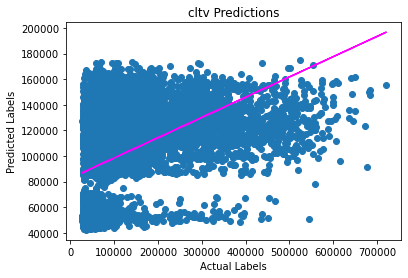

**************************************************



(71513, 10) (17879, 10)
model_1
MSE: 6786994172.140711
RMSE: 82383.21535446835
R2: 0.15955534413072148


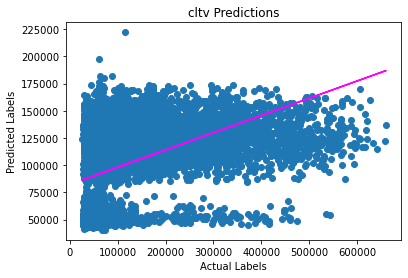

**************************************************



(71514, 10) (17878, 10)
model_2
MSE: 7103068609.453619
RMSE: 84279.70461180805
R2: 0.1564860177586661


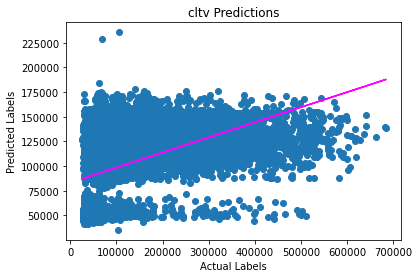

**************************************************



(71514, 10) (17878, 10)
model_3
MSE: 6867654547.163231
RMSE: 82871.31317387961
R2: 0.1648486456580801


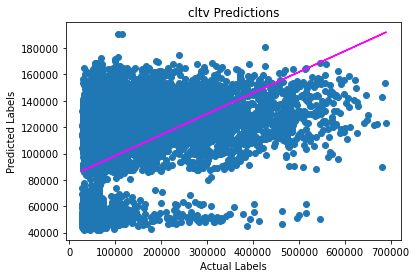

**************************************************



(71514, 10) (17878, 10)
model_4
MSE: 7006212908.317569
RMSE: 83703.12364731419
R2: 0.1589795492341205


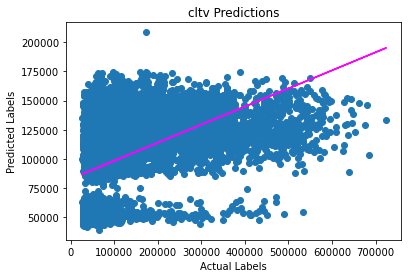

**************************************************





In [22]:
import pandas as pd

# load the training dataset
data = pd.read_csv('train_BRCpofr.csv')
data.head()


# Split the data into features and target
import numpy as np
X = data.drop(['id','cltv'], axis=1)
y = data['cltv']



# Train the model
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor,AdaBoostRegressor
import xgboost as xg
import numpy as np

# Define preprocessing for numeric columns (scale them)
numeric_features = [5,6]
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())])

# Define preprocessing for categorical features (encode them)
categorical_features = [0,1,2,3,4,7,8,9]
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

# Create preprocessing and training pipeline
pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('regressor', GradientBoostingRegressor(n_estimators=85,max_depth=3,learning_rate=0.075))])



from sklearn.model_selection import KFold
# Define the number of splits and the random seed
kf = KFold(n_splits=5, random_state=42, shuffle=True)

for fold,(train_index, test_index) in enumerate(kf.split(X)):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    print(X_train.shape, X_test.shape)
    print (f"model_{fold}")
    model = pipeline.fit(X_train, (y_train))
    
    # Get predictions
    import matplotlib.pyplot as plt
    import seaborn as sns
    %matplotlib inline
    from sklearn.metrics import mean_squared_error, r2_score
    predictions = model.predict(X_test)
    
    # Display metrics
    mse = mean_squared_error(y_test, predictions)
    print("MSE:", mse)
    rmse = np.sqrt(mse)
    print("RMSE:", rmse)
    r2 = r2_score(y_test, predictions)
    print("R2:", r2)

    # Plot predicted vs actual
    plt.scatter(y_test, predictions)
    plt.xlabel('Actual Labels')
    plt.ylabel('Predicted Labels')
    plt.title('cltv Predictions')
    z = np.polyfit(y_test, predictions, 1)
    p = np.poly1d(z)
    plt.plot(y_test,p(y_test), color='magenta')
    plt.show()
    
    import pandas as pd
    # train = pd.read_csv('train.csv')
    test  = pd.read_csv("test_koRSKBP.csv")
    predictions = model.predict(test.drop(['id'],axis=1))

    # predictions = model.predict(test)
    # predictions = scaler_y.inverse_transform(predictions)
    # #taking the mean of cltv from the training set
    # test['cltv']=train['cltv'].mean()
    test_id=test['id']
    df = pd.DataFrame({'id':np.array(test_id),'cltv':predictions}, columns = ['id','cltv'])
    #creating the sample submission file
    sample_submission = df[['id','cltv']]
    sample_submission.to_csv(f"sample_submission_GBR_model_{fold}.csv",index=False)
    
    print("*"*50)
    print("\n\n")
    
    

In [23]:
for f,i in enumerate(range(10,20,2)):
    print(i+f,i)

10 10
13 12
16 14
19 16
22 18


In [ ]:
import pandas as pd

# load the training dataset
data = pd.read_csv('train_BRCpofr.csv')
data.head()


# Split the data into features and target
import numpy as np
X = data.drop(['id','cltv'], axis=1)
y = data['cltv']



# Train the model
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor,AdaBoostRegressor
import xgboost as xg
import numpy as np

# Define preprocessing for numeric columns (scale them)
numeric_features = [5,6]
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())])

# Define preprocessing for categorical features (encode them)
categorical_features = [0,1,2,3,4,7,8,9]
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

# Create preprocessing and training pipeline
pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('regressor', GradientBoostingRegressor(n_estimators=85,max_depth=3,learning_rate=0.075))])

import optuna

# Define the objective function
def objective(trial):
    n_estimators = trial.suggest_int('n_estimators', 50, 150)
    max_depth = trial.suggest_int('max_depth', 2, 6)
    learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)
    
    model = pipeline.set_params(regressor__n_estimators=n_estimators,
                                regressor__max_depth=max_depth,
                                regressor__learning_rate=learning_rate)
    
    score = 0
    for fold,(train_index, test_index) in enumerate(kf.split(X)):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        model.fit(X_train, y_train)
        predictions = model.predict(X_test)
        score += mean_squared_error(y_test, predictions)
    
    return score

study = optuna.create_study()
study.optimize(objective, n_trials=100)

best_params = study.best_params
best_value = study.best_value

print("Best MSE:", best_value)
print("Best Parameters:", best_params)



[I 2023-01-24 07:04:10,260] A new study created in memory with name: no-name-cef5cd1c-de19-4834-aacb-7382117b0ce7
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6735917720.490564
RMSE: 82072.63685596171
R2: 0.15820703329790264


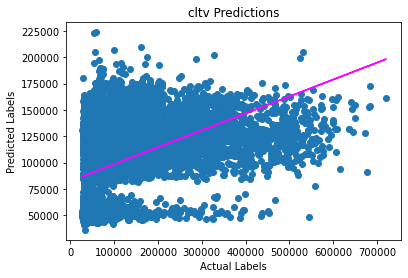

MSE: 6798328871.715268
RMSE: 82451.97918616186
R2: 0.1581517496319338


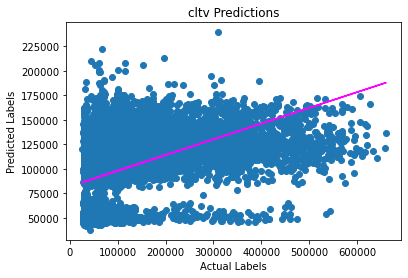

MSE: 7117335733.327041
RMSE: 84364.3036676475
R2: 0.15479174741787516


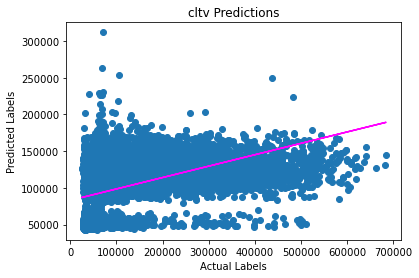

MSE: 6872407672.6319065
RMSE: 82899.9859627968
R2: 0.16427063475999837


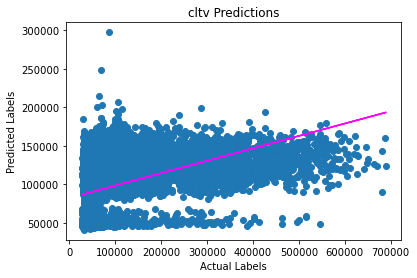

MSE: 7015532461.786968
RMSE: 83758.77543151504
R2: 0.15786083714781407


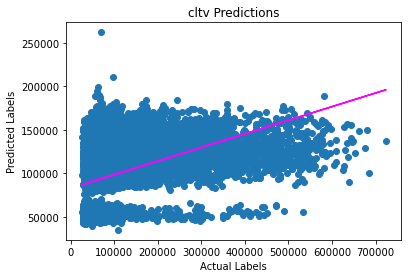

[I 2023-01-24 07:04:56,154] Trial 0 finished with value: 34539522459.95175 and parameters: {'n_estimators': 113, 'max_depth': 5, 'learning_rate': 0.05470391128803177}. Best is trial 0 with value: 34539522459.95175.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6728545824.193892
RMSE: 82027.71375696077
R2: 0.1591283050104294


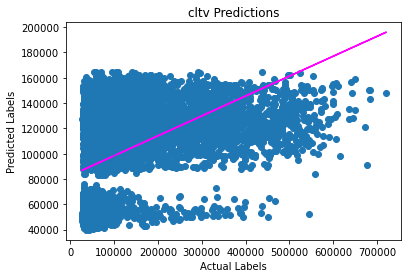

MSE: 6793135426.716972
RMSE: 82420.4794132925
R2: 0.15879486247153007


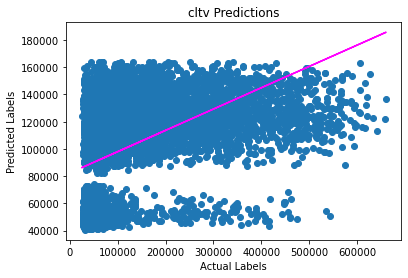

MSE: 7101577884.0633
RMSE: 84270.860230944
R2: 0.15666304655840801


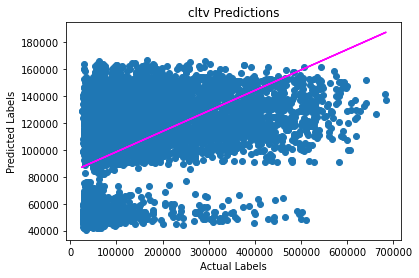

MSE: 6880086030.927952
RMSE: 82946.2840091583
R2: 0.1633368965694667


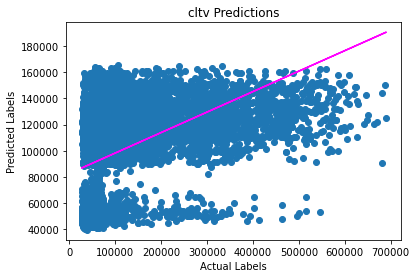

MSE: 7014014422.664141
RMSE: 83749.71297063734
R2: 0.15804306140563606


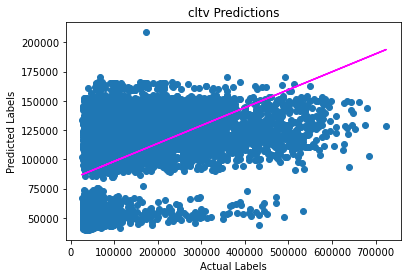

[I 2023-01-24 07:05:10,651] Trial 1 finished with value: 34517359588.56625 and parameters: {'n_estimators': 73, 'max_depth': 2, 'learning_rate': 0.09821651165773984}. Best is trial 1 with value: 34517359588.56625.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6732698385.953018
RMSE: 82053.02179659819
R2: 0.15860935608206062


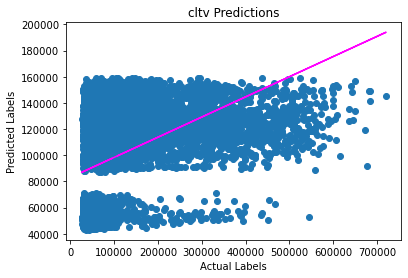

MSE: 6802303767.00367
RMSE: 82476.07996870166
R2: 0.15765953180795367


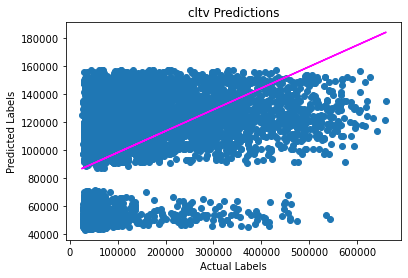

MSE: 7105930897.193143
RMSE: 84296.68378526608
R2: 0.156146111182757


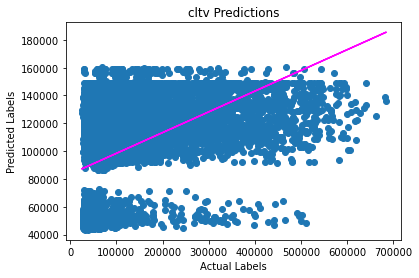

MSE: 6890557716.602867
RMSE: 83009.383304557
R2: 0.1620634716449033


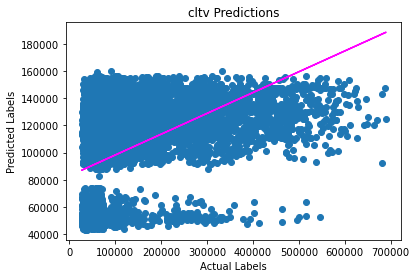

MSE: 7022490607.744713
RMSE: 83800.30195497336
R2: 0.15702558661711308


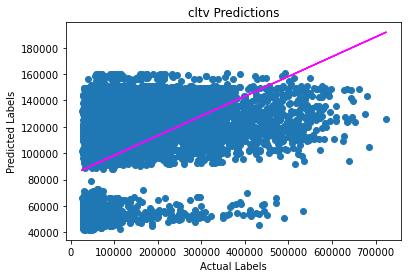

[I 2023-01-24 07:05:27,815] Trial 2 finished with value: 34553981374.497406 and parameters: {'n_estimators': 87, 'max_depth': 2, 'learning_rate': 0.06100654485467587}. Best is trial 1 with value: 34517359588.56625.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6731217204.035778
RMSE: 82043.995539197
R2: 0.15879446055810653


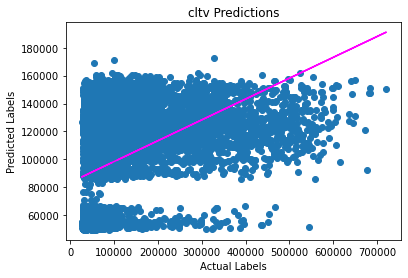

MSE: 6797571193.145688
RMSE: 82447.38439238499
R2: 0.158245574215913


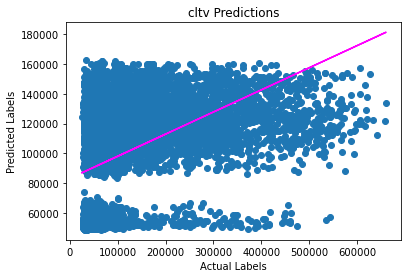

MSE: 7107663281.737372
RMSE: 84306.95867920615
R2: 0.15594038452206682


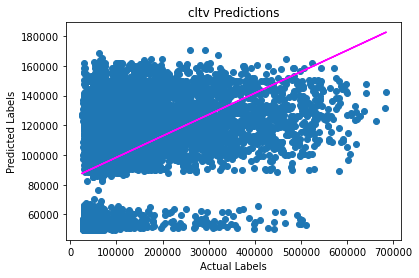

MSE: 6882920372.136759
RMSE: 82963.36765185438
R2: 0.1629922222875927


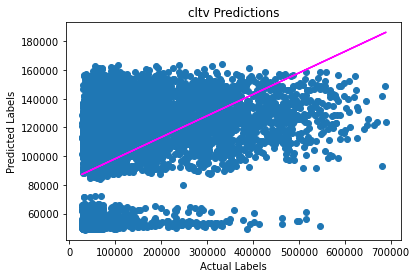

MSE: 7025257073.779534
RMSE: 83816.80663076788
R2: 0.1566935021455047


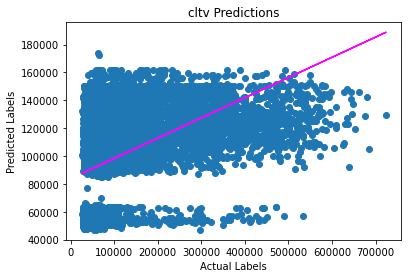

[I 2023-01-24 07:05:46,316] Trial 3 finished with value: 34544629124.83513 and parameters: {'n_estimators': 54, 'max_depth': 4, 'learning_rate': 0.050013186796296245}. Best is trial 1 with value: 34517359588.56625.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6958833178.945215
RMSE: 83419.62106690017
R2: 0.13034911209356925


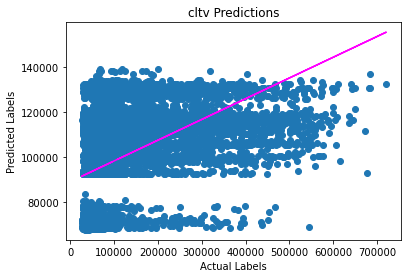

MSE: 7030868321.098686
RMSE: 83850.27323210513
R2: 0.12935600698708116


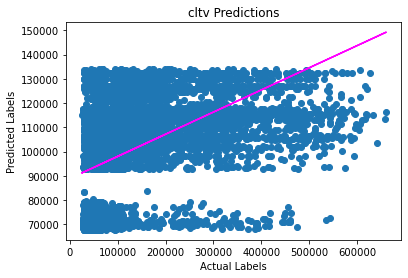

MSE: 7353510483.733823
RMSE: 85752.61211026649
R2: 0.12674517836807941


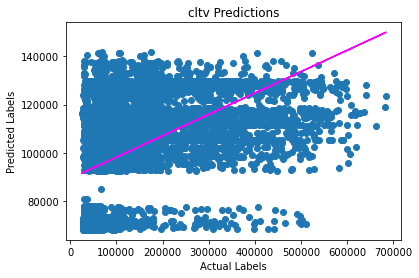

MSE: 7138772962.977451
RMSE: 84491.25968393093
R2: 0.1318788871183456


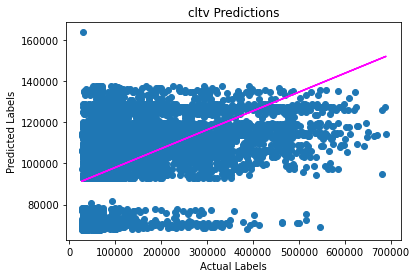

MSE: 7270011397.471087
RMSE: 85264.3618252731
R2: 0.12731337991233682


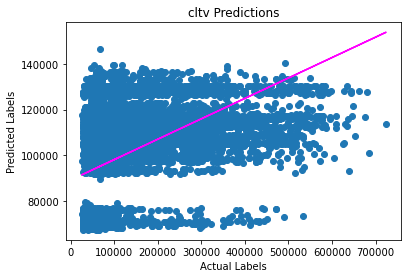

[I 2023-01-24 07:06:08,163] Trial 4 finished with value: 35751996344.226265 and parameters: {'n_estimators': 57, 'max_depth': 5, 'learning_rate': 0.014942925162815136}. Best is trial 1 with value: 34517359588.56625.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6772708727.847416
RMSE: 82296.4685016764
R2: 0.15360923200103227


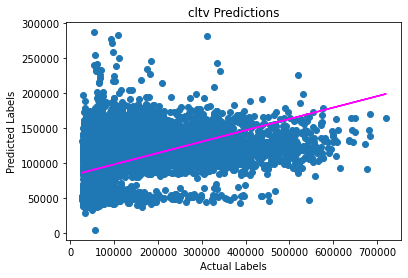

MSE: 6834629820.089198
RMSE: 82671.81998776365
R2: 0.15365654346407087


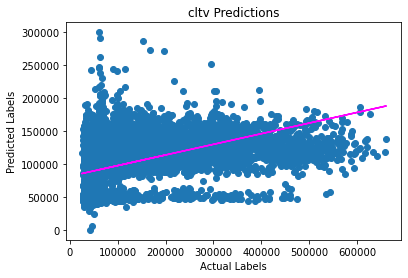

MSE: 7140737213.2958765
RMSE: 84502.88286973337
R2: 0.1520127406752707


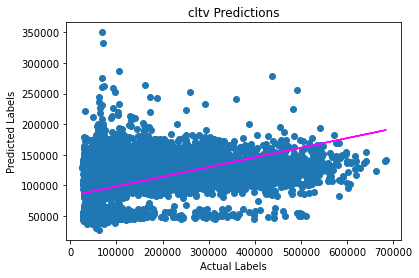

MSE: 6905042217.525763
RMSE: 83096.583669401
R2: 0.16030206234866562


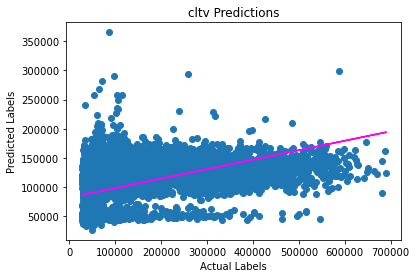

MSE: 7035314684.821984
RMSE: 83876.78275197484
R2: 0.15548619419137333


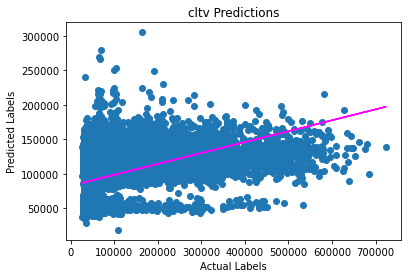

[I 2023-01-24 07:07:01,734] Trial 5 finished with value: 34688432663.58024 and parameters: {'n_estimators': 137, 'max_depth': 5, 'learning_rate': 0.09622170472177272}. Best is trial 1 with value: 34517359588.56625.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6725882030.750508
RMSE: 82011.47499435983
R2: 0.15946120138452946


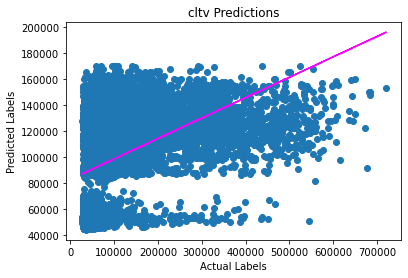

MSE: 6788557428.964483
RMSE: 82392.70252252006
R2: 0.15936176346600184


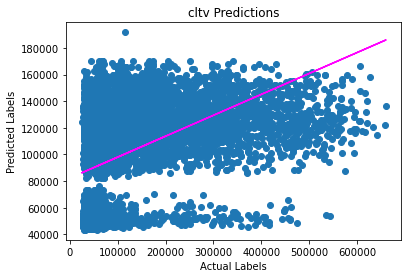

MSE: 7101642390.237688
RMSE: 84271.24296127172
R2: 0.1566553862269331


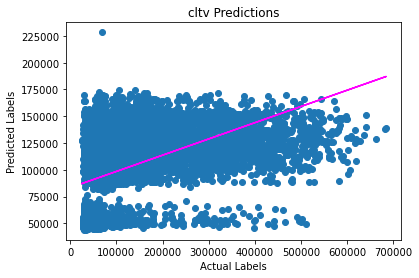

MSE: 6869910810.7655
RMSE: 82884.92511166008
R2: 0.16457426936407082


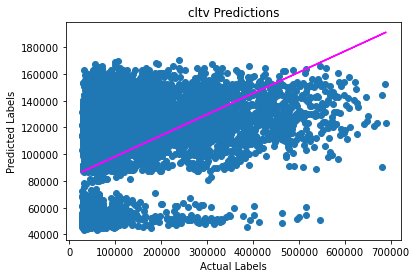

MSE: 7009192541.021107
RMSE: 83720.92056959901
R2: 0.1586218763982764


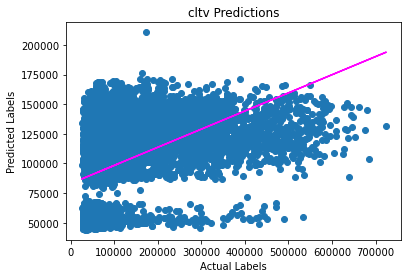

[I 2023-01-24 07:07:19,097] Trial 6 finished with value: 34495185201.73929 and parameters: {'n_estimators': 68, 'max_depth': 3, 'learning_rate': 0.07496524805087876}. Best is trial 6 with value: 34495185201.73929.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6729382367.258744
RMSE: 82032.81274745334
R2: 0.15902376156177744


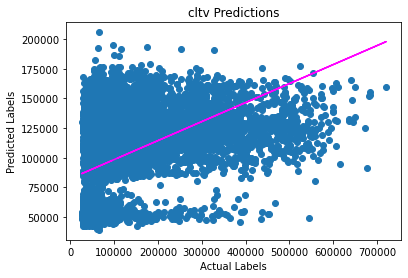

MSE: 6790140834.296217
RMSE: 82402.31085531654
R2: 0.15916568777838846


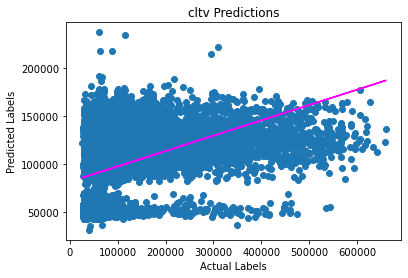

MSE: 7103864072.196093
RMSE: 84284.42366295266
R2: 0.1563915538047722


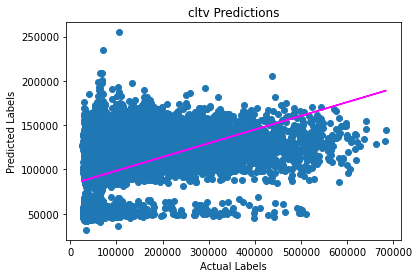

MSE: 6862068072.678735
RMSE: 82837.60059706423
R2: 0.16552799720374733


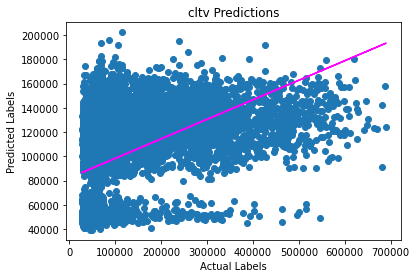

MSE: 7004373932.387114
RMSE: 83692.13781704416
R2: 0.15920029850140915


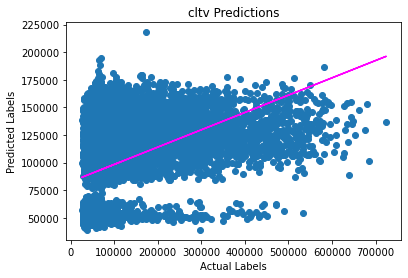

[I 2023-01-24 07:07:58,344] Trial 7 finished with value: 34489829278.8169 and parameters: {'n_estimators': 123, 'max_depth': 4, 'learning_rate': 0.05625742483064881}. Best is trial 7 with value: 34489829278.8169.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6726237166.404742
RMSE: 82013.64012409608
R2: 0.15941681980085154


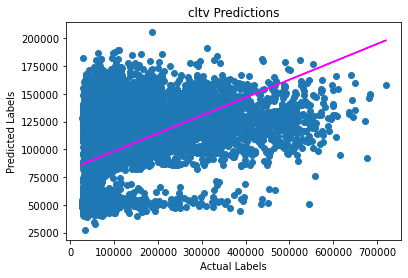

MSE: 6791874446.972278
RMSE: 82412.82938336894
R2: 0.15895101166817116


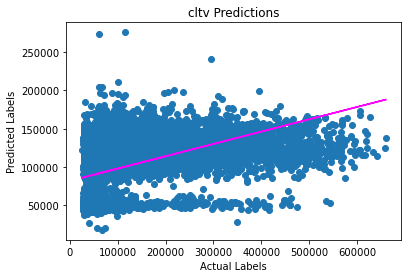

MSE: 7107078270.296678
RMSE: 84303.48907546281
R2: 0.15600985665546852


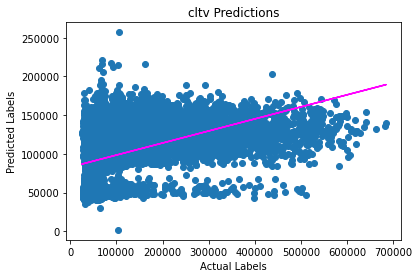

MSE: 6864074581.645211
RMSE: 82849.71081207955
R2: 0.16528399269400618


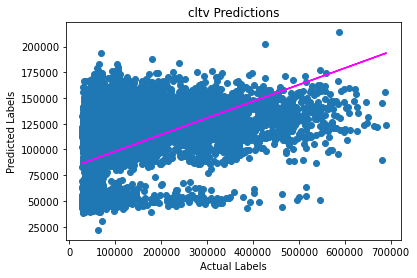

MSE: 7004243978.454354
RMSE: 83691.3614326733
R2: 0.15921589807232406


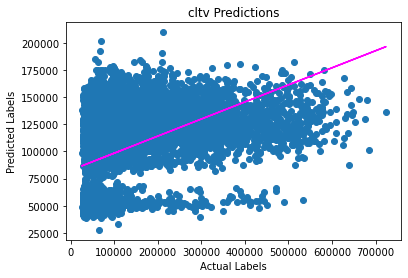

[I 2023-01-24 07:08:24,812] Trial 8 finished with value: 34493508443.77326 and parameters: {'n_estimators': 105, 'max_depth': 3, 'learning_rate': 0.11423740844492619}. Best is trial 7 with value: 34489829278.8169.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6748833619.92164
RMSE: 82151.28495599834
R2: 0.15659292312748918


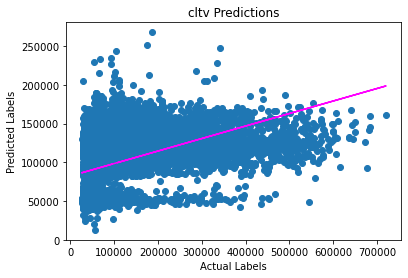

MSE: 6815062247.694452
RMSE: 82553.39028588985
R2: 0.15607962815080967


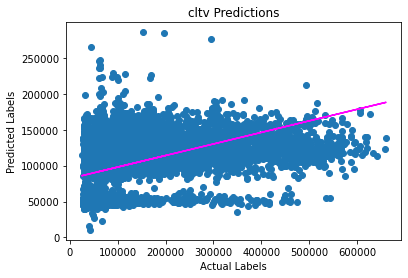

MSE: 7131147579.959196
RMSE: 84446.12235004753
R2: 0.15315154282527266


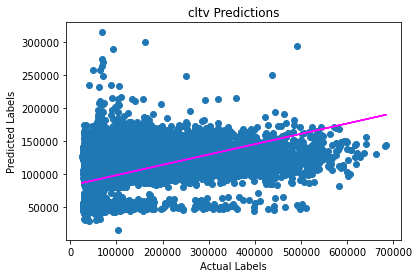

MSE: 6874617670.558225
RMSE: 82913.3141935493
R2: 0.16400188467238375


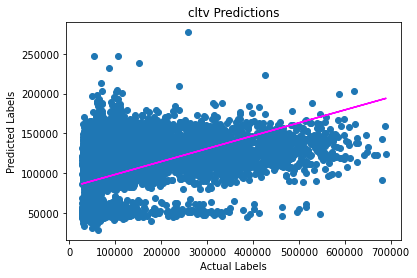

MSE: 7013763610.59369
RMSE: 83748.21556662381
R2: 0.1580731686951673


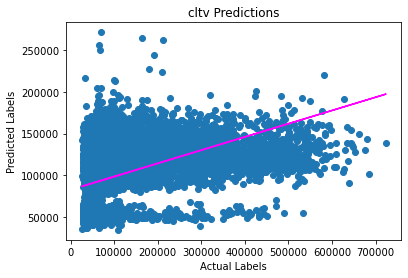

[I 2023-01-24 07:09:11,900] Trial 9 finished with value: 34583424728.7272 and parameters: {'n_estimators': 136, 'max_depth': 4, 'learning_rate': 0.1039733014908356}. Best is trial 7 with value: 34489829278.8169.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6842135369.070392
RMSE: 82717.2011680182
R2: 0.14493292971998328


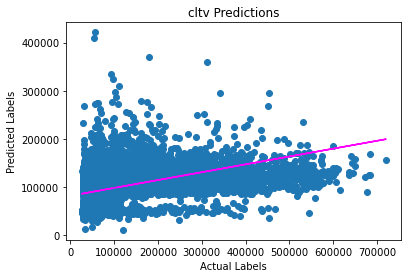

MSE: 6928630238.897349
RMSE: 83238.39401921057
R2: 0.14201631693182004


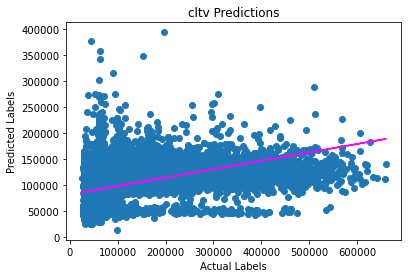

MSE: 7233848089.576991
RMSE: 85052.03166048999
R2: 0.14095550184509353


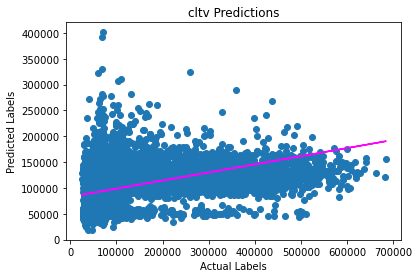

MSE: 6985521964.120895
RMSE: 83579.43505504745
R2: 0.150515202962475


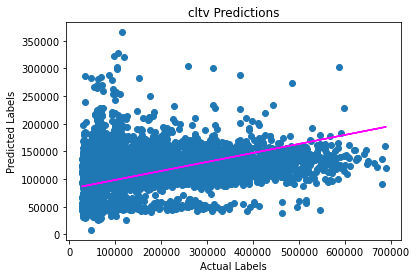

MSE: 7130338767.643375
RMSE: 84441.33328911485
R2: 0.14407957580654163


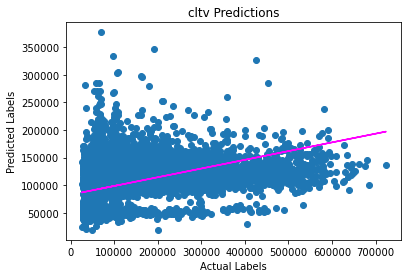

[I 2023-01-24 07:10:10,905] Trial 10 finished with value: 35120474429.309006 and parameters: {'n_estimators': 121, 'max_depth': 6, 'learning_rate': 0.15749443751691752}. Best is trial 7 with value: 34489829278.8169.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6739402577.207408
RMSE: 82093.86443095127
R2: 0.15777152799692784


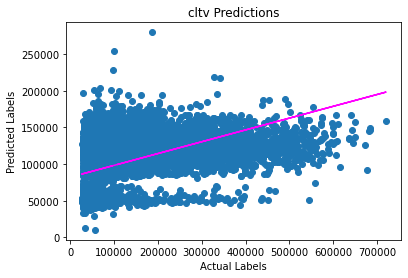

MSE: 6797291550.2583475
RMSE: 82445.68848798794
R2: 0.1582802028547855


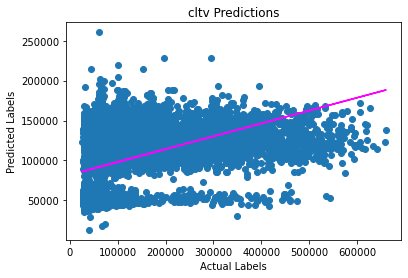

MSE: 7114527596.17988
RMSE: 84347.65910314216
R2: 0.1551252234235172


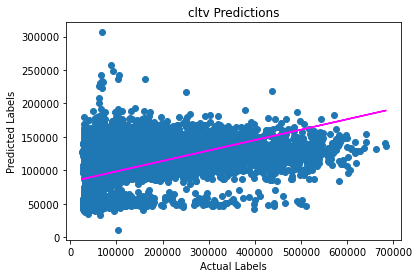

MSE: 6866625663.668173
RMSE: 82865.10522329753
R2: 0.16497376456708424


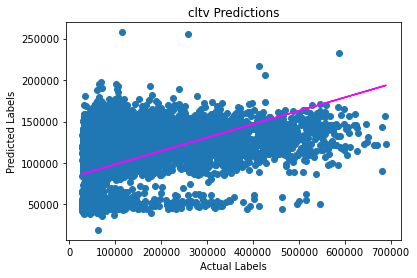

MSE: 7010881885.982131
RMSE: 83731.00910643638
R2: 0.1584190887183683


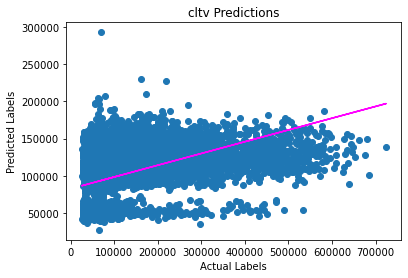

[I 2023-01-24 07:10:37,607] Trial 11 finished with value: 34528729273.295944 and parameters: {'n_estimators': 101, 'max_depth': 3, 'learning_rate': 0.1513259325579231}. Best is trial 7 with value: 34489829278.8169.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6734476554.250657
RMSE: 82063.85656457207
R2: 0.15838713698309337


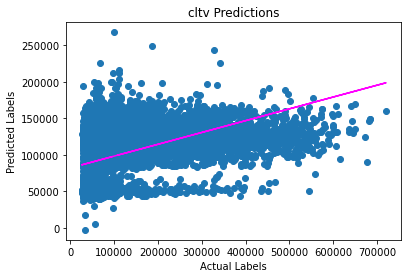

MSE: 6797207752.628873
RMSE: 82445.18028744234
R2: 0.15829057965312654


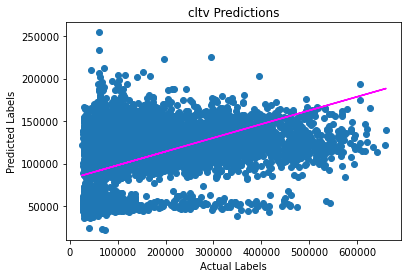

MSE: 7119412271.66773
RMSE: 84376.60974267531
R2: 0.15454515130268331


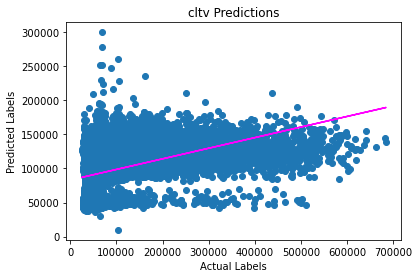

MSE: 6862498671.33585
RMSE: 82840.19960946406
R2: 0.16547563361306317


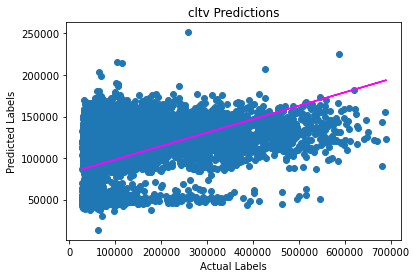

MSE: 7003279849.860148
RMSE: 83685.60120988644
R2: 0.15933163133300365


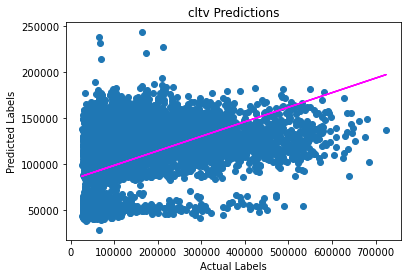

[I 2023-01-24 07:11:11,219] Trial 12 finished with value: 34516875099.743256 and parameters: {'n_estimators': 118, 'max_depth': 3, 'learning_rate': 0.13149308835798562}. Best is trial 7 with value: 34489829278.8169.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6753327754.7791815
RMSE: 82178.63320096764
R2: 0.1560312875387735


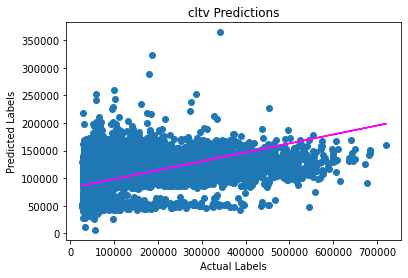

MSE: 6823863944.564849
RMSE: 82606.68220286327
R2: 0.15498969954476038


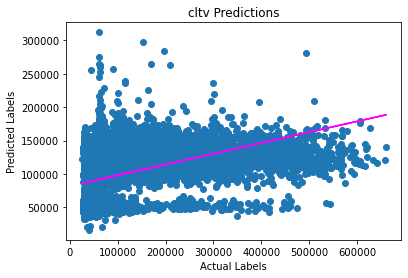

MSE: 7141643763.741521
RMSE: 84508.24672031435
R2: 0.15190508467213282


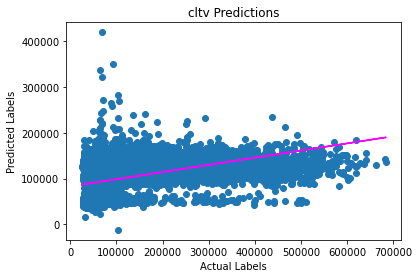

MSE: 6890712772.596709
RMSE: 83010.31726596826
R2: 0.1620446158299571


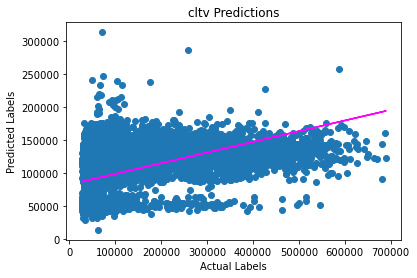

MSE: 7033046392.540212
RMSE: 83863.26008771786
R2: 0.155758478265844


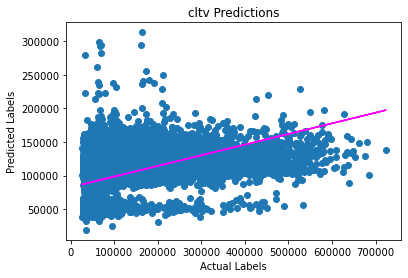

[I 2023-01-24 07:11:51,150] Trial 13 finished with value: 34642594628.22247 and parameters: {'n_estimators': 148, 'max_depth': 3, 'learning_rate': 0.19625065737611685}. Best is trial 7 with value: 34489829278.8169.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6735390723.735362
RMSE: 82069.4262422698
R2: 0.15827289249933774


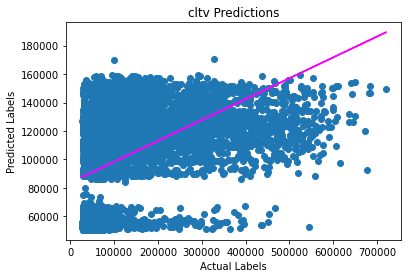

MSE: 6801876806.640196
RMSE: 82473.49153904057
R2: 0.1577124030122965


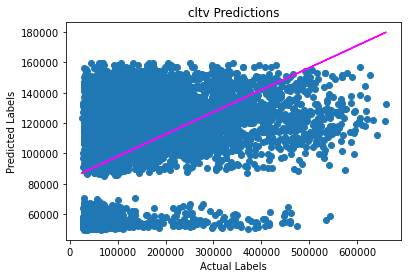

MSE: 7111997116.288088
RMSE: 84332.65747199058
R2: 0.1554257266690674


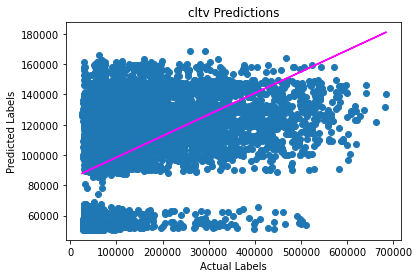

MSE: 6889452993.303325
RMSE: 83002.7288304627
R2: 0.16219781316622617


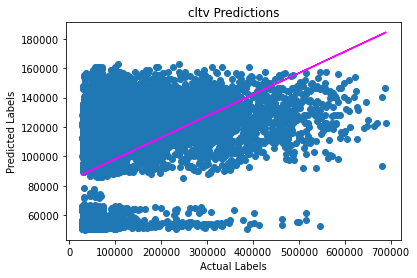

MSE: 7029649943.124943
RMSE: 83843.00771754877
R2: 0.15616618546167316


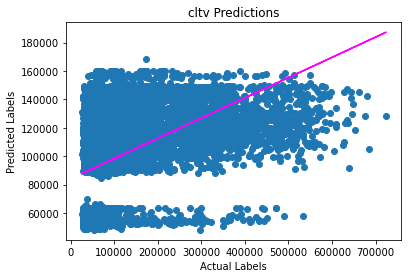

[I 2023-01-24 07:12:23,972] Trial 14 finished with value: 34568367583.09191 and parameters: {'n_estimators': 100, 'max_depth': 4, 'learning_rate': 0.02508823322739592}. Best is trial 7 with value: 34489829278.8169.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6727533215.484388
RMSE: 82021.54116745423
R2: 0.15925485152198915


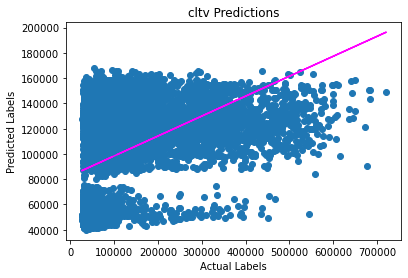

MSE: 6792548321.358999
RMSE: 82416.91768902182
R2: 0.1588675646940494


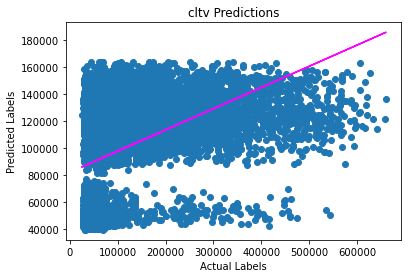

MSE: 7099591432.314943
RMSE: 84259.07329371088
R2: 0.15689894457895603


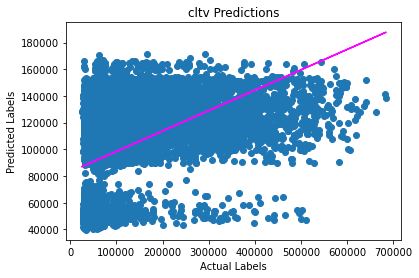

MSE: 6875236635.604184
RMSE: 82917.04671299011
R2: 0.1639266145065834


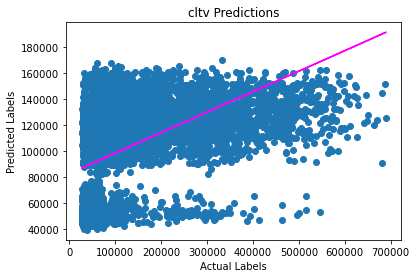

MSE: 7010927724.946262
RMSE: 83731.28283351607
R2: 0.15841358624409563


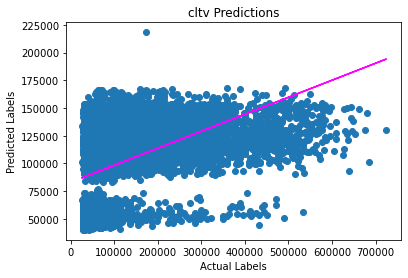

[I 2023-01-24 07:12:42,754] Trial 15 finished with value: 34505837329.70878 and parameters: {'n_estimators': 99, 'max_depth': 2, 'learning_rate': 0.08111907160005033}. Best is trial 7 with value: 34489829278.8169.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6732742920.515722
RMSE: 82053.29317288687
R2: 0.15860379056252571


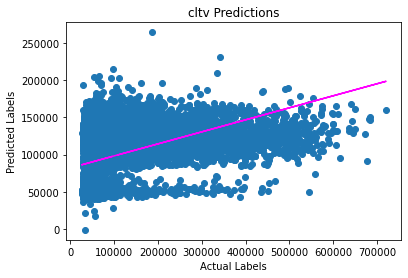

MSE: 6795367435.697663
RMSE: 82434.01867977603
R2: 0.15851846912683354


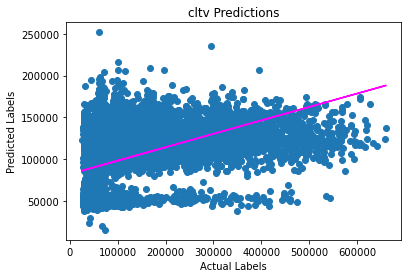

MSE: 7111438053.474238
RMSE: 84329.34277862147
R2: 0.15549211731321877


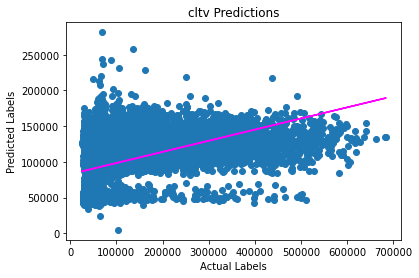

MSE: 6863273955.033502
RMSE: 82844.87887029289
R2: 0.16538135408492938


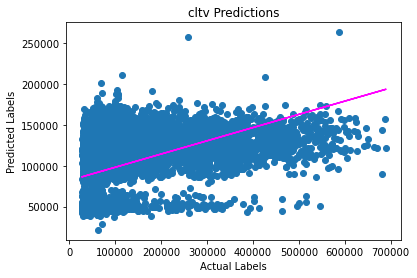

MSE: 7002042194.426718
RMSE: 83678.206209423
R2: 0.15948019854672346


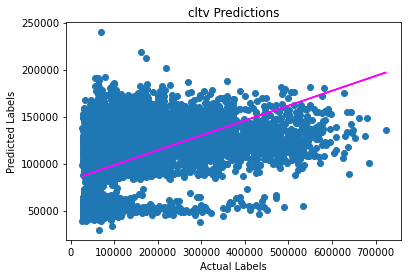

[I 2023-01-24 07:13:18,326] Trial 16 finished with value: 34504864559.14784 and parameters: {'n_estimators': 127, 'max_depth': 3, 'learning_rate': 0.12176226232680695}. Best is trial 7 with value: 34489829278.8169.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6735460336.174927
RMSE: 82069.85034819381
R2: 0.1582641929776909


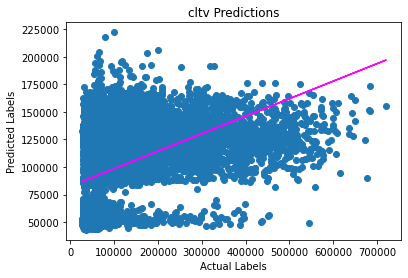

MSE: 6801575328.68812
RMSE: 82471.66379240884
R2: 0.1577497355231634


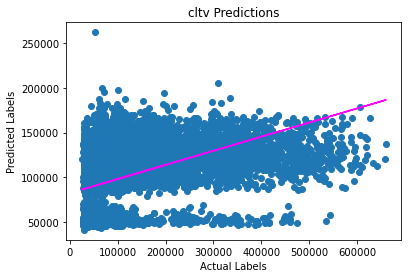

MSE: 7116553907.892651
RMSE: 84359.66991336945
R2: 0.1548845918942332


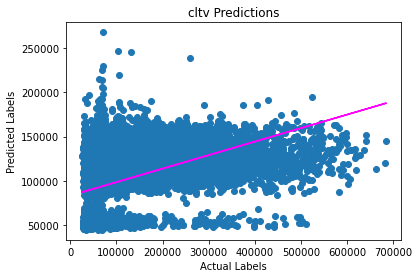

MSE: 6875311390.47184
RMSE: 82917.49749282017
R2: 0.16391752382962277


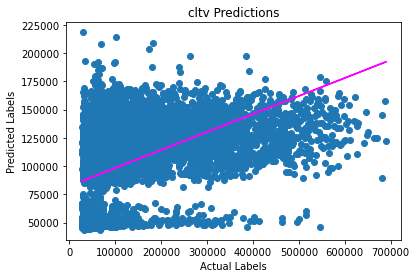

MSE: 7027465379.527887
RMSE: 83829.97900231091
R2: 0.15642841880872738


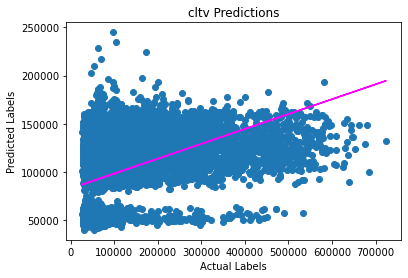

[I 2023-01-24 07:14:10,218] Trial 17 finished with value: 34556366342.755424 and parameters: {'n_estimators': 110, 'max_depth': 6, 'learning_rate': 0.03520935405212629}. Best is trial 7 with value: 34489829278.8169.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6726055908.613395
RMSE: 82012.53507003302
R2: 0.1594394717304397


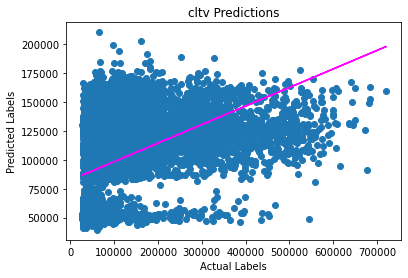

MSE: 6791503130.469006
RMSE: 82410.57656920624
R2: 0.15899699240174725


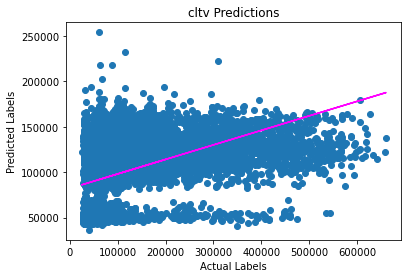

MSE: 7108213590.2392025
RMSE: 84310.2223353681
R2: 0.15587503348276777


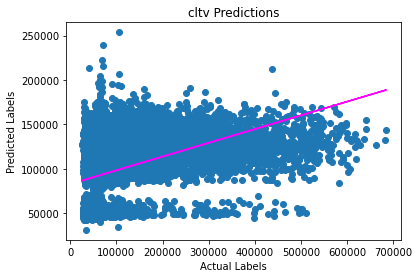

MSE: 6864480321.005274
RMSE: 82852.15942270469
R2: 0.16523465215514554


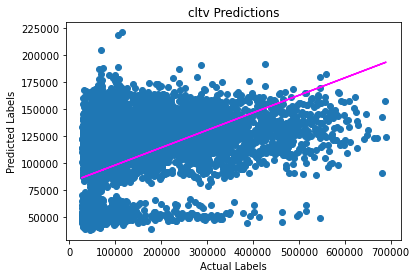

MSE: 7009139535.821037
RMSE: 83720.60401013025
R2: 0.15862823910204216


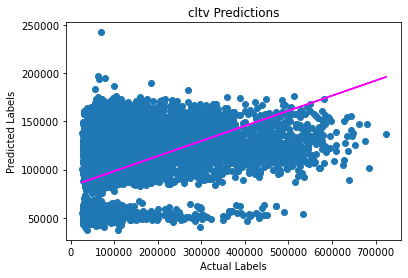

[I 2023-01-24 07:14:39,513] Trial 18 finished with value: 34499392486.14791 and parameters: {'n_estimators': 87, 'max_depth': 4, 'learning_rate': 0.07661388472134277}. Best is trial 7 with value: 34489829278.8169.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6728658216.919244
RMSE: 82028.39884405427
R2: 0.1591142592026219


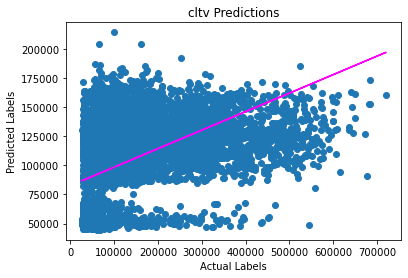

MSE: 6795476551.177981
RMSE: 82434.6805123789
R2: 0.15850495717736368


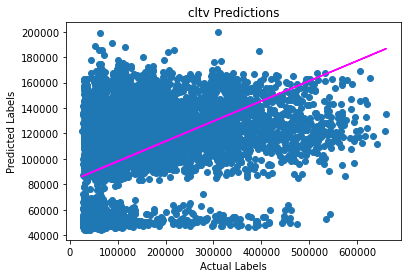

MSE: 7108995090.949958
RMSE: 84314.85688151263
R2: 0.15578222756846538


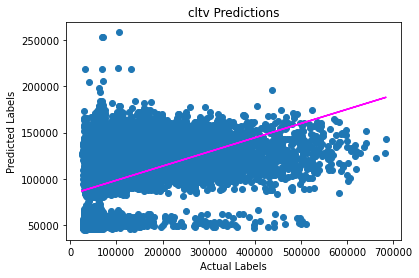

MSE: 6868193110.065535
RMSE: 82874.56250301134
R2: 0.1647831529146453


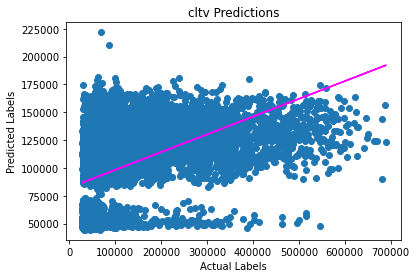

MSE: 7013739345.655963
RMSE: 83748.07069811199
R2: 0.15807608143977436


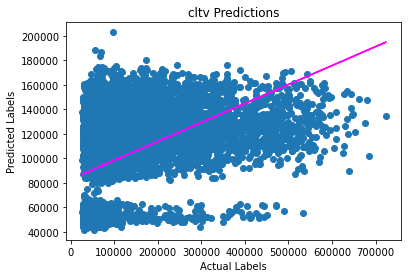

[I 2023-01-24 07:15:34,993] Trial 19 finished with value: 34515062314.76868 and parameters: {'n_estimators': 131, 'max_depth': 5, 'learning_rate': 0.033638352788696826}. Best is trial 7 with value: 34489829278.8169.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6757455330.484918
RMSE: 82203.74280095109
R2: 0.15551546113726478


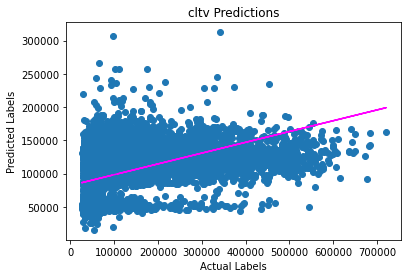

MSE: 6827496608.029406
RMSE: 82628.66698688419
R2: 0.15453986085064597


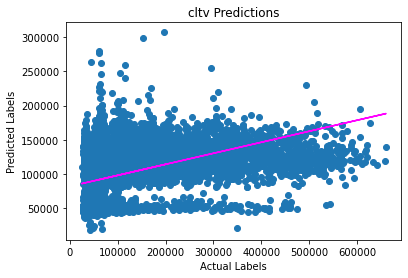

MSE: 7155070807.983259
RMSE: 84587.65162825635
R2: 0.15031057669525572


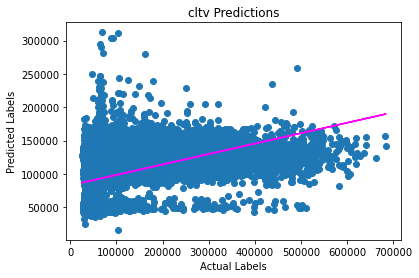

MSE: 6875985343.203173
RMSE: 82921.56138908127
R2: 0.16383556680448852


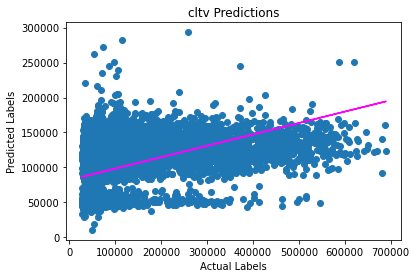

MSE: 7023997770.214721
RMSE: 83809.29405629617
R2: 0.15684466798439511


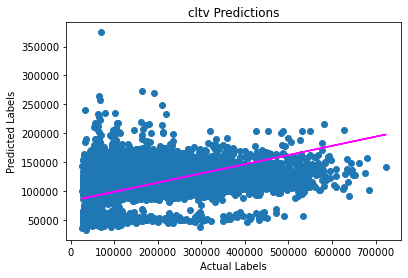

[I 2023-01-24 07:16:29,448] Trial 20 finished with value: 34640005859.915474 and parameters: {'n_estimators': 150, 'max_depth': 4, 'learning_rate': 0.12337717680572718}. Best is trial 7 with value: 34489829278.8169.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6724941674.984354
RMSE: 82005.74171961591
R2: 0.1595787183885954


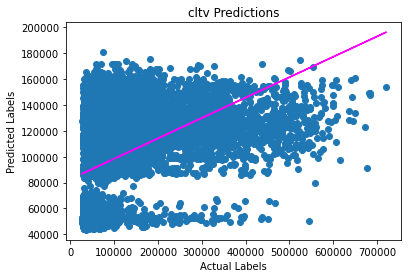

MSE: 6788021796.068687
RMSE: 82389.45197092093
R2: 0.15942809176883543


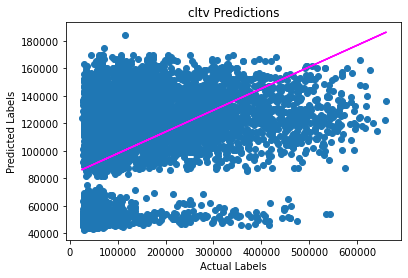

MSE: 7101820796.376081
RMSE: 84272.30147786449
R2: 0.15663419988050653


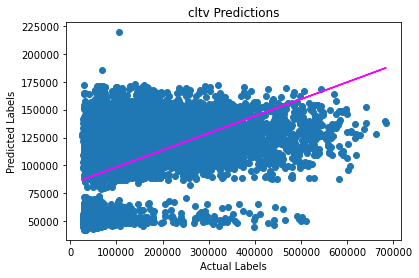

MSE: 6872323772.053134
RMSE: 82899.47992631276
R2: 0.16428083761477374


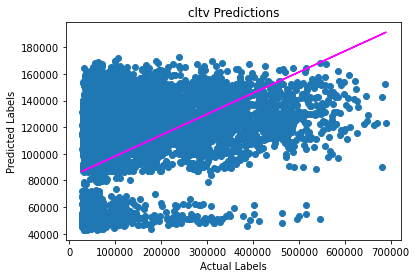

MSE: 7007299552.028916
RMSE: 83709.61445394978
R2: 0.15884910935227592


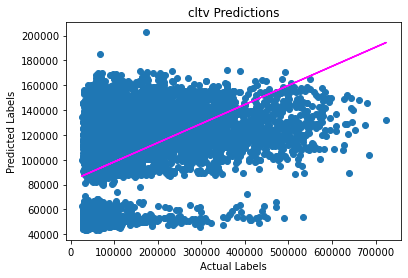

[I 2023-01-24 07:16:51,992] Trial 21 finished with value: 34494407591.51118 and parameters: {'n_estimators': 79, 'max_depth': 3, 'learning_rate': 0.06773393825258224}. Best is trial 7 with value: 34489829278.8169.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6725681746.06241
RMSE: 82010.25390804744
R2: 0.1594862311204579


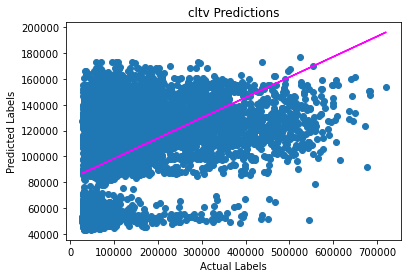

MSE: 6787712998.230024
RMSE: 82387.5779364221
R2: 0.15946633071330274


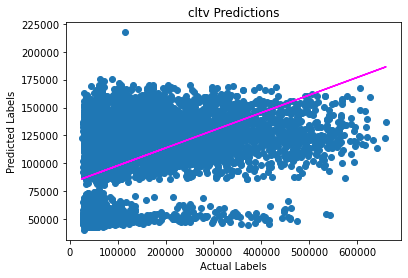

MSE: 7102450174.039926
RMSE: 84276.03558568667
R2: 0.15655945910454716


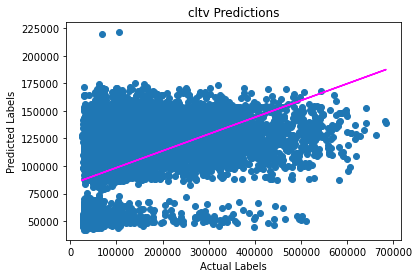

MSE: 6870026058.082442
RMSE: 82885.62033358043
R2: 0.16456025454253775


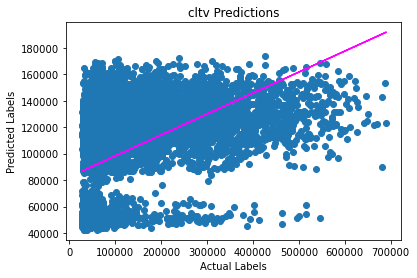

MSE: 7007025050.342322
RMSE: 83707.97483120902
R2: 0.15888206032525043


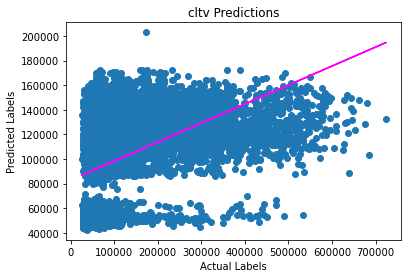

[I 2023-01-24 07:17:15,636] Trial 22 finished with value: 34492896026.757126 and parameters: {'n_estimators': 85, 'max_depth': 3, 'learning_rate': 0.0675391633003154}. Best is trial 7 with value: 34489829278.8169.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6736508062.644047
RMSE: 82076.23323864251
R2: 0.15813325777192822


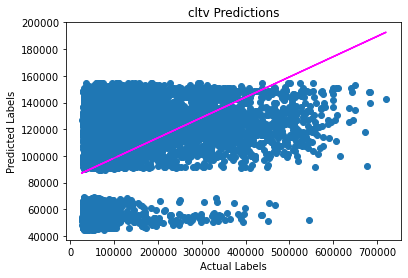

MSE: 6807541569.813883
RMSE: 82507.8273245265
R2: 0.15701092606751987


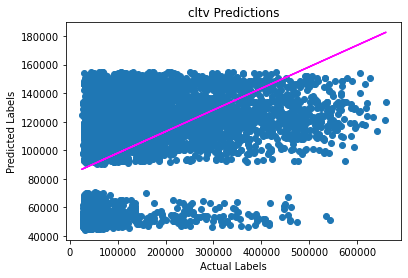

MSE: 7111489413.567109
RMSE: 84329.6472989607
R2: 0.15548601812442475


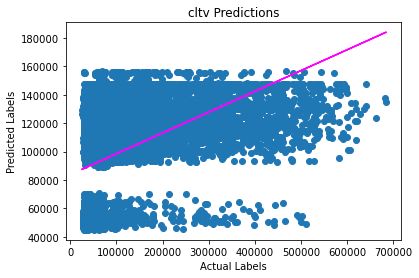

MSE: 6897697109.528055
RMSE: 83052.37570068694
R2: 0.16119527514059417


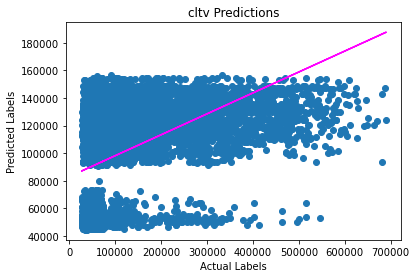

MSE: 7028235259.465392
RMSE: 83834.57078953403
R2: 0.15633600300855854


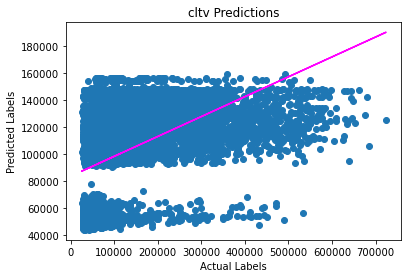

[I 2023-01-24 07:17:32,733] Trial 23 finished with value: 34581471415.018486 and parameters: {'n_estimators': 90, 'max_depth': 2, 'learning_rate': 0.050770375385540356}. Best is trial 7 with value: 34489829278.8169.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6728158588.127116
RMSE: 82025.3533252196
R2: 0.15917669820805913


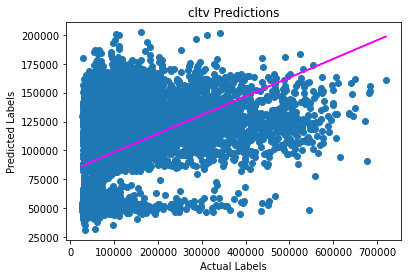

MSE: 6793765757.897518
RMSE: 82424.30319934478
R2: 0.15871680752427642


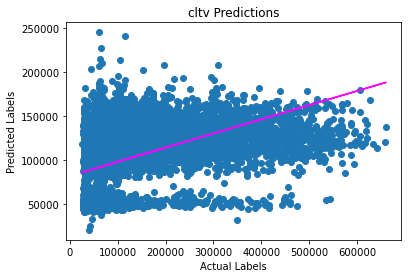

MSE: 7112625784.243852
RMSE: 84336.38469986635
R2: 0.155351070173399


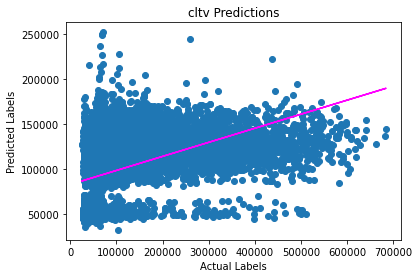

MSE: 6862437247.189934
RMSE: 82839.82886987354
R2: 0.16548310318776283


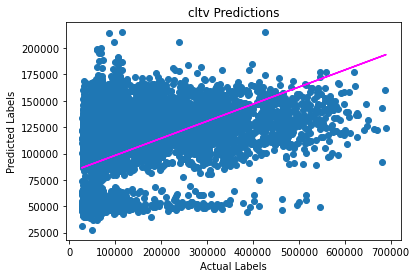

MSE: 7009829957.567358
RMSE: 83724.72727675713
R2: 0.15854536140250497


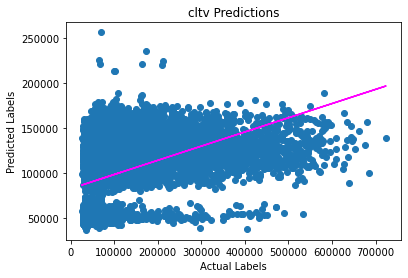

[I 2023-01-24 07:18:07,910] Trial 24 finished with value: 34506817335.02578 and parameters: {'n_estimators': 105, 'max_depth': 4, 'learning_rate': 0.08609119121918507}. Best is trial 7 with value: 34489829278.8169.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6726455473.114756
RMSE: 82014.97103038417
R2: 0.15938953783858612


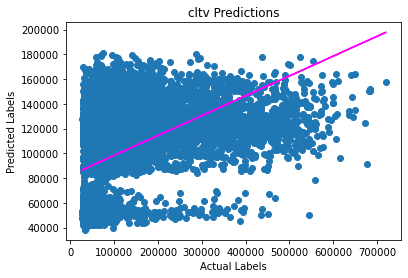

MSE: 6785861774.927147
RMSE: 82376.34232549505
R2: 0.15969557074095897


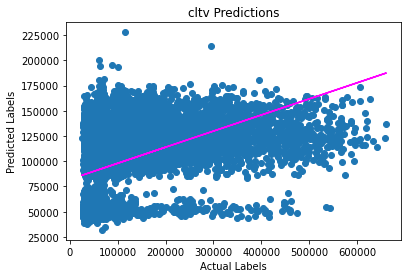

MSE: 7104808482.046793
RMSE: 84290.02599386711
R2: 0.15627940186624645


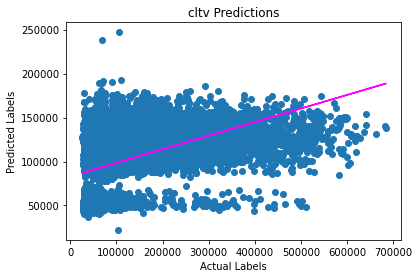

MSE: 6865712793.13895
RMSE: 82859.59686806925
R2: 0.16508477554668188


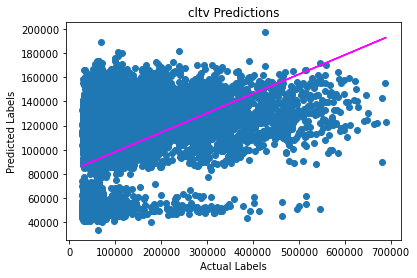

MSE: 7003514079.72032
RMSE: 83687.00066151445
R2: 0.15930351455933978


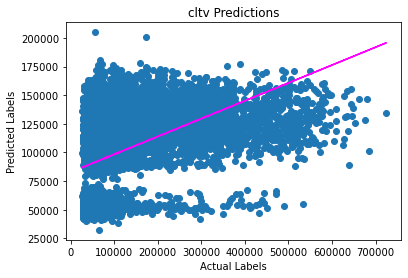

[I 2023-01-24 07:18:32,876] Trial 25 finished with value: 34486352602.94797 and parameters: {'n_estimators': 94, 'max_depth': 3, 'learning_rate': 0.08587054649282949}. Best is trial 25 with value: 34486352602.94797.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6724877198.671889
RMSE: 82005.34859795359
R2: 0.159586776044375


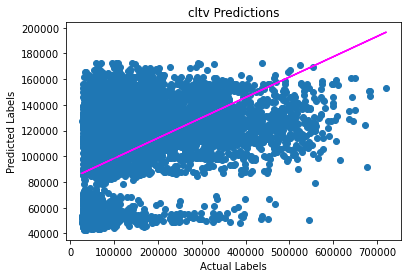

MSE: 6787296708.3621025
RMSE: 82385.05148606817
R2: 0.15951788057262384


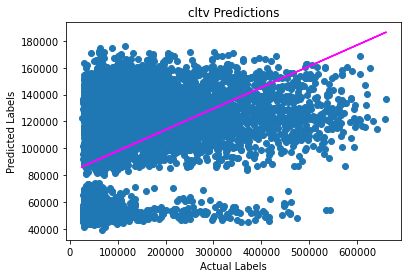

MSE: 7103851386.979849
RMSE: 84284.34841048396
R2: 0.15639306021810673


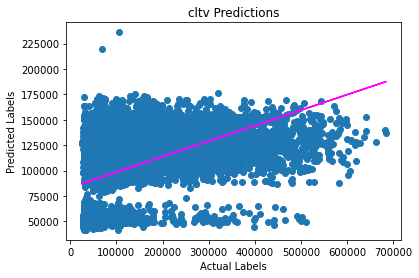

MSE: 6869781775.818671
RMSE: 82884.14670984236
R2: 0.1645899608508603


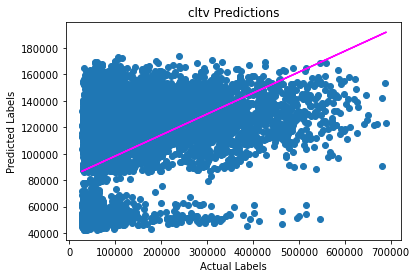

MSE: 7005571783.271682
RMSE: 83699.29380390065
R2: 0.1590565093953582


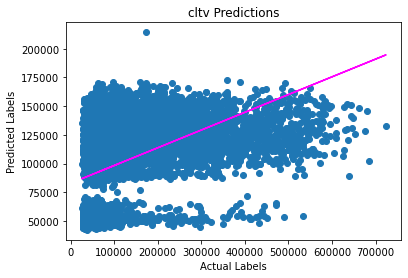

[I 2023-01-24 07:18:59,985] Trial 26 finished with value: 34491378853.104195 and parameters: {'n_estimators': 92, 'max_depth': 3, 'learning_rate': 0.06459776397066759}. Best is trial 25 with value: 34486352602.94797.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6724201960.620153
RMSE: 82001.23145794918
R2: 0.15967116107792012


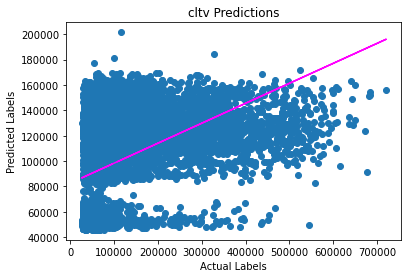

MSE: 6789043051.154775
RMSE: 82395.64946740073
R2: 0.15930162807112003


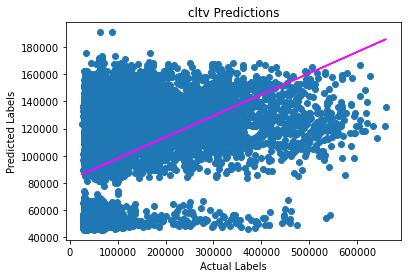

MSE: 7098022353.530611
RMSE: 84249.76174168453
R2: 0.15708527811543083


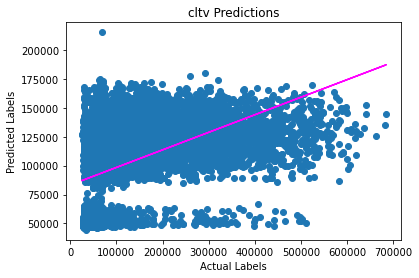

MSE: 6867361197.663563
RMSE: 82869.54324517278
R2: 0.164884318860665


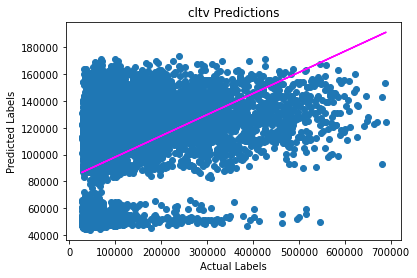

MSE: 7012013603.66318
RMSE: 83737.76688963696
R2: 0.1582832381915985


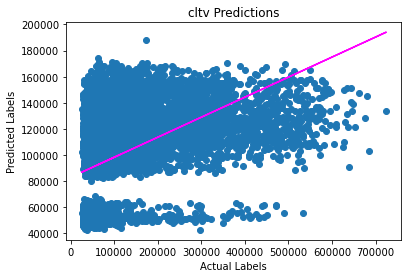

[I 2023-01-24 07:19:31,225] Trial 27 finished with value: 34490642166.632286 and parameters: {'n_estimators': 94, 'max_depth': 4, 'learning_rate': 0.04395534366249622}. Best is trial 25 with value: 34486352602.94797.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6730571096.086193
RMSE: 82040.0578747126
R2: 0.1588752051797393


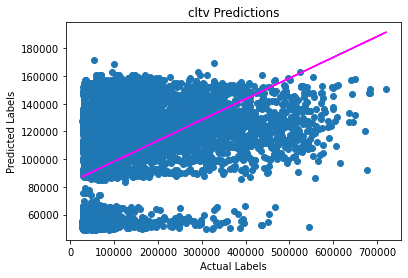

MSE: 6797557434.951951
RMSE: 82447.30095613774
R2: 0.1582472779156815


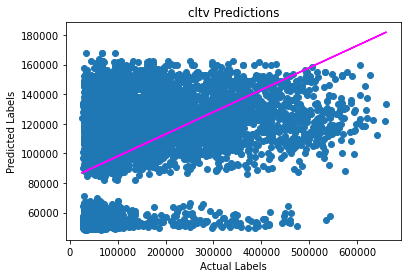

MSE: 7104836394.446072
RMSE: 84290.19156726405
R2: 0.15627608717222263


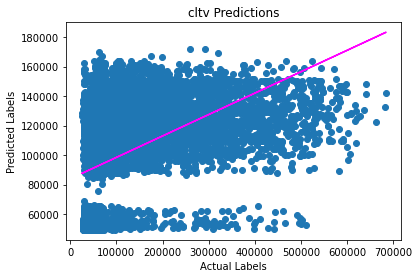

MSE: 6881443874.020417
RMSE: 82954.46868023697
R2: 0.16317177403893335


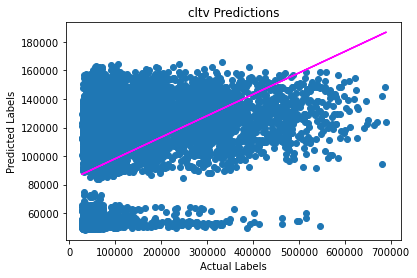

MSE: 7023534097.2592945
RMSE: 83806.52777235968
R2: 0.1569003269321152


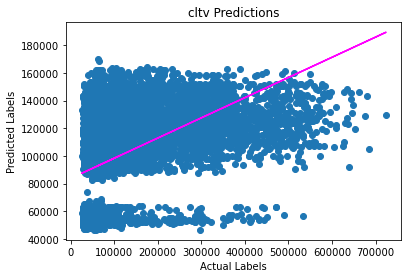

[I 2023-01-24 07:19:53,196] Trial 28 finished with value: 34537942896.76392 and parameters: {'n_estimators': 65, 'max_depth': 4, 'learning_rate': 0.04286529698930205}. Best is trial 25 with value: 34486352602.94797.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6734943310.93767
RMSE: 82066.70037803195
R2: 0.15832880603063937


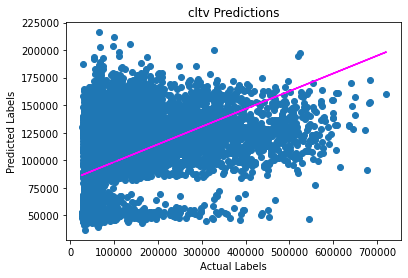

MSE: 6797407158.145679
RMSE: 82446.38960042871
R2: 0.1582658869398723


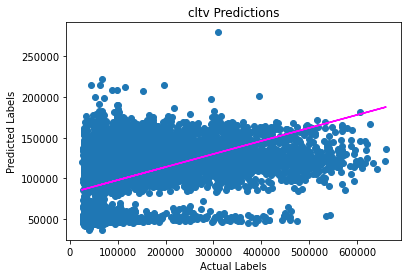

MSE: 7120139615.409928
RMSE: 84380.91973550613
R2: 0.15445877671584307


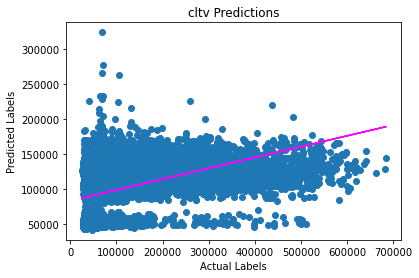

MSE: 6872531649.660302
RMSE: 82900.73371002395
R2: 0.16425555834890915


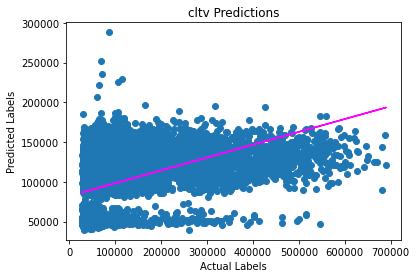

MSE: 7013412586.441553
RMSE: 83746.11982916913
R2: 0.15811530536650775


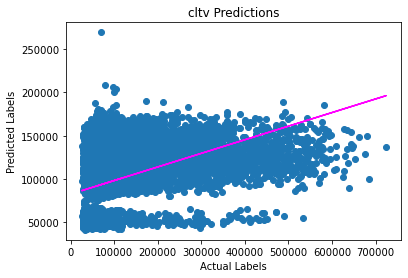

[I 2023-01-24 07:20:45,473] Trial 29 finished with value: 34538434320.59513 and parameters: {'n_estimators': 117, 'max_depth': 5, 'learning_rate': 0.05319563376410864}. Best is trial 25 with value: 34486352602.94797.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6786399513.977685
RMSE: 82379.60617760736
R2: 0.1518982836267634


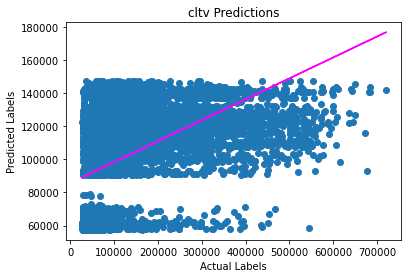

MSE: 6856677412.672766
RMSE: 82805.05668540277
R2: 0.15092635379664743


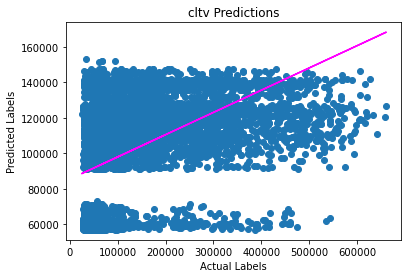

MSE: 7172115872.938403
RMSE: 84688.34555556274
R2: 0.14828641623610717


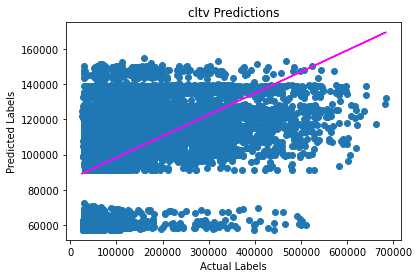

MSE: 6952813131.477171
RMSE: 83383.53033709458
R2: 0.15449280924621456


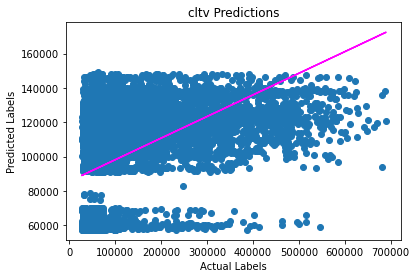

MSE: 7090013227.713923
RMSE: 84202.21628742277
R2: 0.14892022284548379


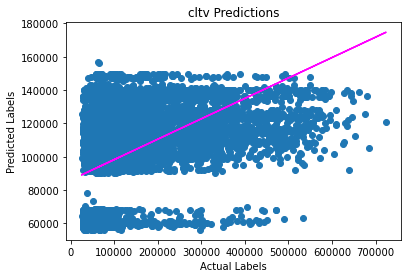

[I 2023-01-24 07:21:25,500] Trial 30 finished with value: 34858019158.779945 and parameters: {'n_estimators': 111, 'max_depth': 4, 'learning_rate': 0.014263671142106811}. Best is trial 25 with value: 34486352602.94797.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6724838524.274113
RMSE: 82005.11279349668
R2: 0.1595916092144627


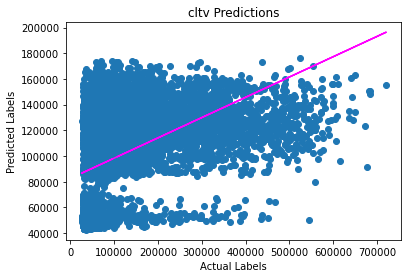

MSE: 6788805015.501518
RMSE: 82394.20498737467
R2: 0.15933110441773424


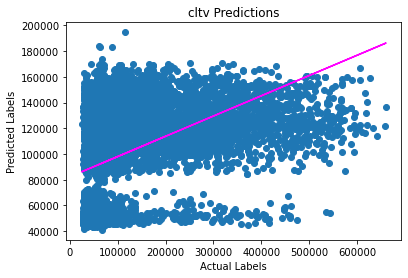

MSE: 7103032739.584454
RMSE: 84279.49180900685
R2: 0.15649027742978094


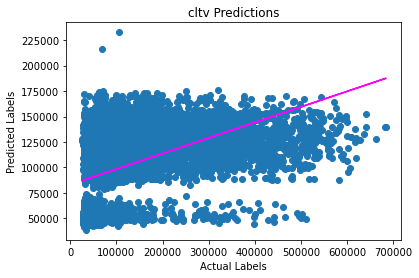

MSE: 6868462131.857214
RMSE: 82876.18555325296
R2: 0.16475043811920442


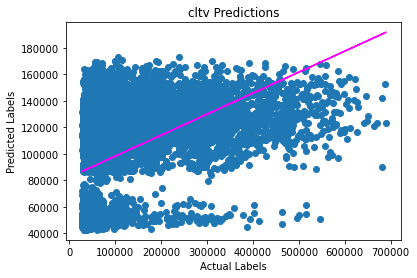

MSE: 7006636224.127798
RMSE: 83705.65228303162
R2: 0.1589287347273115


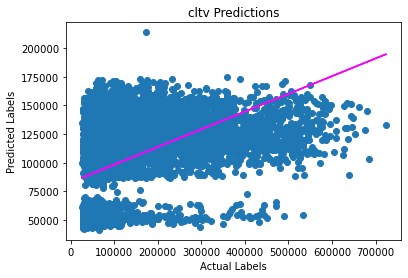

[I 2023-01-24 07:21:52,939] Trial 31 finished with value: 34491774635.3451 and parameters: {'n_estimators': 95, 'max_depth': 3, 'learning_rate': 0.062314949620129886}. Best is trial 25 with value: 34486352602.94797.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6735534678.052254
RMSE: 82070.3032652631
R2: 0.15825490241446516


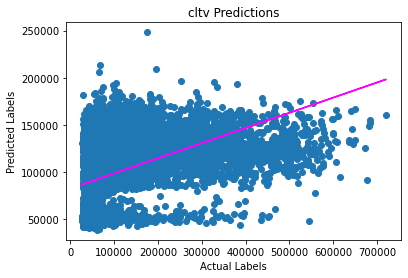

MSE: 6797058690.874151
RMSE: 82444.2762772174
R2: 0.1583090382154847


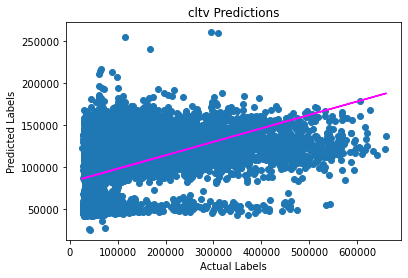

MSE: 7109543542.921734
RMSE: 84318.10922288126
R2: 0.15571709699853598


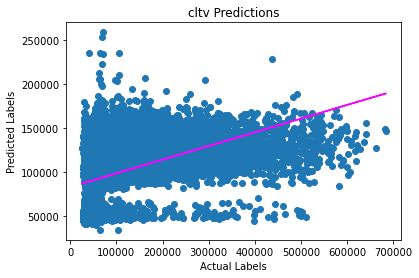

MSE: 6867901483.434722
RMSE: 82872.80303835946
R2: 0.16481861660519825


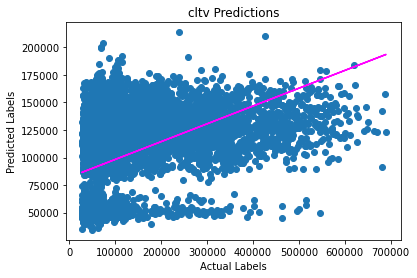

MSE: 7010189376.913863
RMSE: 83726.87368410373
R2: 0.15850221697843903


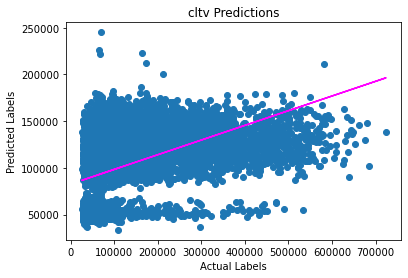

[I 2023-01-24 07:22:26,867] Trial 32 finished with value: 34520227772.196724 and parameters: {'n_estimators': 94, 'max_depth': 4, 'learning_rate': 0.08978169506807542}. Best is trial 25 with value: 34486352602.94797.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6737048806.867891
RMSE: 82079.52733092394
R2: 0.15806568053846048


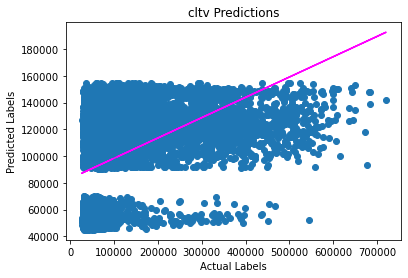

MSE: 6807844079.609049
RMSE: 82509.66052292936
R2: 0.15697346578182536


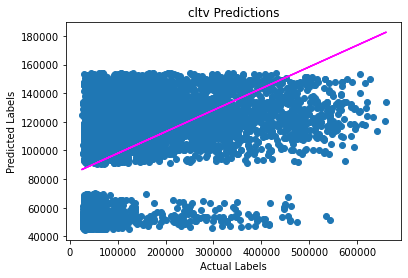

MSE: 7112533465.585167
RMSE: 84335.83737406753
R2: 0.15536203333364773


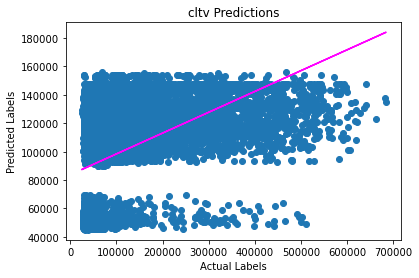

MSE: 6898192179.064337
RMSE: 83055.35611304268
R2: 0.16113507147267825


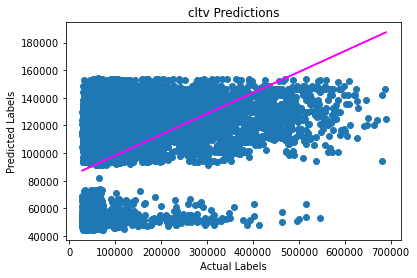

MSE: 7029081988.8487835
RMSE: 83839.62063874563
R2: 0.15623436225955256


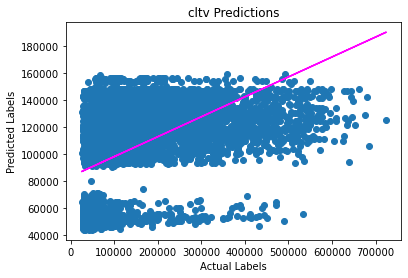

[I 2023-01-24 07:22:42,152] Trial 33 finished with value: 34584700519.97523 and parameters: {'n_estimators': 78, 'max_depth': 2, 'learning_rate': 0.05749389574639757}. Best is trial 25 with value: 34486352602.94797.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6740573590.410278
RMSE: 82100.99628147199
R2: 0.1576251855505092


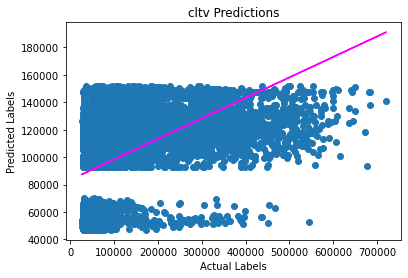

MSE: 6814951589.636269
RMSE: 82552.72006200807
R2: 0.15609333112023482


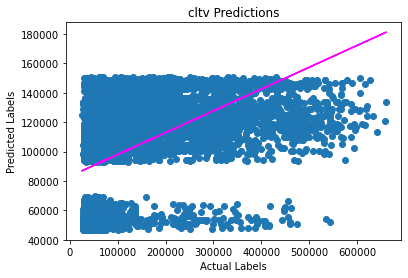

MSE: 7117143797.236665
RMSE: 84363.16611671627
R2: 0.1548145404929291


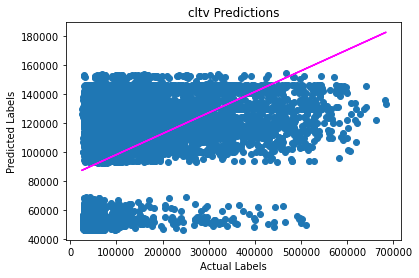

MSE: 6904778294.962098
RMSE: 83094.99560720909
R2: 0.16033415704489296


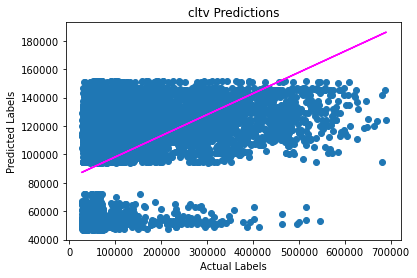

MSE: 7036496369.1776705
RMSE: 83883.82662455064
R2: 0.15534434570311206


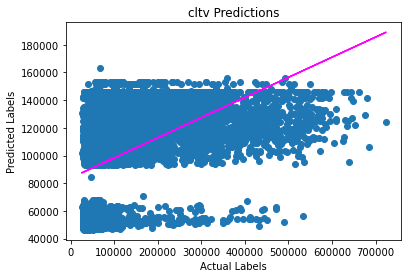

[I 2023-01-24 07:23:02,538] Trial 34 finished with value: 34613943641.42298 and parameters: {'n_estimators': 93, 'max_depth': 2, 'learning_rate': 0.04278300921118484}. Best is trial 25 with value: 34486352602.94797.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6725918240.049942
RMSE: 82011.69575158133
R2: 0.15945667627973203


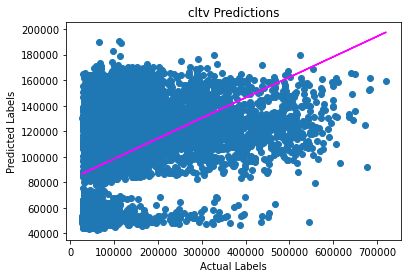

MSE: 6789261068.297193
RMSE: 82396.97244618392
R2: 0.1592746306496423


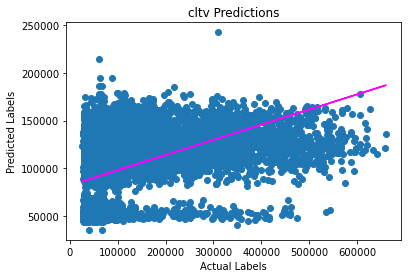

MSE: 7103743431.70768
RMSE: 84283.7079850411
R2: 0.15640588028032754


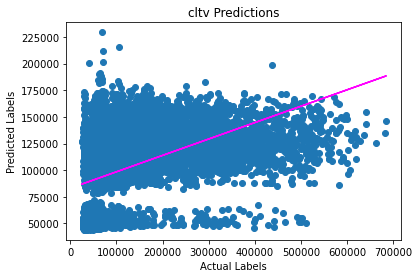

MSE: 6863594360.805303
RMSE: 82846.81261705427
R2: 0.16534239066409606


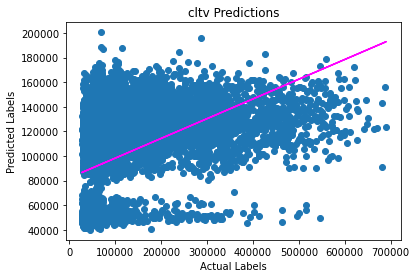

MSE: 7006357736.210447
RMSE: 83703.9887712076
R2: 0.15896216420438392


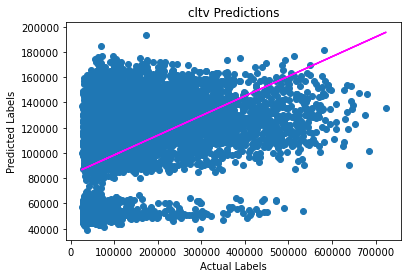

[I 2023-01-24 07:23:29,606] Trial 35 finished with value: 34488874837.070564 and parameters: {'n_estimators': 80, 'max_depth': 4, 'learning_rate': 0.0720366247746885}. Best is trial 25 with value: 34486352602.94797.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6746055793.50484
RMSE: 82134.37644193106
R2: 0.15694007029249524


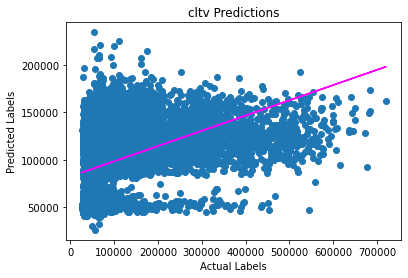

MSE: 6805157877.910848
RMSE: 82493.38081271034
R2: 0.1573061025580742


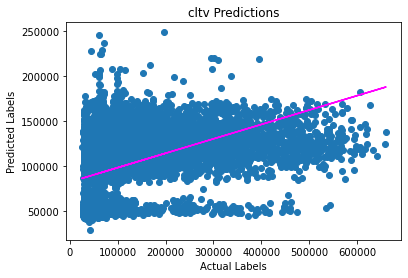

MSE: 7125630359.865839
RMSE: 84413.44892767881
R2: 0.1538067318073495


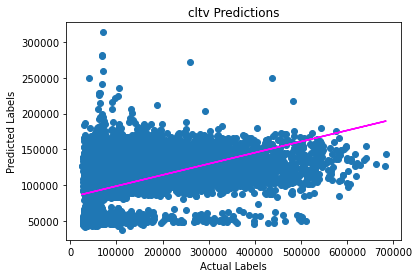

MSE: 6874810752.041418
RMSE: 82914.47854290238
R2: 0.1639784047112005


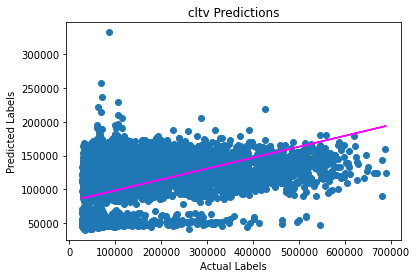

MSE: 7012961201.121783
RMSE: 83743.42482321692
R2: 0.1581694893158211


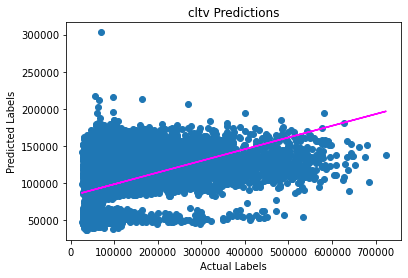

[I 2023-01-24 07:24:01,670] Trial 36 finished with value: 34564615984.444725 and parameters: {'n_estimators': 78, 'max_depth': 5, 'learning_rate': 0.09364542168640444}. Best is trial 25 with value: 34486352602.94797.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6725201343.744118
RMSE: 82007.32493956937
R2: 0.15954626737824884


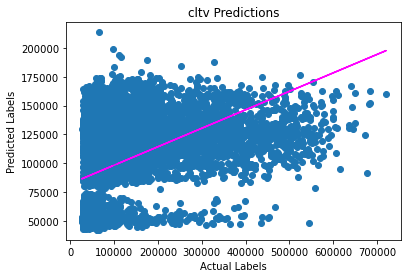

MSE: 6786444221.901264
RMSE: 82379.87753026381
R2: 0.15962344537377748


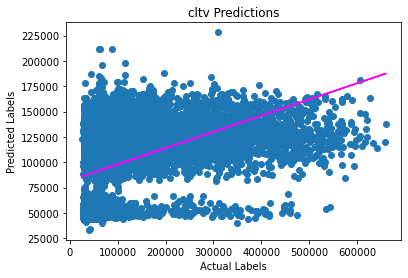

MSE: 7104996415.684745
RMSE: 84291.1407900305
R2: 0.15625708409627082


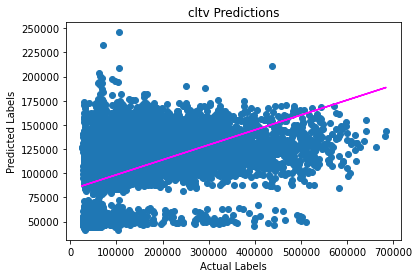

MSE: 6863178820.052998
RMSE: 82844.30469291777
R2: 0.16539292311585074


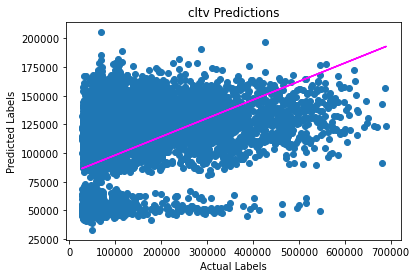

MSE: 7005724605.776471
RMSE: 83700.20672481324
R2: 0.15903816469850884


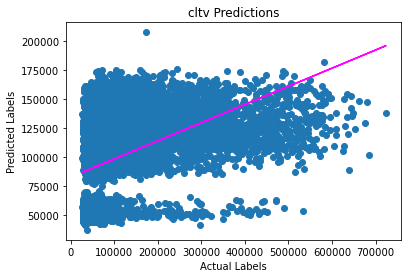

[I 2023-01-24 07:24:30,628] Trial 37 finished with value: 34485545407.1596 and parameters: {'n_estimators': 83, 'max_depth': 4, 'learning_rate': 0.07467365267711755}. Best is trial 37 with value: 34485545407.1596.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6734201674.24452
RMSE: 82062.18175410961
R2: 0.1584214889549337


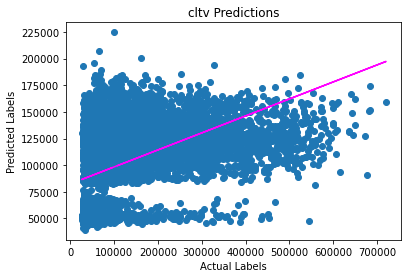

MSE: 6796080909.9813595
RMSE: 82438.34611381622
R2: 0.15843011843231036


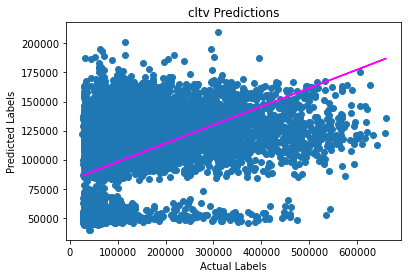

MSE: 7113062656.462951
RMSE: 84338.97471787852
R2: 0.15529919008529558


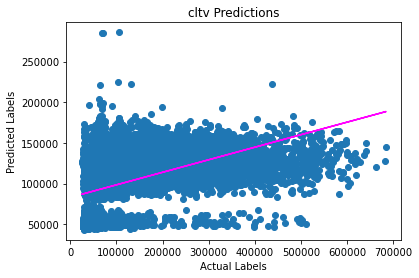

MSE: 6869531722.179603
RMSE: 82882.63824335953
R2: 0.16462036899586696


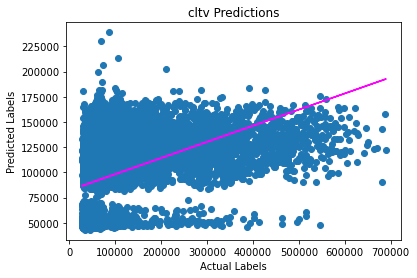

MSE: 7013520722.432785
RMSE: 83746.76544459962
R2: 0.1581023248046437


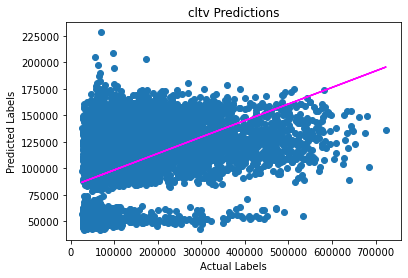

[I 2023-01-24 07:24:58,145] Trial 38 finished with value: 34526397685.30122 and parameters: {'n_estimators': 62, 'max_depth': 5, 'learning_rate': 0.07804886047349327}. Best is trial 37 with value: 34485545407.1596.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6728598968.003237
RMSE: 82028.03769445687
R2: 0.15912166358653046


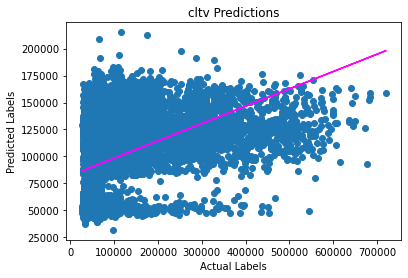

MSE: 6791201168.615085
RMSE: 82408.74449119513
R2: 0.15903438483497578


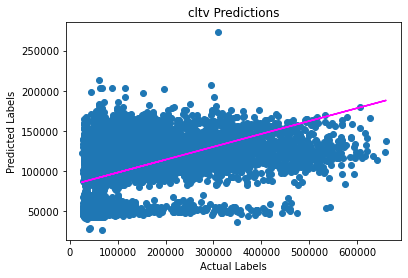

MSE: 7104365234.500926
RMSE: 84287.39665276729
R2: 0.15633203904646953


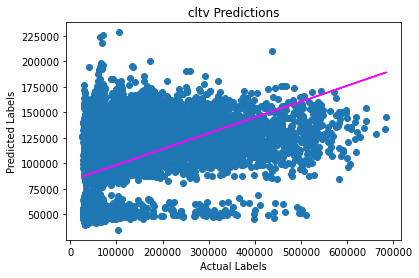

MSE: 6866974424.788058
RMSE: 82867.2095873154
R2: 0.16493135295193762


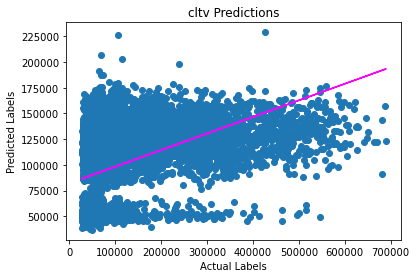

MSE: 7008868094.227192
RMSE: 83718.98287859923
R2: 0.15866082274381832


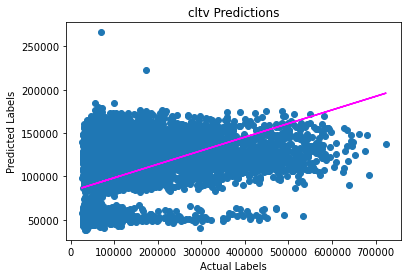

[I 2023-01-24 07:25:23,451] Trial 39 finished with value: 34500007890.1345 and parameters: {'n_estimators': 73, 'max_depth': 4, 'learning_rate': 0.09912475345511669}. Best is trial 37 with value: 34485545407.1596.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6741524346.477467
RMSE: 82106.78623888202
R2: 0.15750636881259472


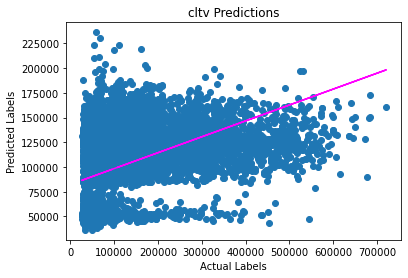

MSE: 6803958017.286795
RMSE: 82486.10802605972
R2: 0.15745468327343903


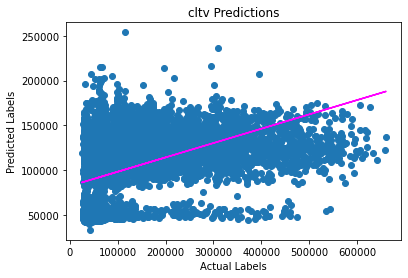

MSE: 7126298232.67712
RMSE: 84417.40479709809
R2: 0.15372741959939407


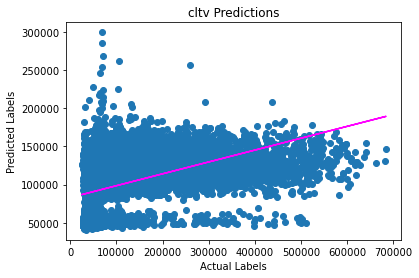

MSE: 6881597803.3476305
RMSE: 82955.39646911243
R2: 0.16315305523395962


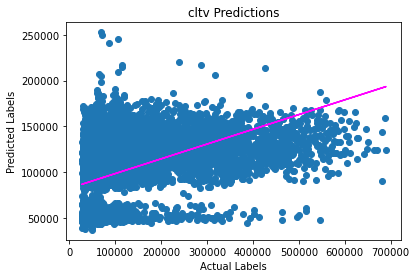

MSE: 7018151086.516789
RMSE: 83774.40591563028
R2: 0.15754649943363386


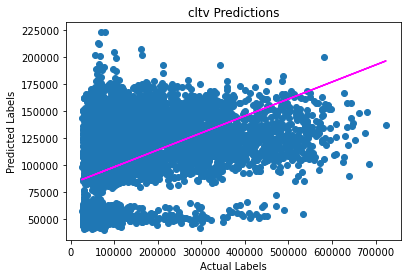

[I 2023-01-24 07:25:57,399] Trial 40 finished with value: 34571529486.3058 and parameters: {'n_estimators': 83, 'max_depth': 5, 'learning_rate': 0.0845854993056775}. Best is trial 37 with value: 34485545407.1596.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6726219497.448369
RMSE: 82013.53240440488
R2: 0.1594190279043085


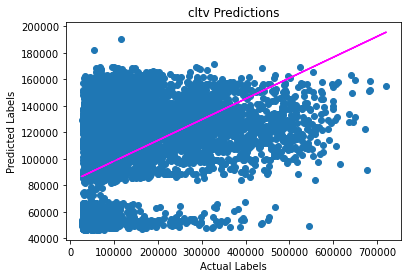

MSE: 6788875936.816165
RMSE: 82394.63536430127
R2: 0.15932232211464525


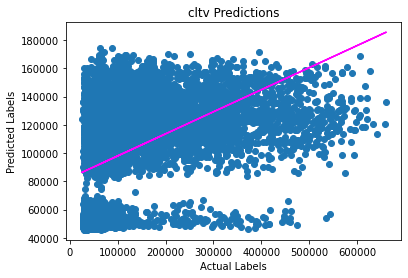

MSE: 7100123122.344835
RMSE: 84262.22832529909
R2: 0.15683580454764123


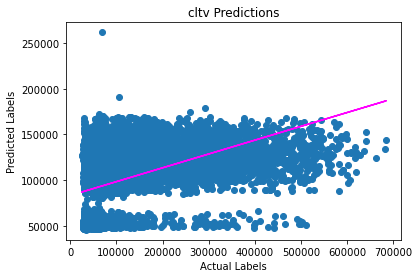

MSE: 6869162148.549916
RMSE: 82880.40871369974
R2: 0.16466531154724928


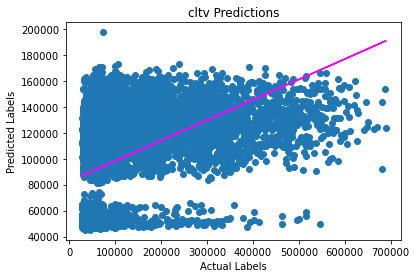

MSE: 7015387644.382102
RMSE: 83757.91093611458
R2: 0.15787822091857773


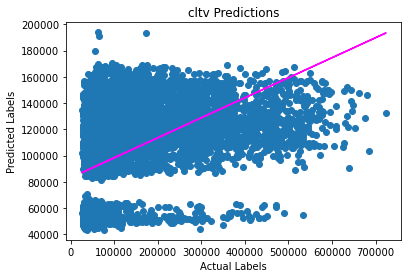

[I 2023-01-24 07:26:14,809] Trial 41 finished with value: 34499768349.54138 and parameters: {'n_estimators': 51, 'max_depth': 4, 'learning_rate': 0.0750904975830046}. Best is trial 37 with value: 34485545407.1596.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6725486065.693855
RMSE: 82009.06087557554
R2: 0.15951068545093017


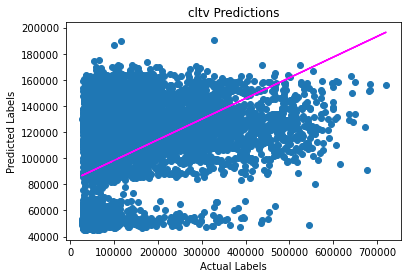

MSE: 6788954003.849069
RMSE: 82395.10910150595
R2: 0.15931265494550684


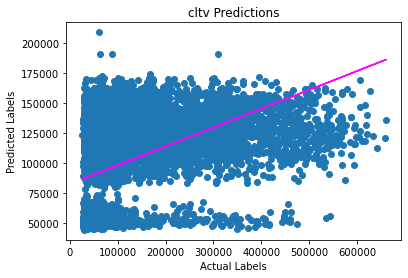

MSE: 7099375964.979771
RMSE: 84257.79468381409
R2: 0.15692453207077506


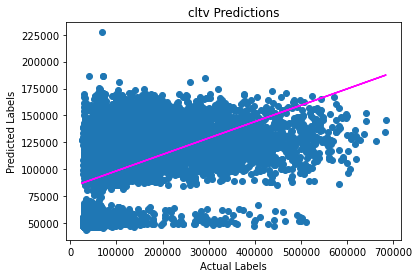

MSE: 6867373153.262217
RMSE: 82869.61538019961
R2: 0.16488286498229365


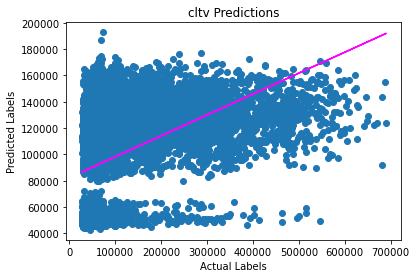

MSE: 7011166144.749817
RMSE: 83732.7065414096
R2: 0.15838496651282563


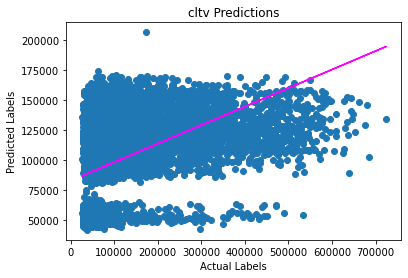

[I 2023-01-24 07:26:42,534] Trial 42 finished with value: 34492355332.53473 and parameters: {'n_estimators': 81, 'max_depth': 4, 'learning_rate': 0.05507132231963689}. Best is trial 37 with value: 34485545407.1596.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6723893940.842218
RMSE: 81999.35329526824
R2: 0.15970965455326092


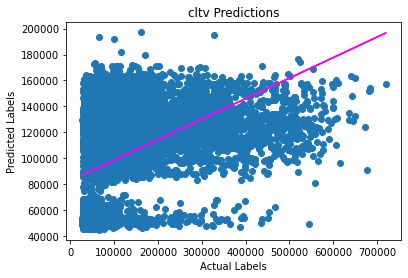

MSE: 6790196323.600789
RMSE: 82402.64755213141
R2: 0.15915881644649954


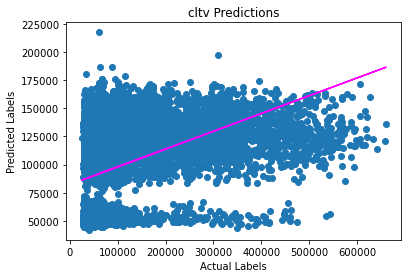

MSE: 7100931596.471674
RMSE: 84267.02555846903
R2: 0.15673979544681937


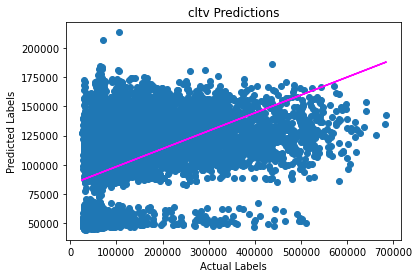

MSE: 6864480641.6189375
RMSE: 82852.16135755867
R2: 0.16523461316644372


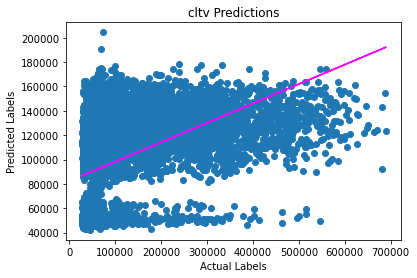

MSE: 7013916394.976394
RMSE: 83749.12772665989
R2: 0.15805482857446396


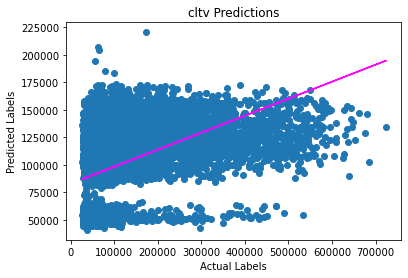

[I 2023-01-24 07:27:09,824] Trial 43 finished with value: 34493418897.51001 and parameters: {'n_estimators': 73, 'max_depth': 4, 'learning_rate': 0.06480565993725297}. Best is trial 37 with value: 34485545407.1596.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6728501084.308959
RMSE: 82027.44104450021
R2: 0.15913389618924578


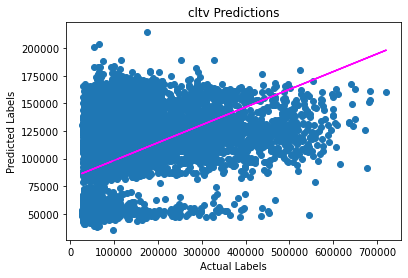

MSE: 6789845578.202067
RMSE: 82400.51928357047
R2: 0.15920224982635067


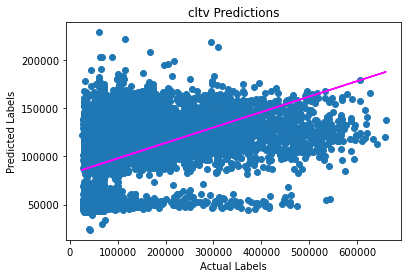

MSE: 7107936462.8339205
RMSE: 84308.57882110172
R2: 0.15590794332132785


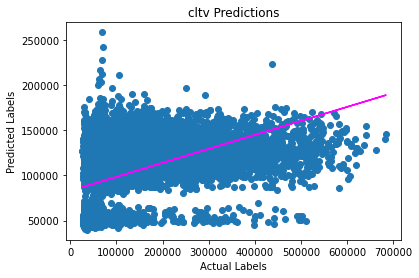

MSE: 6865388043.161612
RMSE: 82857.6372047961
R2: 0.1651242672510963


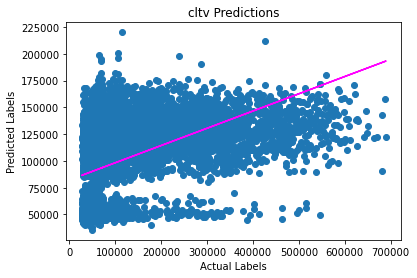

MSE: 7006627798.346719
RMSE: 83705.60195319497
R2: 0.15892974615164213


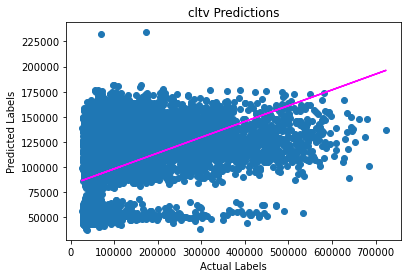

[I 2023-01-24 07:27:44,954] Trial 44 finished with value: 34498298966.85328 and parameters: {'n_estimators': 105, 'max_depth': 4, 'learning_rate': 0.07208653232346202}. Best is trial 37 with value: 34485545407.1596.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6726264035.797527
RMSE: 82013.80393444464
R2: 0.15941346191157735


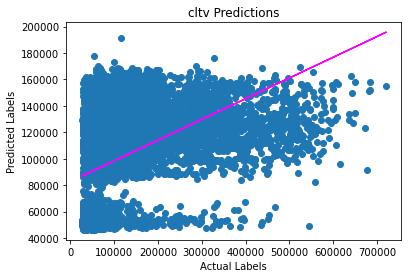

MSE: 6789785942.03581
RMSE: 82400.15741511548
R2: 0.1592096346709455


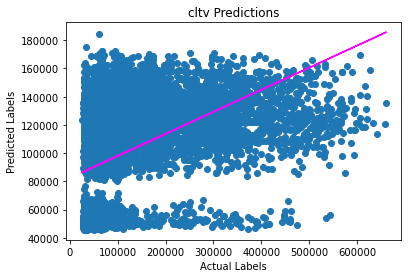

MSE: 7097603525.242419
RMSE: 84247.27607016395
R2: 0.15713501542428598


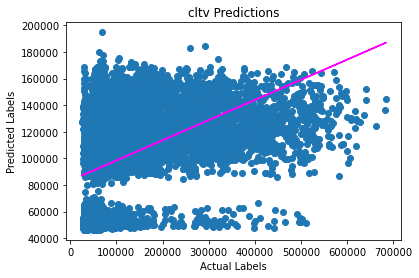

MSE: 6869311529.618826
RMSE: 82881.30989323724
R2: 0.16464714583999707


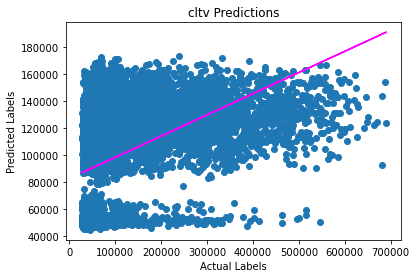

MSE: 7011207297.610539
RMSE: 83732.95228051224
R2: 0.15838002655483008


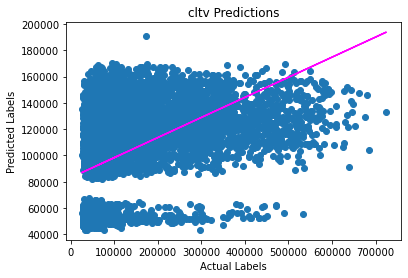

[I 2023-01-24 07:28:13,831] Trial 45 finished with value: 34494172330.30512 and parameters: {'n_estimators': 87, 'max_depth': 4, 'learning_rate': 0.04594277420094189}. Best is trial 37 with value: 34485545407.1596.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6772733287.079564
RMSE: 82296.61771348544
R2: 0.15360616281436057


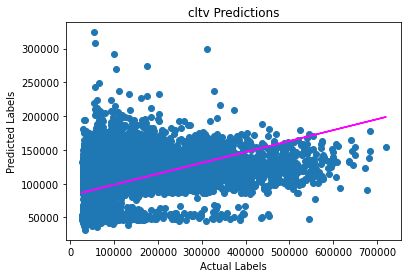

MSE: 6837956500.684444
RMSE: 82691.93733783509
R2: 0.15324459513213695


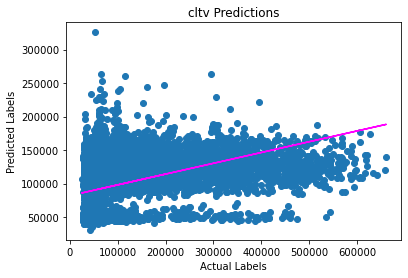

MSE: 7139891099.653626
RMSE: 84497.87630262447
R2: 0.15211321959882407


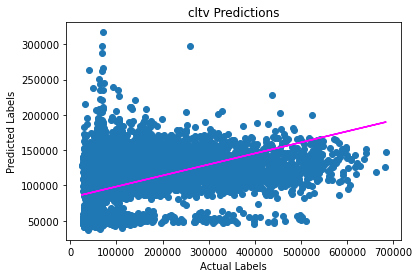

MSE: 6892595195.101534
RMSE: 83021.65497688862
R2: 0.16181570103909926


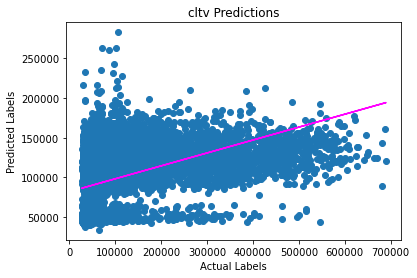

MSE: 7041021011.105494
RMSE: 83910.79198235167
R2: 0.154801211139049


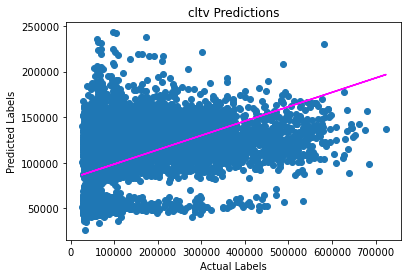

[I 2023-01-24 07:29:24,540] Trial 46 finished with value: 34684197093.62466 and parameters: {'n_estimators': 143, 'max_depth': 6, 'learning_rate': 0.05837009954577194}. Best is trial 37 with value: 34485545407.1596.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6726534577.72701
RMSE: 82015.4532861156
R2: 0.15937965207260862


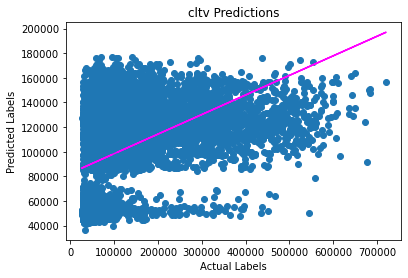

MSE: 6787467427.730889
RMSE: 82386.08758601715
R2: 0.1594967401122801


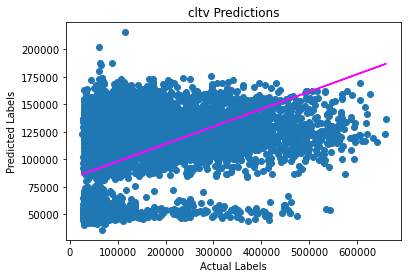

MSE: 7102364495.7575
RMSE: 84275.52726478488
R2: 0.15656963369713162


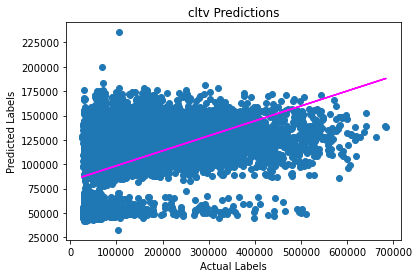

MSE: 6867252008.805198
RMSE: 82868.88444286672
R2: 0.16489759693432404


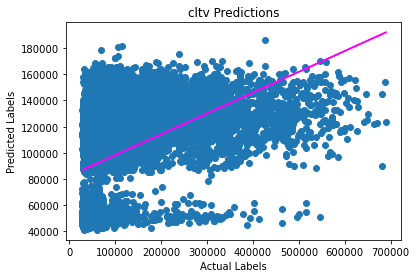

MSE: 7004881774.923722
RMSE: 83695.17175395318
R2: 0.1591393374708715


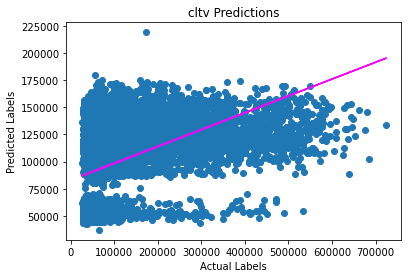

[I 2023-01-24 07:29:44,535] Trial 47 finished with value: 34488500284.94432 and parameters: {'n_estimators': 73, 'max_depth': 3, 'learning_rate': 0.08999256967183325}. Best is trial 37 with value: 34485545407.1596.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6725926698.680595
RMSE: 82011.74732122585
R2: 0.15945561919796714


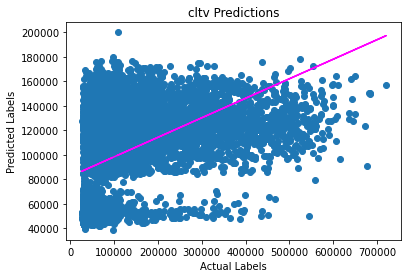

MSE: 6785917625.43891
RMSE: 82376.68132086234
R2: 0.1596886546801891


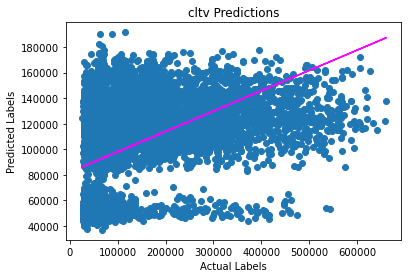

MSE: 7102101332.55879
RMSE: 84273.96592399571
R2: 0.15660088523782878


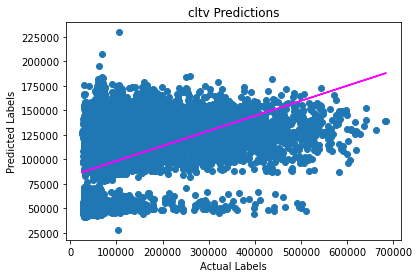

MSE: 6865676219.784928
RMSE: 82859.37617303747
R2: 0.16508922310384055


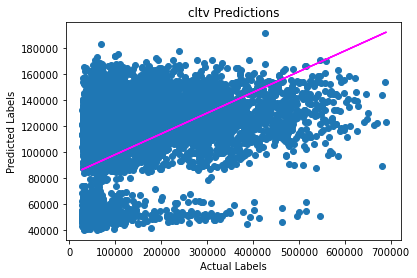

MSE: 7004921312.058813
RMSE: 83695.40795084766
R2: 0.15913459146334774


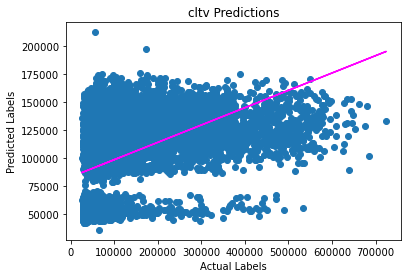

[I 2023-01-24 07:30:03,157] Trial 48 finished with value: 34484543188.52203 and parameters: {'n_estimators': 69, 'max_depth': 3, 'learning_rate': 0.10261491667138906}. Best is trial 48 with value: 34484543188.52203.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6727109407.256389
RMSE: 82018.95760893569
R2: 0.15930781517154136


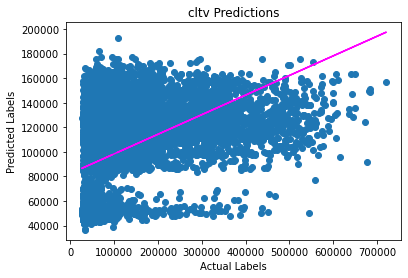

MSE: 6787579431.735635
RMSE: 82386.76733393315
R2: 0.15948287047207743


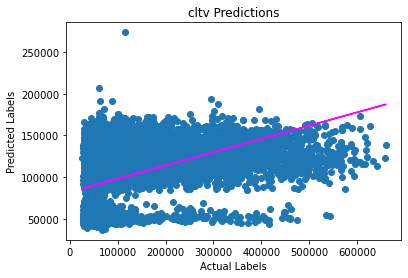

MSE: 7103242596.4216385
RMSE: 84280.73680516586
R2: 0.1564653562040168


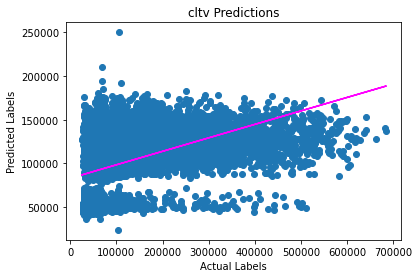

MSE: 6865622970.6513
RMSE: 82859.0548500965
R2: 0.16509569854400152


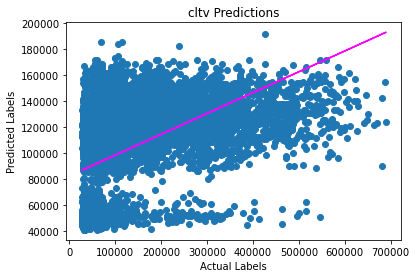

MSE: 7005846760.756932
RMSE: 83700.93643894872
R2: 0.15902350130787613


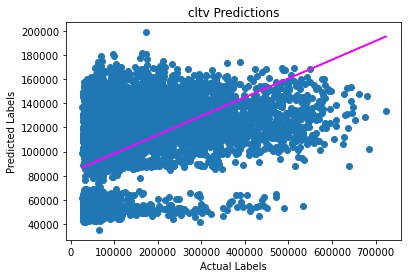

[I 2023-01-24 07:30:22,194] Trial 49 finished with value: 34489401166.8219 and parameters: {'n_estimators': 69, 'max_depth': 3, 'learning_rate': 0.1064217949199089}. Best is trial 48 with value: 34484543188.52203.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6724652247.223629
RMSE: 82003.977020774
R2: 0.15961488840483606


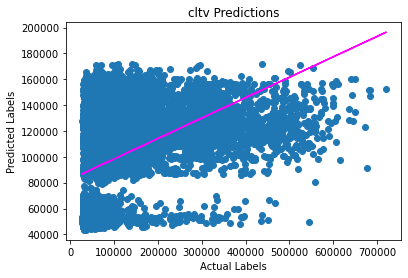

MSE: 6787942947.429524
RMSE: 82388.97345779667
R2: 0.15943785572556302


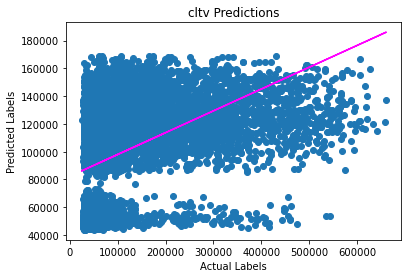

MSE: 7101057978.844962
RMSE: 84267.77544734975
R2: 0.15672478710256166


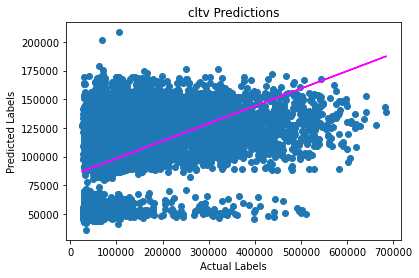

MSE: 6871649899.097466
RMSE: 82895.41542870429
R2: 0.1643627849386694


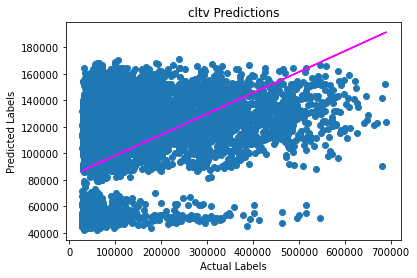

MSE: 7008332029.654036
RMSE: 83715.78124615476
R2: 0.15872517152608556


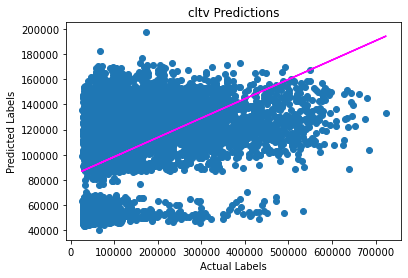

[I 2023-01-24 07:30:38,742] Trial 50 finished with value: 34493635102.24962 and parameters: {'n_estimators': 57, 'max_depth': 3, 'learning_rate': 0.09364841793781371}. Best is trial 48 with value: 34484543188.52203.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6727066711.022392
RMSE: 82018.69732580731
R2: 0.15931315095368326


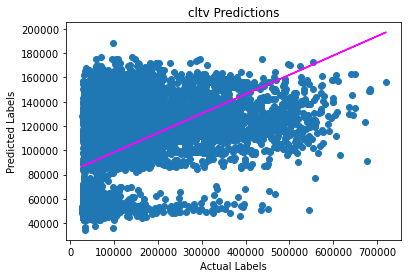

MSE: 6785534958.245416
RMSE: 82374.35862114749
R2: 0.1597360409884122


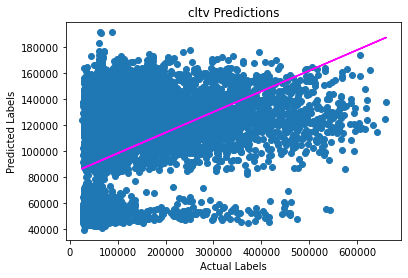

MSE: 7103720793.660317
RMSE: 84283.57368823605
R2: 0.15640856862680563


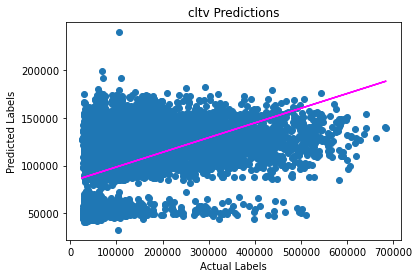

MSE: 6866545863.933431
RMSE: 82864.62371804648
R2: 0.16498346873261682


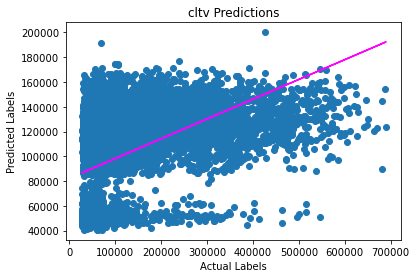

MSE: 7005267420.762297
RMSE: 83697.47559372563
R2: 0.15909304483871234


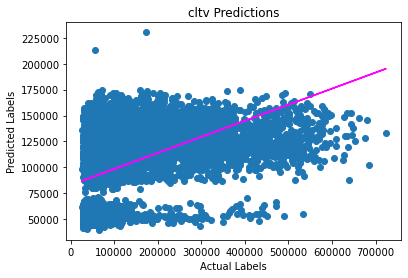

[I 2023-01-24 07:30:59,350] Trial 51 finished with value: 34488135747.62385 and parameters: {'n_estimators': 68, 'max_depth': 3, 'learning_rate': 0.10383095318840074}. Best is trial 48 with value: 34484543188.52203.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6726576863.21831
RMSE: 82015.71107549036
R2: 0.1593743676213062


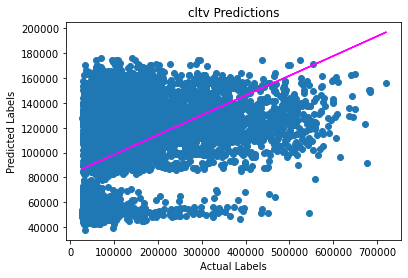

MSE: 6785836160.585925
RMSE: 82376.18685388348
R2: 0.15969874260697914


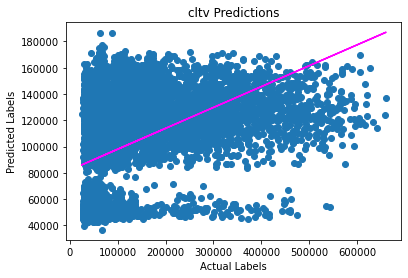

MSE: 7103719580.192771
RMSE: 84283.56648951663
R2: 0.1564087127302768


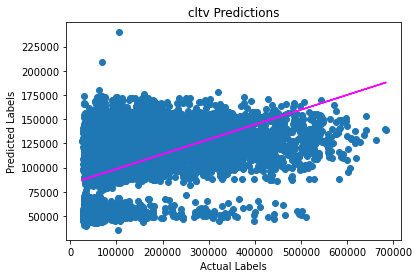

MSE: 6867811583.498863
RMSE: 82872.26063948577
R2: 0.16482954902072267


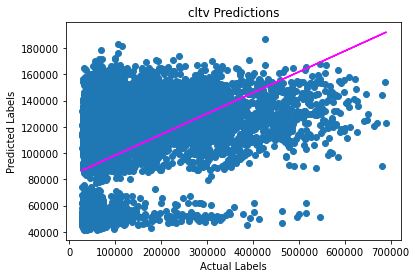

MSE: 7005622923.172083
RMSE: 83699.5993011441
R2: 0.15905037060074112


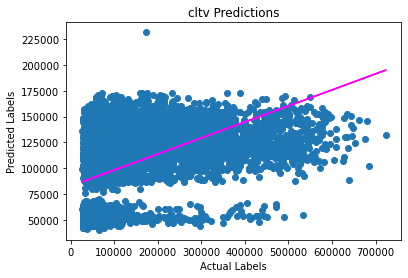

[I 2023-01-24 07:31:16,421] Trial 52 finished with value: 34489567110.66795 and parameters: {'n_estimators': 61, 'max_depth': 3, 'learning_rate': 0.10376809703546408}. Best is trial 48 with value: 34484543188.52203.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6726532551.963699
RMSE: 82015.44093622676
R2: 0.15937990523385215


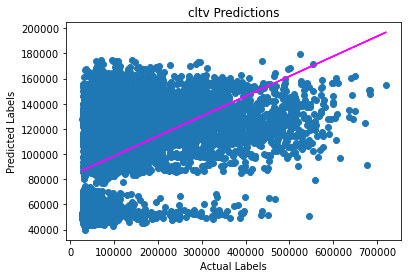

MSE: 6785828376.022321
RMSE: 82376.13960378527
R2: 0.15969970658229915


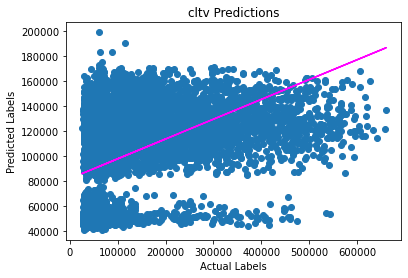

MSE: 7102224711.067599
RMSE: 84274.69792925751
R2: 0.1565862336128746


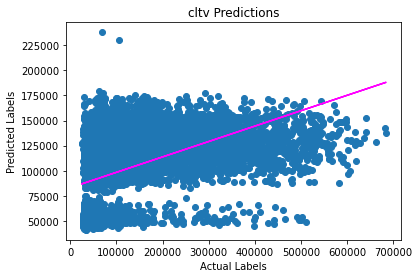

MSE: 6867848197.674347
RMSE: 82872.48154649616
R2: 0.16482509649940935


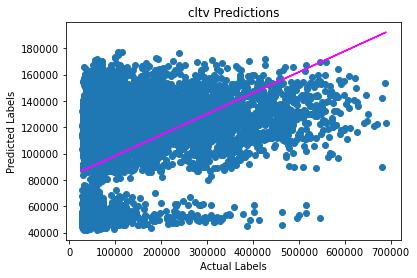

MSE: 7003906594.464562
RMSE: 83689.34576434782
R2: 0.15925639738898612


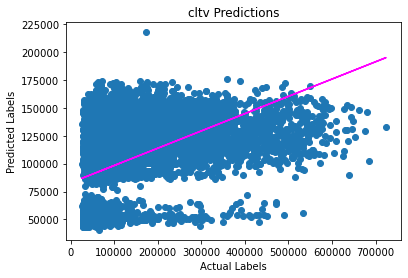

[I 2023-01-24 07:31:36,521] Trial 53 finished with value: 34486340431.19253 and parameters: {'n_estimators': 74, 'max_depth': 3, 'learning_rate': 0.08495630640113813}. Best is trial 48 with value: 34484543188.52203.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6726930731.773006
RMSE: 82017.8683688683
R2: 0.15933014438806015


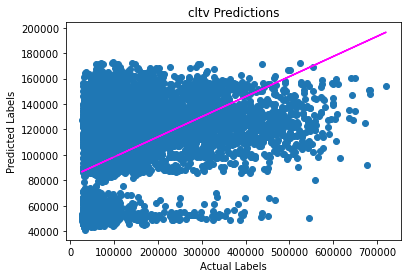

MSE: 6785913973.537188
RMSE: 82376.65915498872
R2: 0.15968910690118832


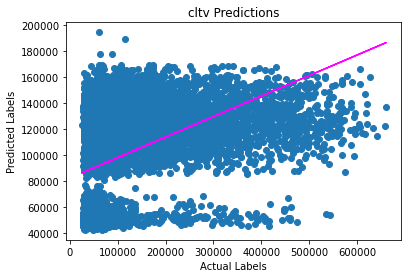

MSE: 7101139883.140164
RMSE: 84268.26142231822
R2: 0.1567150606840224


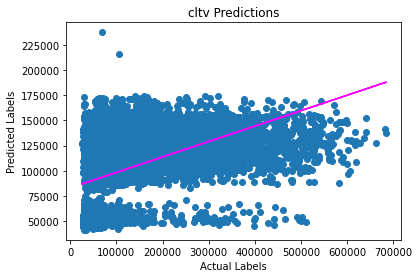

MSE: 6868962660.190499
RMSE: 82879.20523382508
R2: 0.16468957062615286


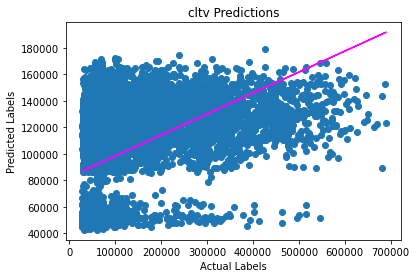

MSE: 7005019710.43614
RMSE: 83695.99578496059
R2: 0.15912277979722556


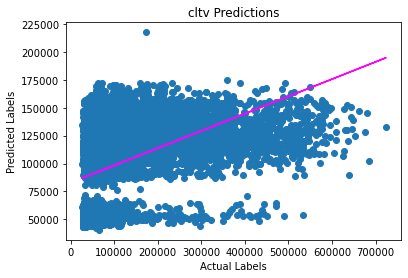

[I 2023-01-24 07:31:55,167] Trial 54 finished with value: 34487966959.076996 and parameters: {'n_estimators': 69, 'max_depth': 3, 'learning_rate': 0.08499031921078576}. Best is trial 48 with value: 34484543188.52203.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6732333089.78484
RMSE: 82050.79579007653
R2: 0.15865500743320482


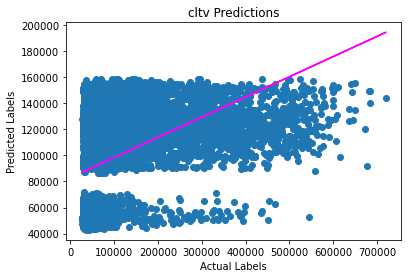

MSE: 6800668791.331653
RMSE: 82466.16755574163
R2: 0.15786199353565977


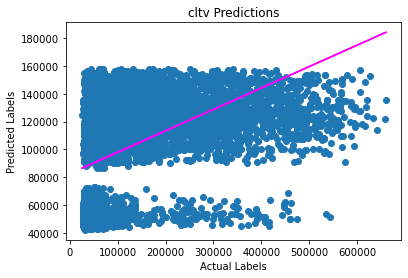

MSE: 7105044530.988493
RMSE: 84291.42620093987
R2: 0.15625137023741598


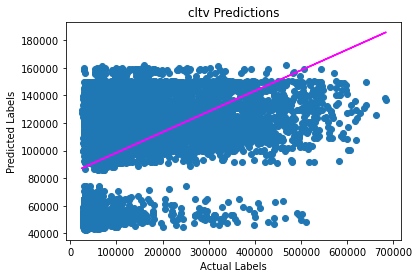

MSE: 6887970155.831108
RMSE: 82993.79588759095
R2: 0.16237813582437488


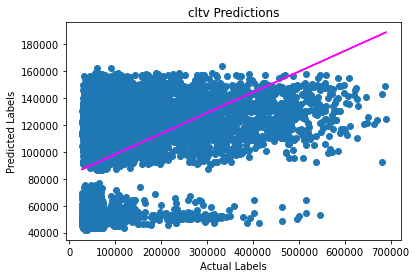

MSE: 7019325507.165105
RMSE: 83781.41504632817
R2: 0.157405522875262


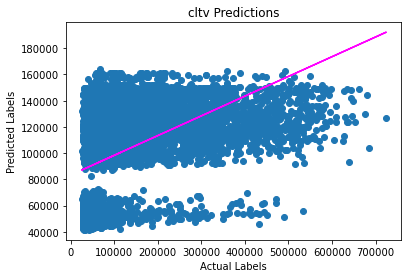

[I 2023-01-24 07:32:08,521] Trial 55 finished with value: 34545342075.101204 and parameters: {'n_estimators': 68, 'max_depth': 2, 'learning_rate': 0.08166412903769793}. Best is trial 48 with value: 34484543188.52203.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6726058287.858379
RMSE: 82012.5495754057
R2: 0.15943917439431166


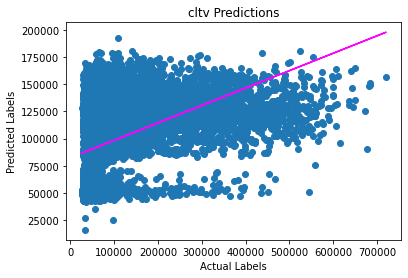

MSE: 6785404693.883706
RMSE: 82373.56793221783
R2: 0.15975217183866364


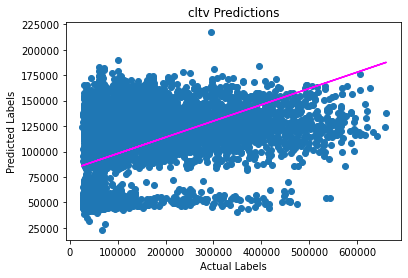

MSE: 7103973170.937619
RMSE: 84285.07086630241
R2: 0.15637859795160758


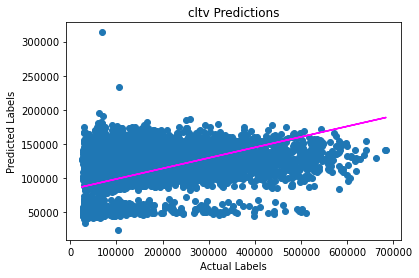

MSE: 6867115813.87451
RMSE: 82868.06268928041
R2: 0.16491415912160912


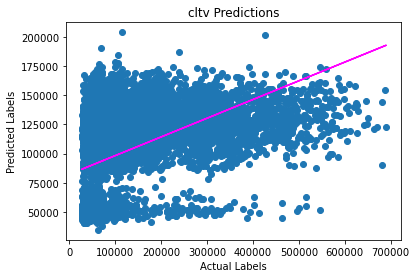

MSE: 7004522169.277065
RMSE: 83693.02342057589
R2: 0.1591825042582654


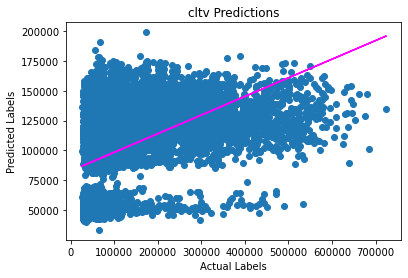

[I 2023-01-24 07:32:28,706] Trial 56 finished with value: 34487074135.83128 and parameters: {'n_estimators': 75, 'max_depth': 3, 'learning_rate': 0.11009933737258851}. Best is trial 48 with value: 34484543188.52203.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6725285955.495632
RMSE: 82007.84081717816
R2: 0.15953569338072082


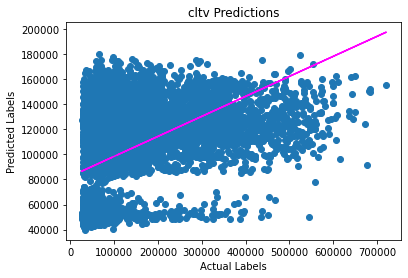

MSE: 6786723921.13498
RMSE: 82381.57513142718
R2: 0.1595888097574405


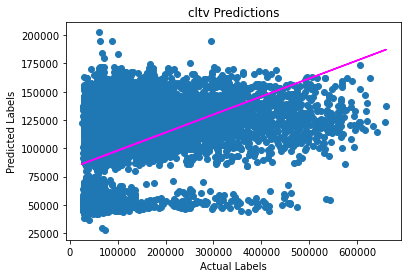

MSE: 7103523334.839613
RMSE: 84282.40228446039
R2: 0.1564320175452013


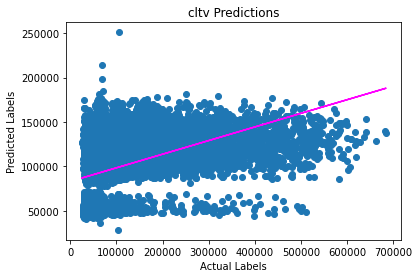

MSE: 6866607279.535504
RMSE: 82864.99429515158
R2: 0.16497600019690384


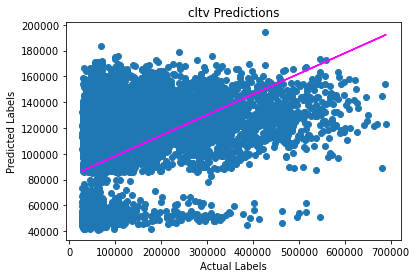

MSE: 7006071200.566022
RMSE: 83702.2771528112
R2: 0.1589965597244728


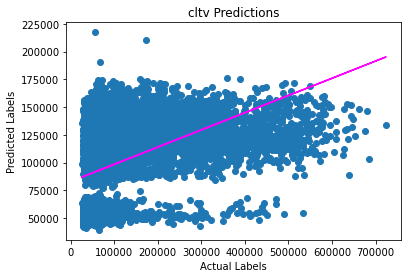

[I 2023-01-24 07:32:45,579] Trial 57 finished with value: 34488211691.57175 and parameters: {'n_estimators': 62, 'max_depth': 3, 'learning_rate': 0.11171569486737168}. Best is trial 48 with value: 34484543188.52203.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6728612097.481495
RMSE: 82028.11772484783
R2: 0.15912002278524506


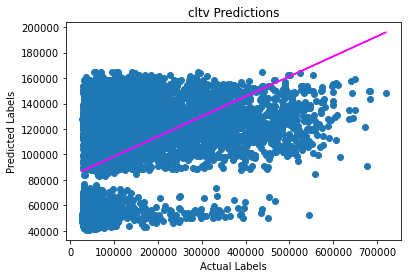

MSE: 6792583086.99856
RMSE: 82417.12860199972
R2: 0.1588632596076982


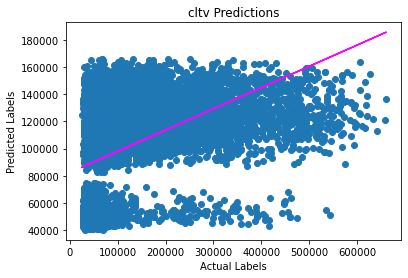

MSE: 7102156604.289605
RMSE: 84274.29385221572
R2: 0.15659432152849007


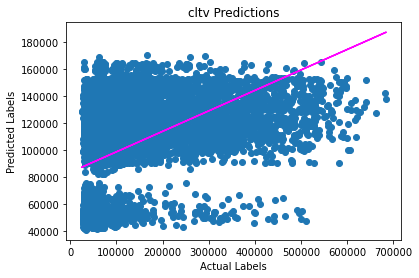

MSE: 6879679329.529897
RMSE: 82943.83237788026
R2: 0.16338635409838953


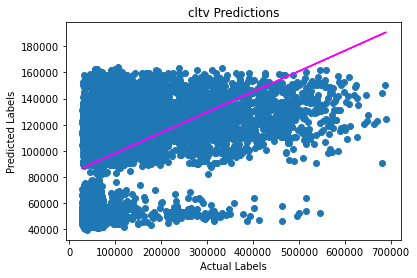

MSE: 7013057344.1655855
RMSE: 83743.99885463784
R2: 0.15815794837821395


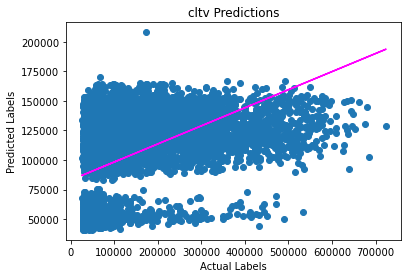

[I 2023-01-24 07:33:02,301] Trial 58 finished with value: 34516088462.46514 and parameters: {'n_estimators': 74, 'max_depth': 2, 'learning_rate': 0.09869816073121696}. Best is trial 48 with value: 34484543188.52203.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6726885193.361886
RMSE: 82017.59075565367
R2: 0.15933583535932594


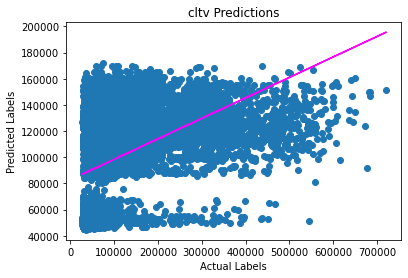

MSE: 6789106764.84845
RMSE: 82396.03609912585
R2: 0.1592937382995958


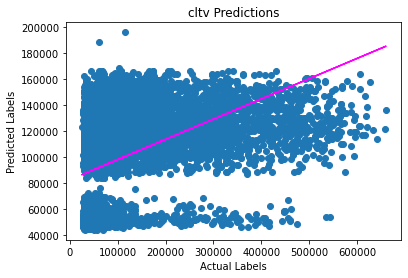

MSE: 7103351177.813131
RMSE: 84281.38096764393
R2: 0.15645246178795924


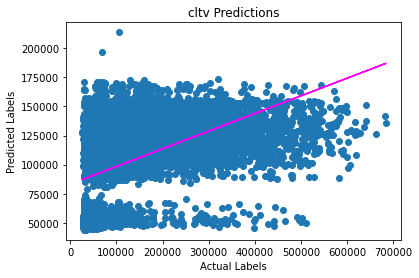

MSE: 6873369333.159306
RMSE: 82905.78588469749
R2: 0.16415369060004403


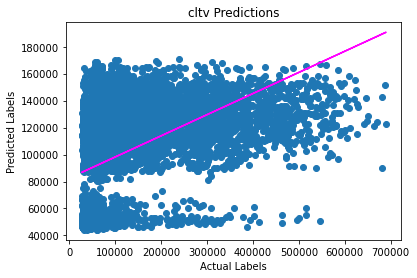

MSE: 7008234148.4235115
RMSE: 83715.19663969925
R2: 0.15873692111430016


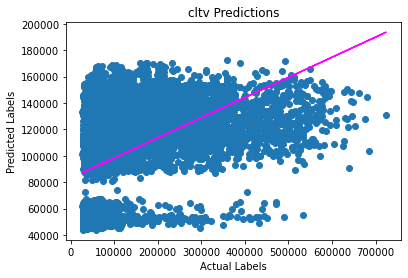

[I 2023-01-24 07:33:18,034] Trial 59 finished with value: 34500946617.606285 and parameters: {'n_estimators': 57, 'max_depth': 3, 'learning_rate': 0.08473638844884865}. Best is trial 48 with value: 34484543188.52203.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6723362027.524278
RMSE: 81996.10983165163
R2: 0.15977612818143117


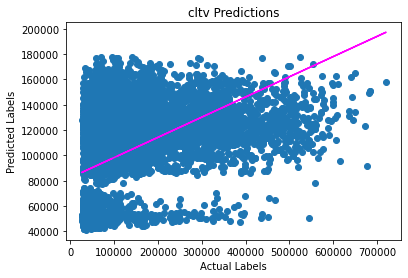

MSE: 6787224785.358965
RMSE: 82384.61497973371
R2: 0.15952678691644673


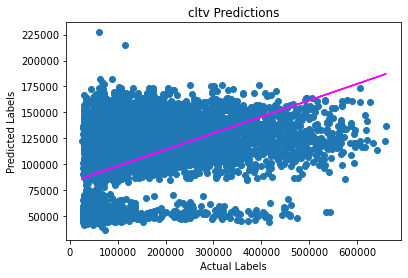

MSE: 7102594872.755757
RMSE: 84276.8940621079
R2: 0.15654227563121648


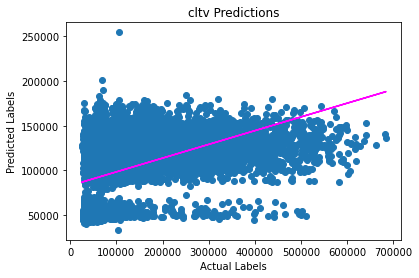

MSE: 6867119444.410641
RMSE: 82868.08459479826
R2: 0.1649137176248584


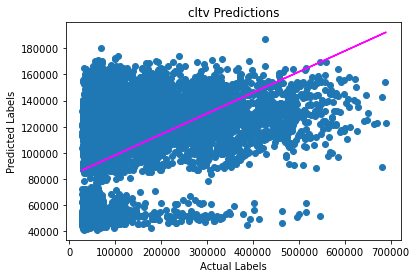

MSE: 7004798011.021832
RMSE: 83694.67134185923
R2: 0.15914939242573045


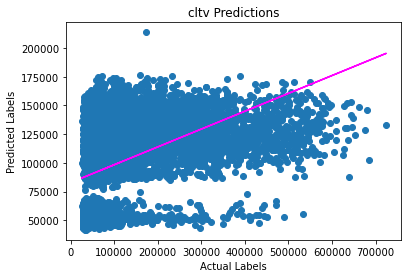

[I 2023-01-24 07:33:38,512] Trial 60 finished with value: 34485099141.07147 and parameters: {'n_estimators': 76, 'max_depth': 3, 'learning_rate': 0.08936882911325512}. Best is trial 48 with value: 34484543188.52203.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6726145909.234842
RMSE: 82013.0837685966
R2: 0.15942822428157277


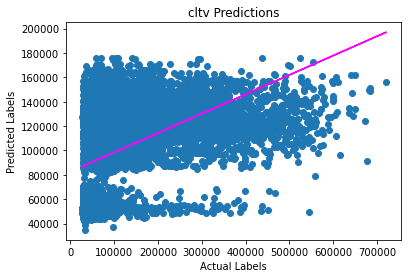

MSE: 6787309897.489577
RMSE: 82385.131531664
R2: 0.1595162473412669


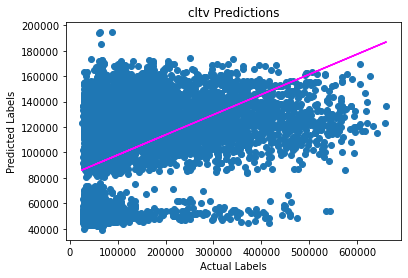

MSE: 7102224593.093088
RMSE: 84274.69722931723
R2: 0.1565862476227562


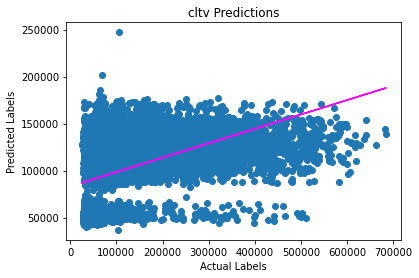

MSE: 6869065903.211898
RMSE: 82879.8280838703
R2: 0.16467701560484904


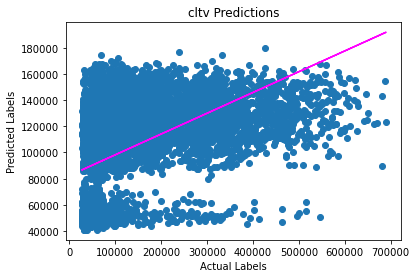

MSE: 7005678621.642992
RMSE: 83699.93202890306
R2: 0.15904368459879914


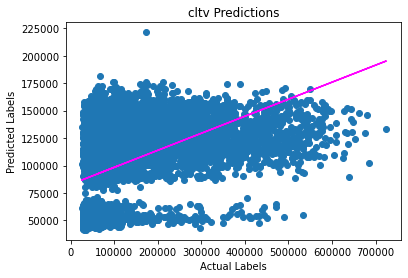

[I 2023-01-24 07:33:57,394] Trial 61 finished with value: 34490424924.67239 and parameters: {'n_estimators': 70, 'max_depth': 3, 'learning_rate': 0.09026319378948885}. Best is trial 48 with value: 34484543188.52203.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6726625937.007184
RMSE: 82016.01024804355
R2: 0.15936823483108564


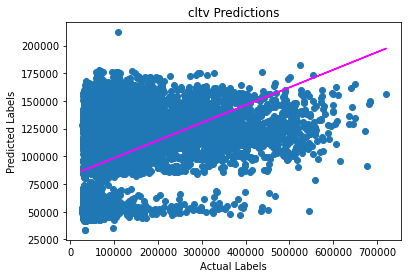

MSE: 6784512788.621814
RMSE: 82368.15397119091
R2: 0.1598626179348127


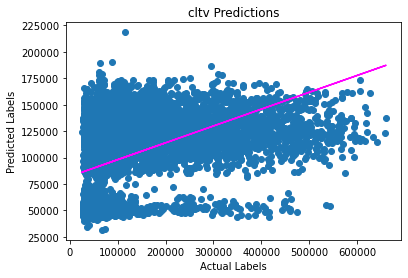

MSE: 7103063623.110698
RMSE: 84279.67502969324
R2: 0.15648660990414653


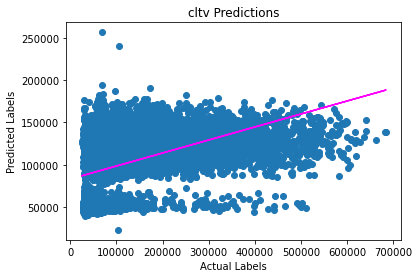

MSE: 6865866960.541691
RMSE: 82860.52715582789
R2: 0.16506602779017931


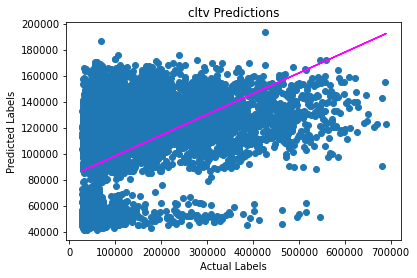

MSE: 7004095949.889725
RMSE: 83690.47705617243
R2: 0.15923366730825506


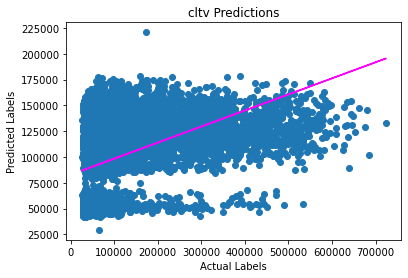

[I 2023-01-24 07:34:17,942] Trial 62 finished with value: 34484165259.17111 and parameters: {'n_estimators': 76, 'max_depth': 3, 'learning_rate': 0.09781832481865178}. Best is trial 62 with value: 34484165259.17111.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6725142978.122953
RMSE: 82006.96908265147
R2: 0.1595535613761021


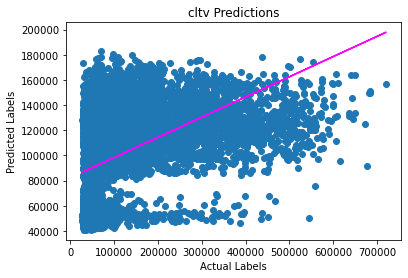

MSE: 6784043024.646005
RMSE: 82365.30231017187
R2: 0.1599207895809015


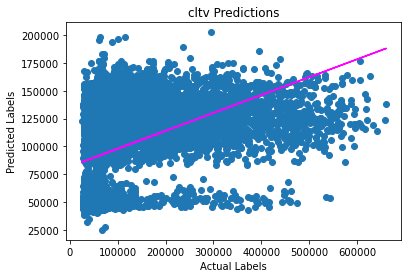

MSE: 7102625935.996204
RMSE: 84277.0783546523
R2: 0.15653858676389854


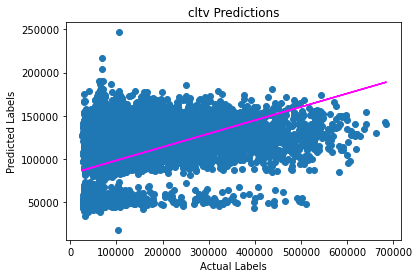

MSE: 6865650671.535144
RMSE: 82859.22200657657
R2: 0.16509232993678657


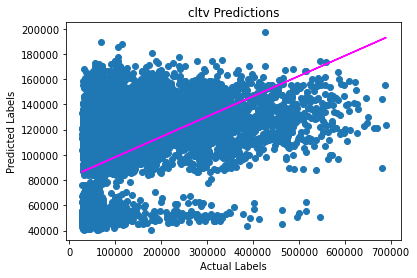

MSE: 7004856036.992435
RMSE: 83695.01799385932
R2: 0.15914242703250148


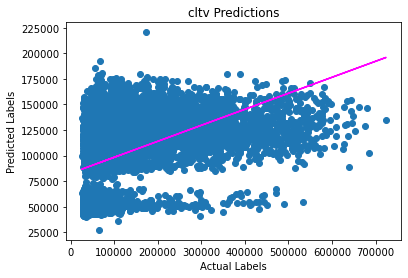

[I 2023-01-24 07:34:38,364] Trial 63 finished with value: 34482318647.29274 and parameters: {'n_estimators': 76, 'max_depth': 3, 'learning_rate': 0.1121403518450002}. Best is trial 63 with value: 34482318647.29274.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6726767959.096908
RMSE: 82016.87606277691
R2: 0.15935048621817105


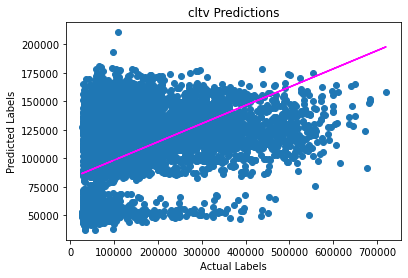

MSE: 6786600248.394332
RMSE: 82380.82451878187
R2: 0.15960412435640992


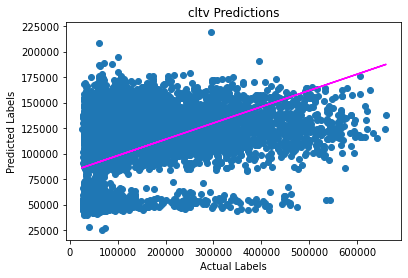

MSE: 7103592368.82603
RMSE: 84282.81182320646
R2: 0.15642381952037643


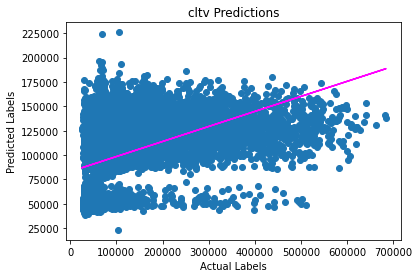

MSE: 6864453381.010741
RMSE: 82851.99684383438
R2: 0.16523792823328332


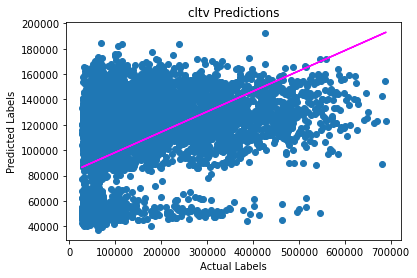

MSE: 7003919902.190935
RMSE: 83689.42527100383
R2: 0.15925479993966807


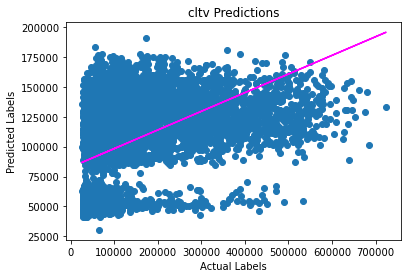

[I 2023-01-24 07:35:03,812] Trial 64 finished with value: 34485333859.51894 and parameters: {'n_estimators': 84, 'max_depth': 3, 'learning_rate': 0.09740576420986777}. Best is trial 63 with value: 34482318647.29274.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6729293414.447482
RMSE: 82032.27056742659
R2: 0.15903487806497651


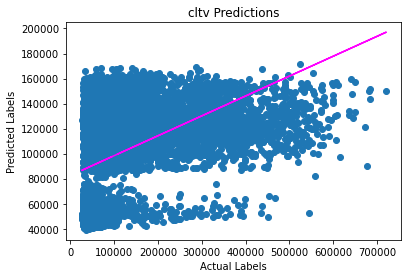

MSE: 6792693067.9084635
RMSE: 82417.79582049295
R2: 0.15884964049065875


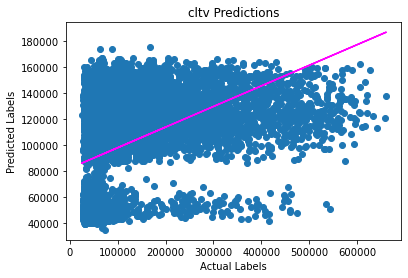

MSE: 7098047883.423735
RMSE: 84249.91325469561
R2: 0.1570822463522593


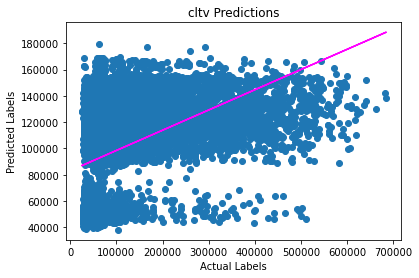

MSE: 6875090805.8533745
RMSE: 82916.1673369758
R2: 0.16394434835051175


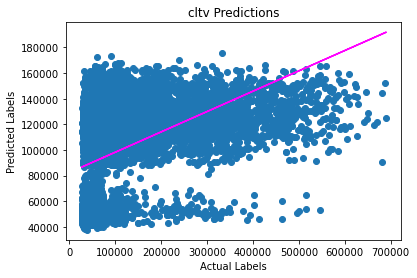

MSE: 7008753307.527708
RMSE: 83718.29732816899
R2: 0.1586746016516256


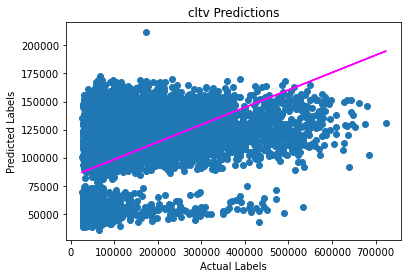

[I 2023-01-24 07:35:19,775] Trial 65 finished with value: 34503878479.16076 and parameters: {'n_estimators': 83, 'max_depth': 2, 'learning_rate': 0.11610783003560524}. Best is trial 63 with value: 34482318647.29274.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6727322900.617502
RMSE: 82020.25908650558
R2: 0.1592811347372961


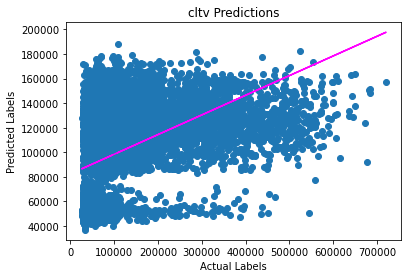

MSE: 6783933268.495269
RMSE: 82364.63603085531
R2: 0.15993438086564338


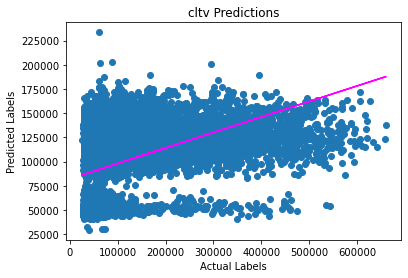

MSE: 7104609707.586235
RMSE: 84288.84687540954
R2: 0.1563030070214282


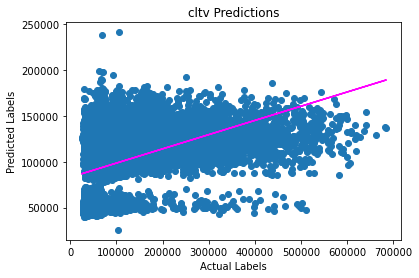

MSE: 6865483199.622809
RMSE: 82858.21141940495
R2: 0.16511269560798325


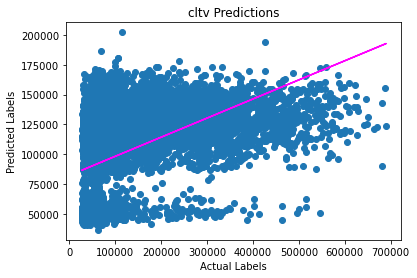

MSE: 7005038070.489985
RMSE: 83696.10546787697
R2: 0.15912057587037343


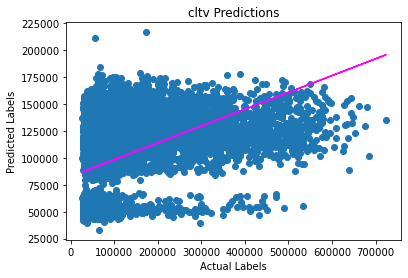

[I 2023-01-24 07:35:43,609] Trial 66 finished with value: 34486387146.8118 and parameters: {'n_estimators': 89, 'max_depth': 3, 'learning_rate': 0.09872995680472826}. Best is trial 63 with value: 34482318647.29274.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6729919143.532416
RMSE: 82036.08439907659
R2: 0.15895668020618192


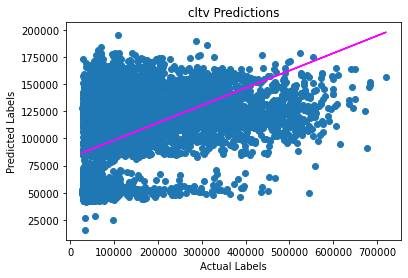

MSE: 6787162843.651941
RMSE: 82384.23904881286
R2: 0.1595344572599483


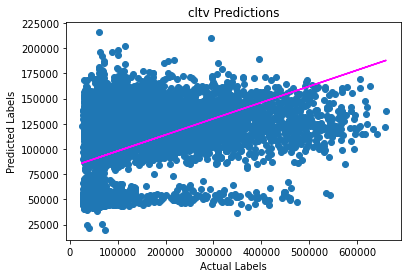

MSE: 7105782762.67758
RMSE: 84295.80513096473
R2: 0.15616370266919766


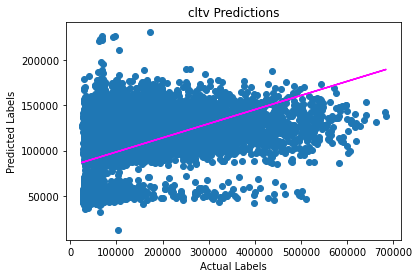

MSE: 6865491991.25425
RMSE: 82858.26447165213
R2: 0.16511162648855482


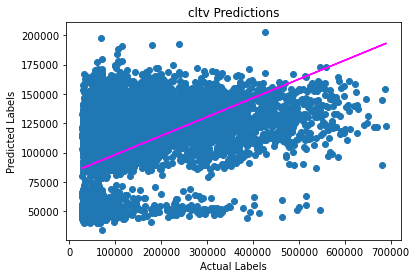

MSE: 7002634214.028194
RMSE: 83681.74361250005
R2: 0.15940913296555836


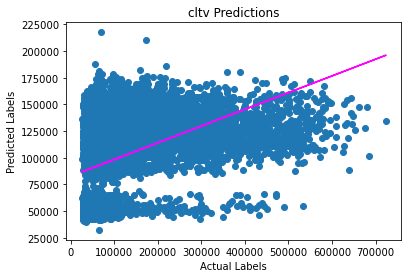

[I 2023-01-24 07:36:05,030] Trial 67 finished with value: 34490990955.14438 and parameters: {'n_estimators': 77, 'max_depth': 3, 'learning_rate': 0.12398621288466573}. Best is trial 63 with value: 34482318647.29274.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6725244771.760437
RMSE: 82007.58972046696
R2: 0.15954084014469094


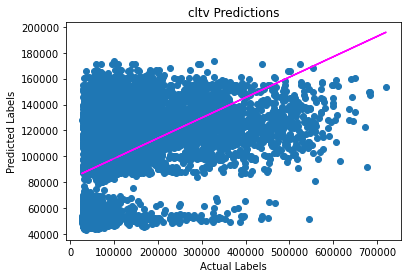

MSE: 6788723187.881837
RMSE: 82393.7084241378
R2: 0.15934123726652105


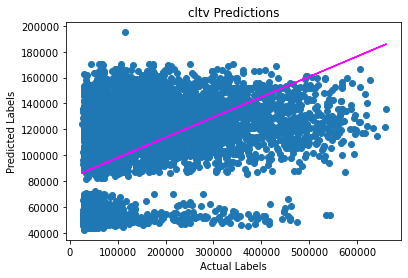

MSE: 7102144998.822275
RMSE: 84274.22499686529
R2: 0.15659569971790388


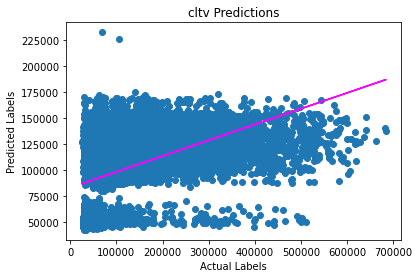

MSE: 6871233786.124795
RMSE: 82892.90552348128
R2: 0.1644133869761335


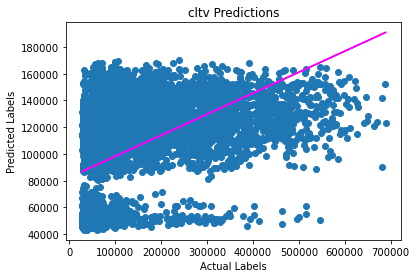

MSE: 7007951495.004921
RMSE: 83713.50843803478
R2: 0.15877085061496266


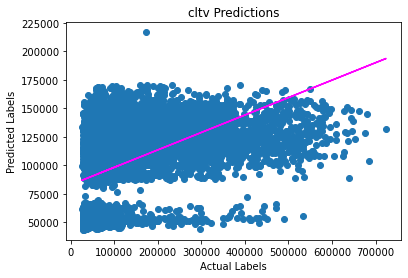

[I 2023-01-24 07:36:22,242] Trial 68 finished with value: 34495298239.59426 and parameters: {'n_estimators': 64, 'max_depth': 3, 'learning_rate': 0.07936497974428353}. Best is trial 63 with value: 34482318647.29274.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6728373584.072071
RMSE: 82026.66386043059
R2: 0.15914982999472238


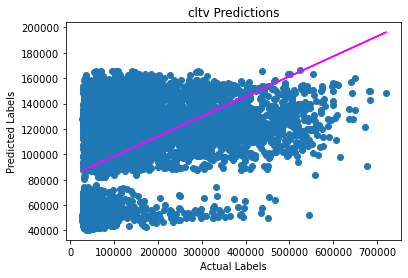

MSE: 6792508099.357295
RMSE: 82416.67367321551
R2: 0.15887254545070295


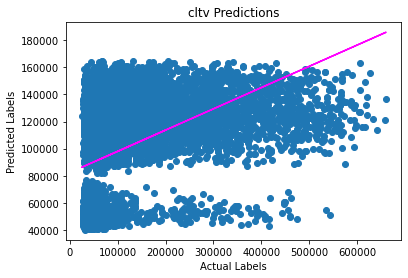

MSE: 7099804882.741458
RMSE: 84260.33991589079
R2: 0.15687359660202105


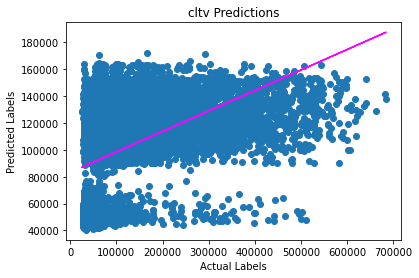

MSE: 6877525945.502423
RMSE: 82930.85038453678
R2: 0.16364821956856024


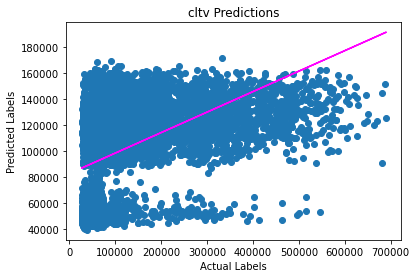

MSE: 7010714428.995569
RMSE: 83730.00913051168
R2: 0.1584391901272414


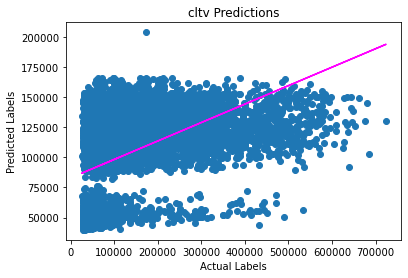

[I 2023-01-24 07:36:38,343] Trial 69 finished with value: 34508926940.668816 and parameters: {'n_estimators': 83, 'max_depth': 2, 'learning_rate': 0.09520422732802859}. Best is trial 63 with value: 34482318647.29274.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6727861799.347626
RMSE: 82023.5441769473
R2: 0.15921378813663878


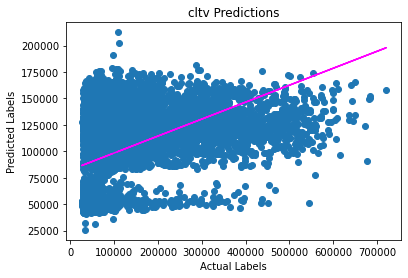

MSE: 6784510353.041914
RMSE: 82368.13918647134
R2: 0.1598629195366793


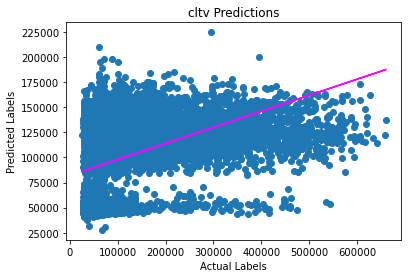

MSE: 7104627122.681304
RMSE: 84288.95018139272
R2: 0.1563009389186122


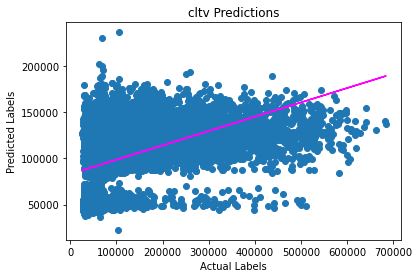

MSE: 6864538014.533879
RMSE: 82852.50759351753
R2: 0.1652276362477174


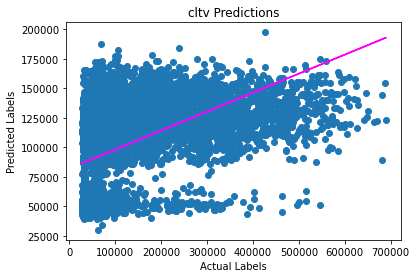

MSE: 7002661165.0849495
RMSE: 83681.9046454187
R2: 0.15940589778127312


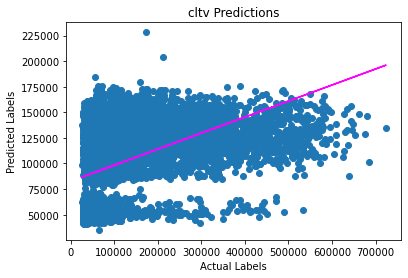

[I 2023-01-24 07:37:03,902] Trial 70 finished with value: 34484198454.68967 and parameters: {'n_estimators': 86, 'max_depth': 3, 'learning_rate': 0.10347278863973013}. Best is trial 63 with value: 34482318647.29274.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6728985231.136172
RMSE: 82030.39211862987
R2: 0.15907339197721249


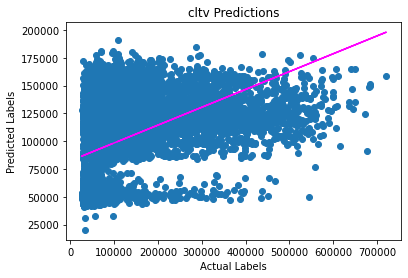

MSE: 6789388209.418566
RMSE: 82397.74395830608
R2: 0.15925888655538067


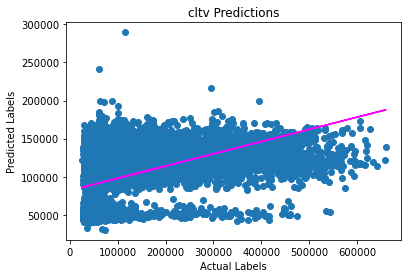

MSE: 7103629683.515828
RMSE: 84283.03318886802
R2: 0.1564193882718108


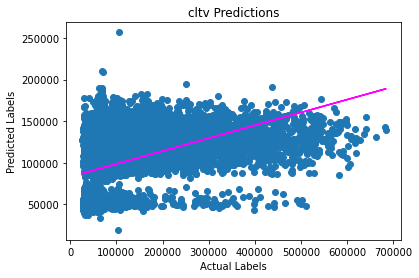

MSE: 6864128129.715409
RMSE: 82850.03397534252
R2: 0.16527748090121852


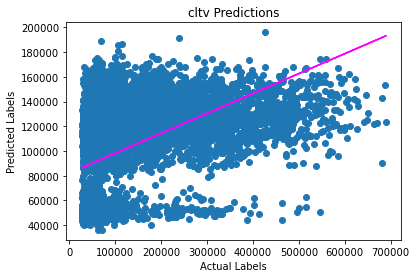

MSE: 7003465669.218822
RMSE: 83686.71142552336
R2: 0.15930932571899548


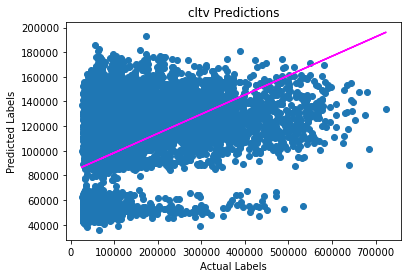

[I 2023-01-24 07:37:28,192] Trial 71 finished with value: 34489596923.00479 and parameters: {'n_estimators': 87, 'max_depth': 3, 'learning_rate': 0.1063713419446177}. Best is trial 63 with value: 34482318647.29274.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6727084560.777793
RMSE: 82018.80614089547
R2: 0.15931092025562898


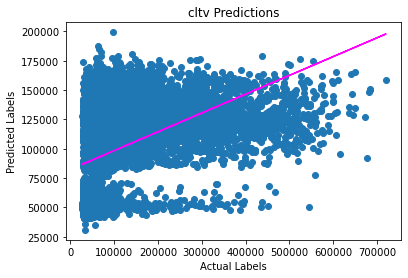

MSE: 6786687410.204943
RMSE: 82381.353534674
R2: 0.15959333096598327


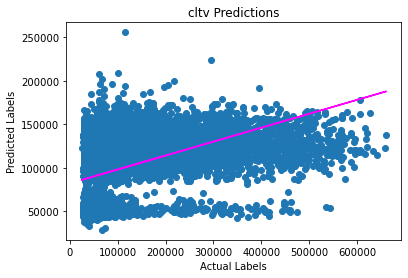

MSE: 7104191254.946849
RMSE: 84286.36458494843
R2: 0.15635269972068755


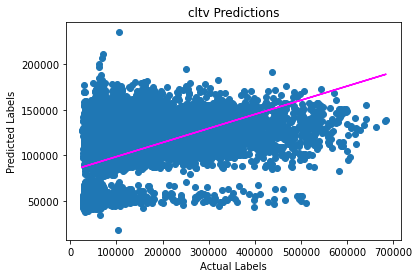

MSE: 6864717000.408099
RMSE: 82853.58773407522
R2: 0.16520587040404588


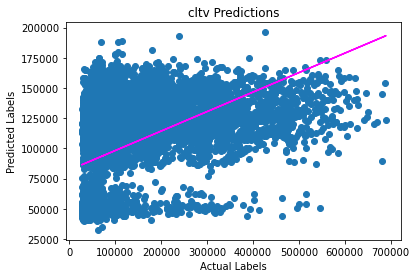

MSE: 7002571293.042525
RMSE: 83681.3676575767
R2: 0.15941668595266034


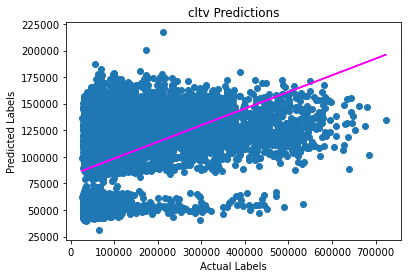

[I 2023-01-24 07:37:52,404] Trial 72 finished with value: 34485251519.38021 and parameters: {'n_estimators': 77, 'max_depth': 3, 'learning_rate': 0.11601095124988178}. Best is trial 63 with value: 34482318647.29274.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6725542154.705169
RMSE: 82009.40284324212
R2: 0.159503675962811


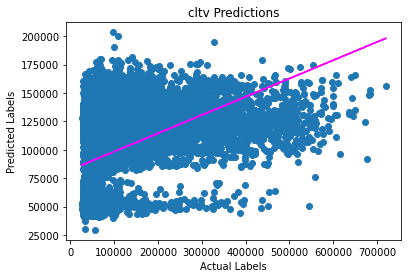

MSE: 6788328156.061521
RMSE: 82391.31116848135
R2: 0.1593901547068286


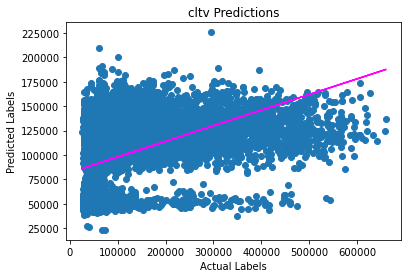

MSE: 7103325276.248386
RMSE: 84281.2273062536
R2: 0.15645553768842213


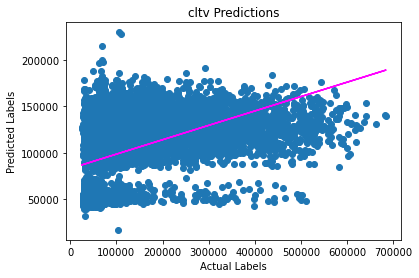

MSE: 6862991118.778295
RMSE: 82843.17182953762
R2: 0.16541574880877163


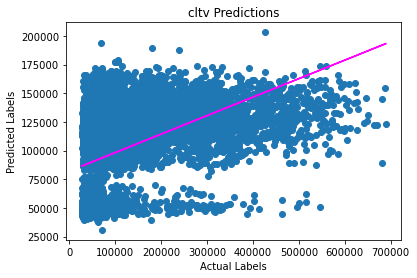

MSE: 7004617536.674448
RMSE: 83693.59316384049
R2: 0.1591710564286627


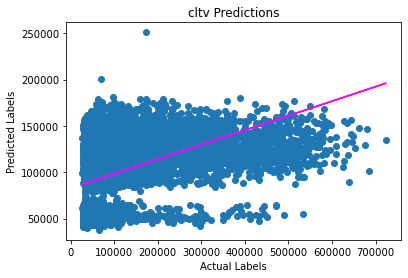

[I 2023-01-24 07:38:16,808] Trial 73 finished with value: 34484804242.46782 and parameters: {'n_estimators': 81, 'max_depth': 3, 'learning_rate': 0.11447882133049134}. Best is trial 63 with value: 34482318647.29274.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6731487064.523322
RMSE: 82045.64013110826
R2: 0.15876073587947603


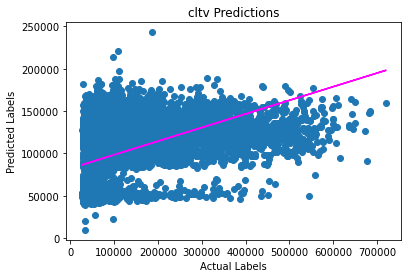

MSE: 6793172101.958533
RMSE: 82420.70190163715
R2: 0.15879032091602086


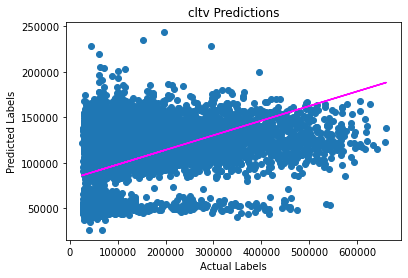

MSE: 7110111580.517746
RMSE: 84321.47757551302
R2: 0.15564964056793962


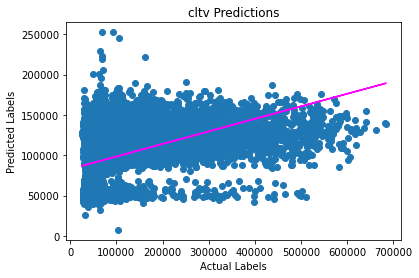

MSE: 6867590161.140235
RMSE: 82870.92470305997
R2: 0.16485647541625104


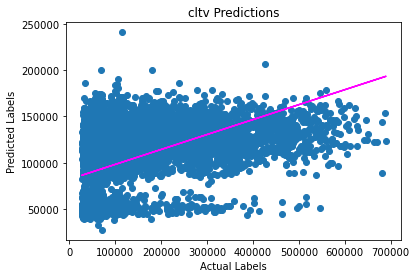

MSE: 7001936073.2088
RMSE: 83677.57210393237
R2: 0.15949293725673652


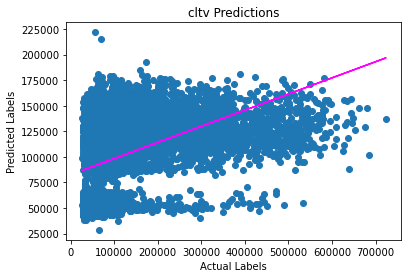

[I 2023-01-24 07:38:44,280] Trial 74 finished with value: 34504296981.34864 and parameters: {'n_estimators': 98, 'max_depth': 3, 'learning_rate': 0.11951651236982483}. Best is trial 63 with value: 34482318647.29274.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6730331075.92592
RMSE: 82038.59503871284
R2: 0.15890520068906244


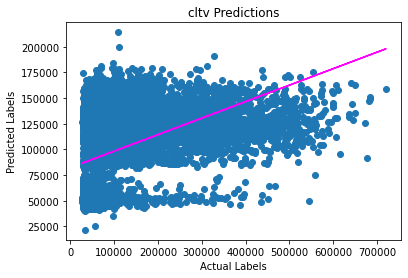

MSE: 6788808411.605482
RMSE: 82394.22559624845
R2: 0.1593306838725923


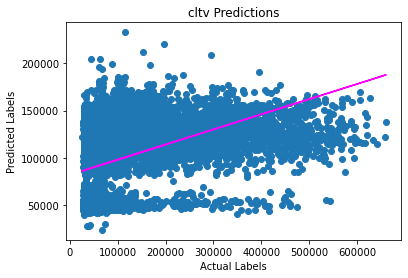

MSE: 7105670561.574823
RMSE: 84295.13960825276
R2: 0.15617702693849622


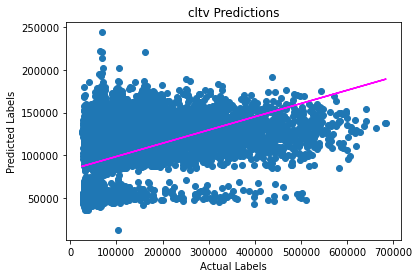

MSE: 6865426243.600595
RMSE: 82857.86772299053
R2: 0.16511962182984885


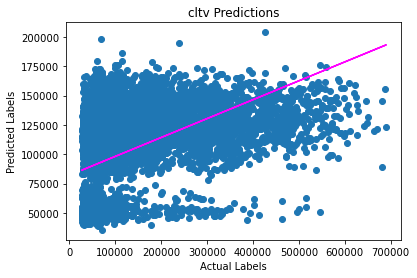

MSE: 7006354614.671302
RMSE: 83703.97012490687
R2: 0.15896253891156076


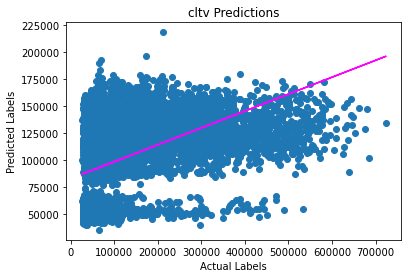

[I 2023-01-24 07:39:10,498] Trial 75 finished with value: 34496590907.37812 and parameters: {'n_estimators': 77, 'max_depth': 3, 'learning_rate': 0.12934099512526026}. Best is trial 63 with value: 34482318647.29274.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6726155115.687003
RMSE: 82013.13989652514
R2: 0.15942707374396248


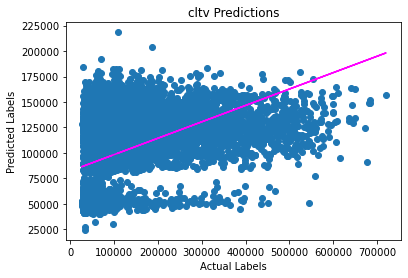

MSE: 6786878685.6903305
RMSE: 82382.5144414173
R2: 0.15956964500789705


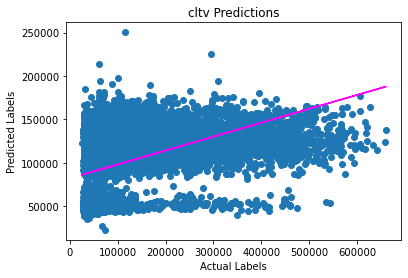

MSE: 7102640664.610685
RMSE: 84277.16573669694
R2: 0.15653683768995075


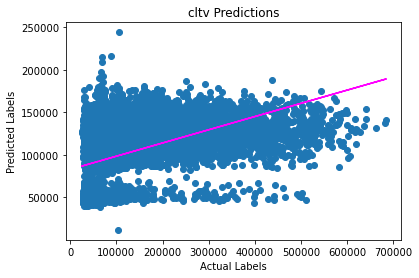

MSE: 6864346498.925593
RMSE: 82851.35182316335
R2: 0.16525092578835143


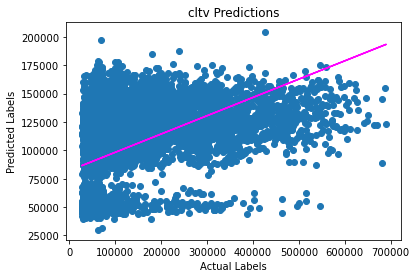

MSE: 7003874425.928778
RMSE: 83689.15357397743
R2: 0.15926025887547246


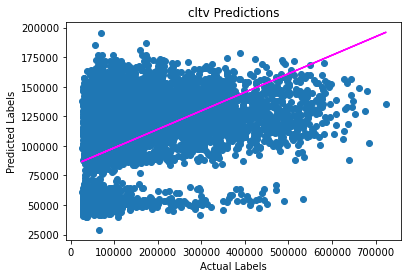

[I 2023-01-24 07:39:32,373] Trial 76 finished with value: 34483895390.84239 and parameters: {'n_estimators': 80, 'max_depth': 3, 'learning_rate': 0.1141863417943544}. Best is trial 63 with value: 34482318647.29274.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6725362725.776914
RMSE: 82008.30888255722
R2: 0.1595260993379316


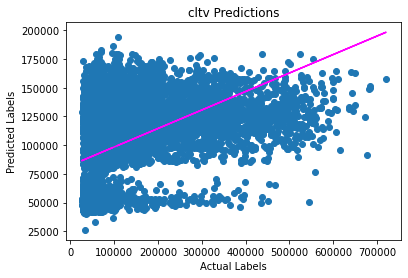

MSE: 6786609566.332869
RMSE: 82380.88107281245
R2: 0.159602970500749


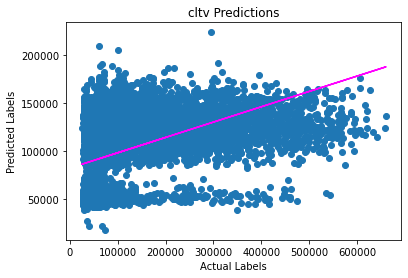

MSE: 7104180758.783049
RMSE: 84286.30232002736
R2: 0.1563539461764677


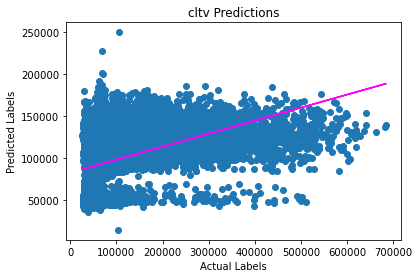

MSE: 6863430302.695639
RMSE: 82845.82248185866
R2: 0.16536234119473736


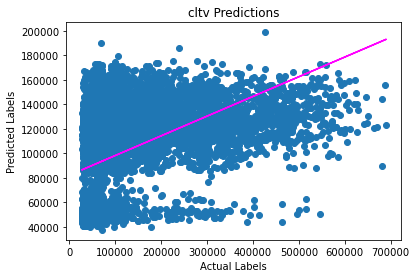

MSE: 7004854359.896284
RMSE: 83695.00797476684
R2: 0.1591426283498436


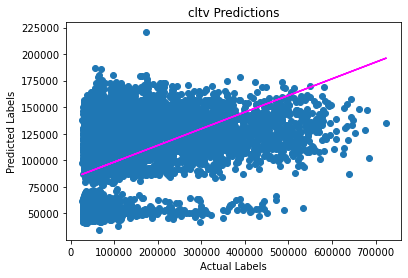

[I 2023-01-24 07:39:53,712] Trial 77 finished with value: 34484437713.48476 and parameters: {'n_estimators': 80, 'max_depth': 3, 'learning_rate': 0.11463489072735587}. Best is trial 63 with value: 34482318647.29274.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6728001084.403415
RMSE: 82024.39322788932
R2: 0.1591963815730203


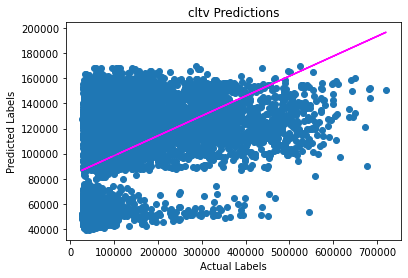

MSE: 6790555674.315969
RMSE: 82404.82797940889
R2: 0.1591143174561518


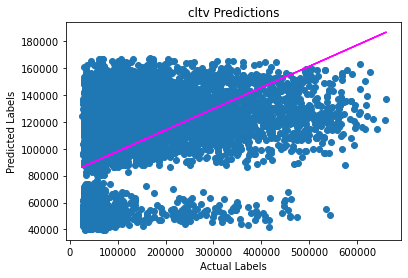

MSE: 7098560563.172941
RMSE: 84252.95581267723
R2: 0.15702136385757348


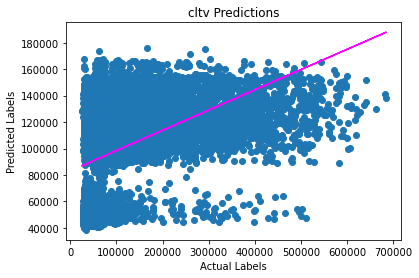

MSE: 6873906013.250155
RMSE: 82909.02250810919
R2: 0.16408842681869862


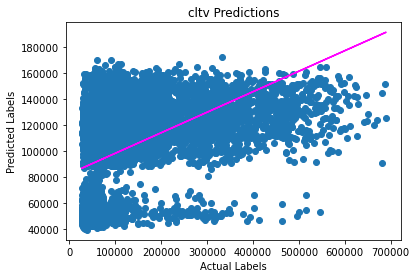

MSE: 7009703790.382606
RMSE: 83723.97380907458
R2: 0.1585605064150789


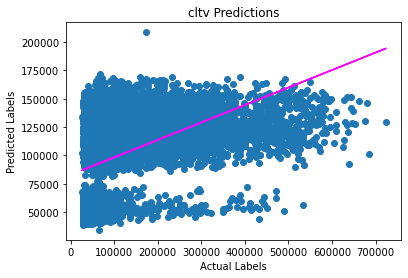

[I 2023-01-24 07:40:09,415] Trial 78 finished with value: 34500727125.525085 and parameters: {'n_estimators': 80, 'max_depth': 2, 'learning_rate': 0.11007996170757796}. Best is trial 63 with value: 34482318647.29274.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6724359550.16684
RMSE: 82002.1923497588
R2: 0.15965146698759258


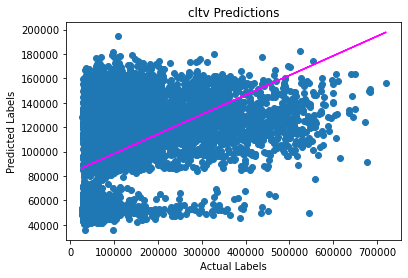

MSE: 6787153887.41685
RMSE: 82384.18469231125
R2: 0.15953556632527655


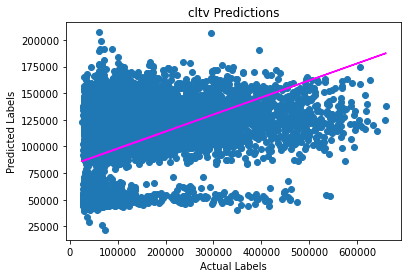

MSE: 7103076520.176507
RMSE: 84279.75154315837
R2: 0.1564850783329429


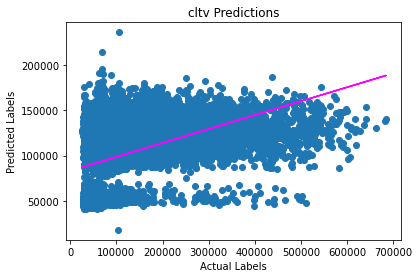

MSE: 6866848570.394434
RMSE: 82866.45020992775
R2: 0.16494665766282013


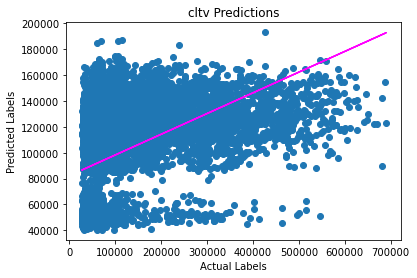

MSE: 7005210027.900606
RMSE: 83697.13273404655
R2: 0.15909993423403068


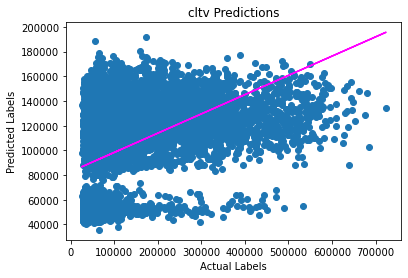

[I 2023-01-24 07:40:28,307] Trial 79 finished with value: 34486648556.05524 and parameters: {'n_estimators': 71, 'max_depth': 3, 'learning_rate': 0.11405395501870541}. Best is trial 63 with value: 34482318647.29274.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6725850461.197649
RMSE: 82011.28252379455
R2: 0.15946514665652678


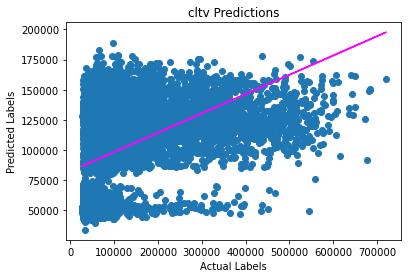

MSE: 6786275634.102493
RMSE: 82378.85428981452
R2: 0.1596443218782989


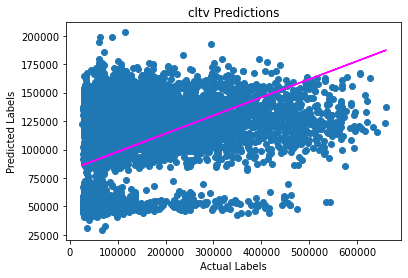

MSE: 7100530142.625475
RMSE: 84264.64349076353
R2: 0.15678746948055233


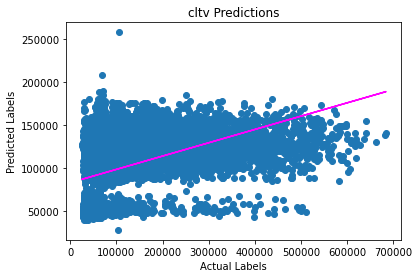

MSE: 6867780158.6884775
RMSE: 82872.0710413857
R2: 0.16483337048156832


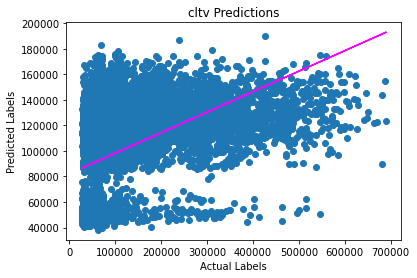

MSE: 7006280709.220622
RMSE: 83703.52865453536
R2: 0.15897141046545993


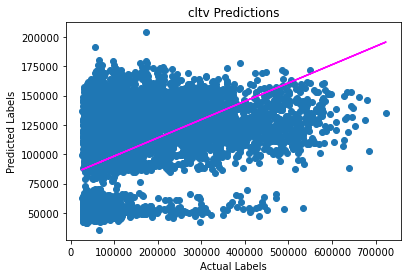

[I 2023-01-24 07:40:46,342] Trial 80 finished with value: 34486717105.83472 and parameters: {'n_estimators': 66, 'max_depth': 3, 'learning_rate': 0.1199524034471211}. Best is trial 63 with value: 34482318647.29274.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6728250842.98134
RMSE: 82025.91567901781
R2: 0.15916516904593858


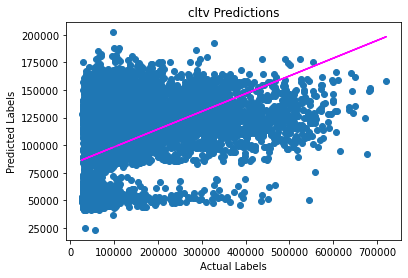

MSE: 6789640277.880113
RMSE: 82399.27352762349
R2: 0.15922767250302594


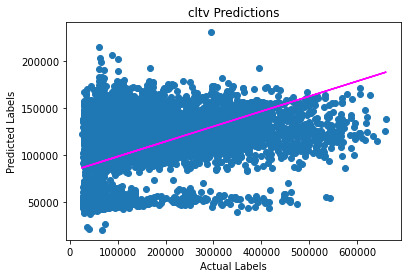

MSE: 7105433216.364263
RMSE: 84293.73177386478
R2: 0.15620521250374042


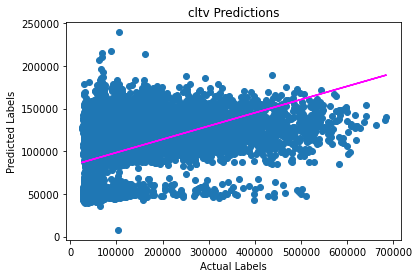

MSE: 6865289284.769073
RMSE: 82857.04125039147
R2: 0.16513627691243193


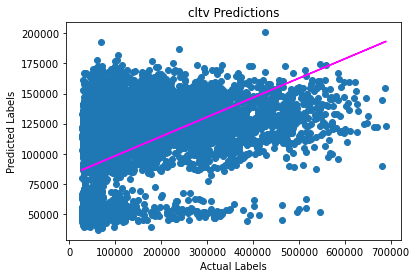

MSE: 7004153004.942687
RMSE: 83690.81792492344
R2: 0.15922681846323872


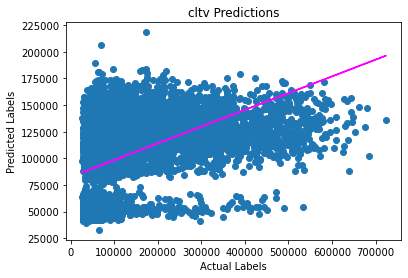

[I 2023-01-24 07:41:12,691] Trial 81 finished with value: 34492766626.93748 and parameters: {'n_estimators': 90, 'max_depth': 3, 'learning_rate': 0.11409414785881551}. Best is trial 63 with value: 34482318647.29274.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6727406864.165412
RMSE: 82020.7709313038
R2: 0.15927064174628536


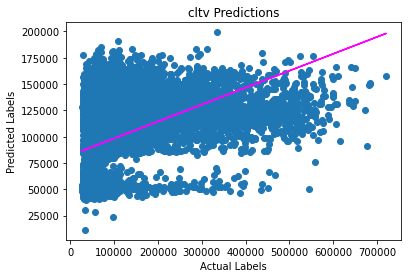

MSE: 6787565212.322159
RMSE: 82386.68103718075
R2: 0.15948463128544532


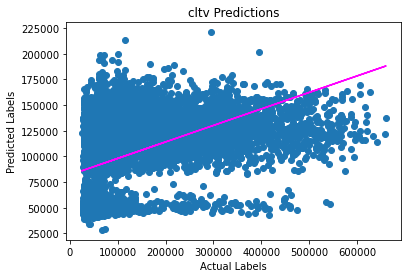

MSE: 7110810905.679468
RMSE: 84325.62425312646
R2: 0.15556659328450773


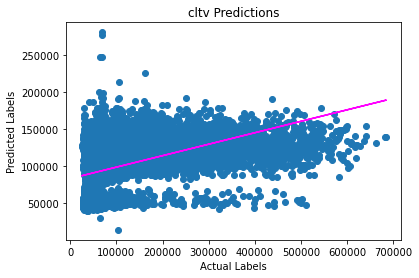

MSE: 6864788922.85349
RMSE: 82854.02176631796
R2: 0.16519712416801102


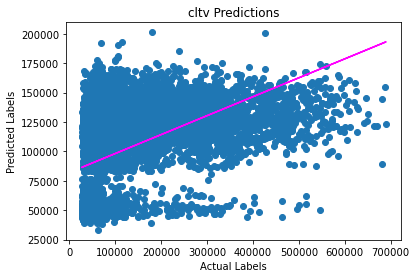

MSE: 7002023724.694809
RMSE: 83678.0958476877
R2: 0.1594824156392467


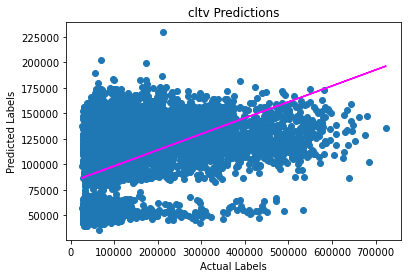

[I 2023-01-24 07:41:33,687] Trial 82 finished with value: 34492595629.71533 and parameters: {'n_estimators': 77, 'max_depth': 3, 'learning_rate': 0.13155821865930778}. Best is trial 63 with value: 34482318647.29274.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6726654052.356239
RMSE: 82016.18164945403
R2: 0.15936472123367051


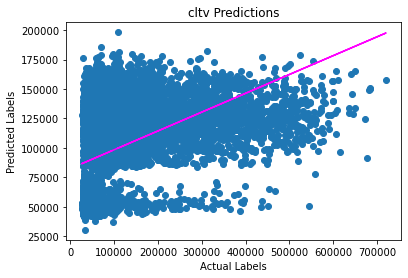

MSE: 6782739344.838794
RMSE: 82357.38791898875
R2: 0.16008222639654413


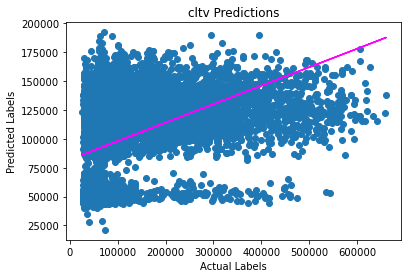

MSE: 7102787709.967675
RMSE: 84278.03812362789
R2: 0.1565193755448605


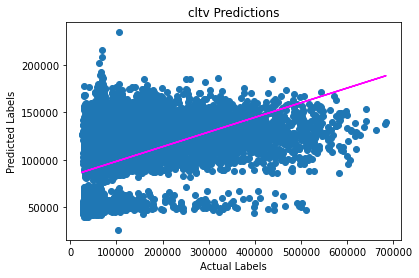

MSE: 6862870035.63346
RMSE: 82842.44102894036
R2: 0.1654304733048425


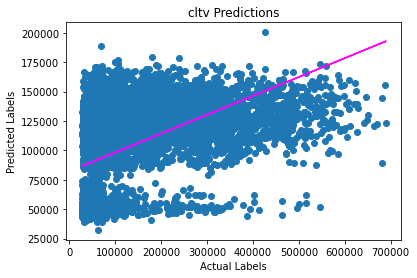

MSE: 7004138452.163409
RMSE: 83690.73098117503
R2: 0.1592285653677573


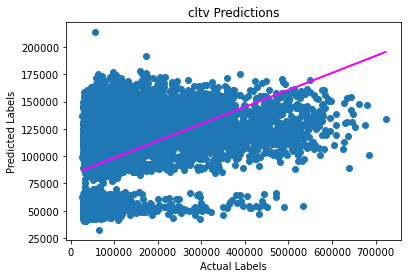

[I 2023-01-24 07:41:55,284] Trial 83 finished with value: 34479189594.95958 and parameters: {'n_estimators': 81, 'max_depth': 3, 'learning_rate': 0.10259230238195848}. Best is trial 83 with value: 34479189594.95958.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6726722004.600077
RMSE: 82016.5959096089
R2: 0.1593562291879973


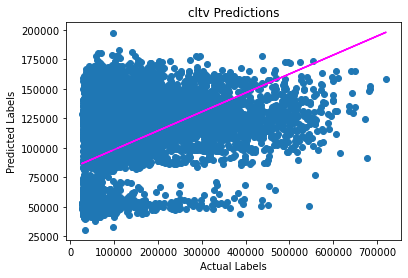

MSE: 6785443081.209086
RMSE: 82373.8009394315
R2: 0.1597474182729982


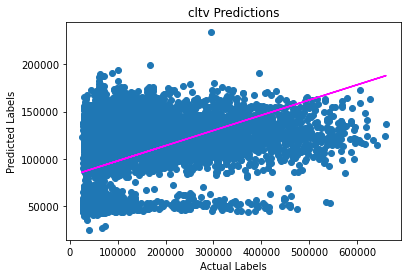

MSE: 7105375850.9024725
RMSE: 84293.39150195864
R2: 0.15621202485087904


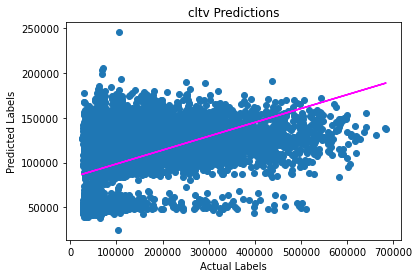

MSE: 6865186005.191467
RMSE: 82856.41800845283
R2: 0.16514883637920785


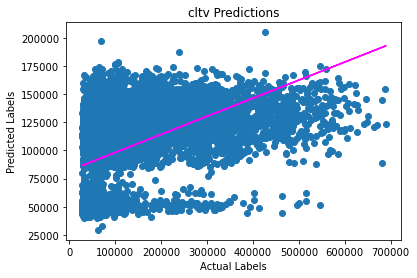

MSE: 7003012175.8172035
RMSE: 83684.0019108623
R2: 0.15936376272084496


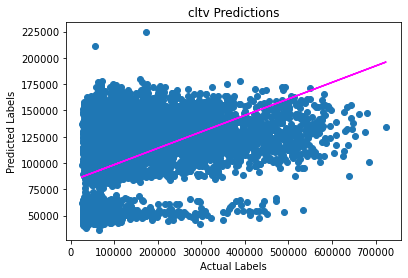

[I 2023-01-24 07:42:18,285] Trial 84 finished with value: 34485739117.72031 and parameters: {'n_estimators': 87, 'max_depth': 3, 'learning_rate': 0.10386581511433547}. Best is trial 83 with value: 34479189594.95958.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6726455764.375165
RMSE: 82014.97280603807
R2: 0.15938950143954234


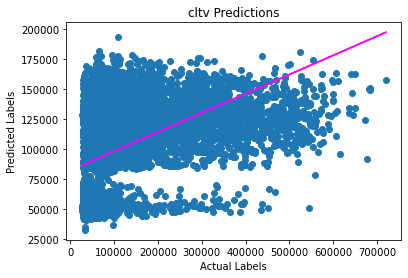

MSE: 6785838909.305269
RMSE: 82376.2035378256
R2: 0.15969840222853982


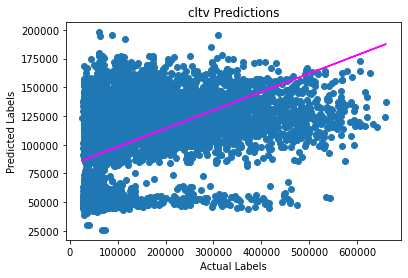

MSE: 7101559618.883983
RMSE: 84270.75185901679
R2: 0.15666521561167068


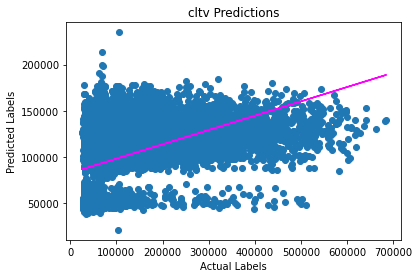

MSE: 6865023208.510165
RMSE: 82855.43560026804
R2: 0.1651686335119753


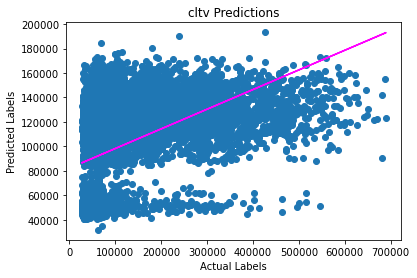

MSE: 7004300805.931572
RMSE: 83691.70093821472
R2: 0.15920907654532634


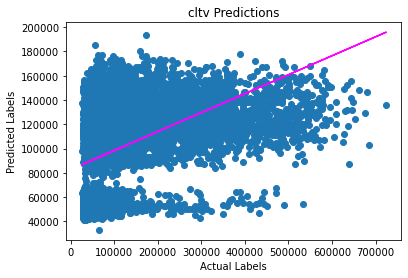

[I 2023-01-24 07:42:40,007] Trial 85 finished with value: 34483178307.00616 and parameters: {'n_estimators': 80, 'max_depth': 3, 'learning_rate': 0.10218463099863445}. Best is trial 83 with value: 34479189594.95958.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6726430554.533428
RMSE: 82014.81911541004
R2: 0.15939265193340924


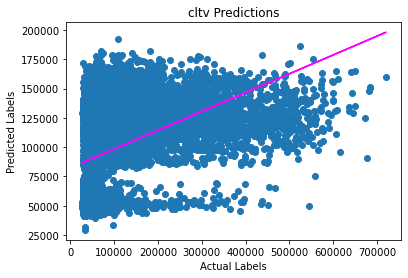

MSE: 6785883221.219095
RMSE: 82376.47249803244
R2: 0.15969291501133853


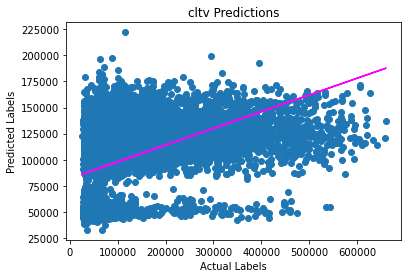

MSE: 7105952047.735622
RMSE: 84296.80923816525
R2: 0.15614359948263223


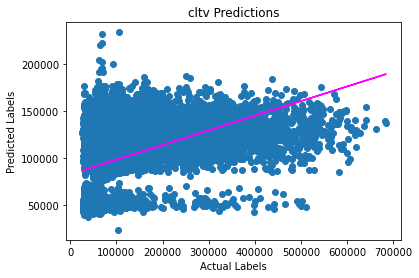

MSE: 6864422521.42628
RMSE: 82851.8106104283
R2: 0.16524168095898906


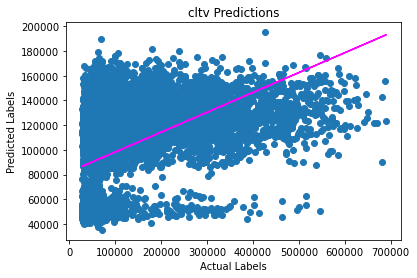

MSE: 7000483855.805712
RMSE: 83668.89419494984
R2: 0.15966726032555245


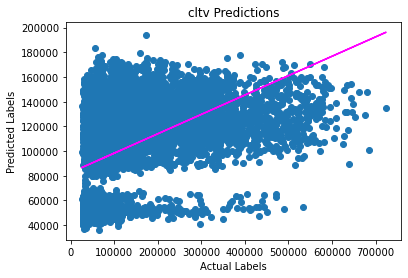

[I 2023-01-24 07:43:04,224] Trial 86 finished with value: 34483172200.72014 and parameters: {'n_estimators': 81, 'max_depth': 3, 'learning_rate': 0.10839905301212739}. Best is trial 83 with value: 34479189594.95958.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6725720154.724681
RMSE: 82010.48807759091
R2: 0.1594814311595466


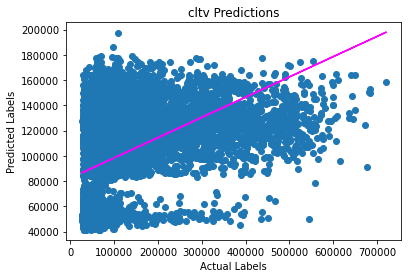

MSE: 6785248826.403899
RMSE: 82372.62182548216
R2: 0.15977147316515738


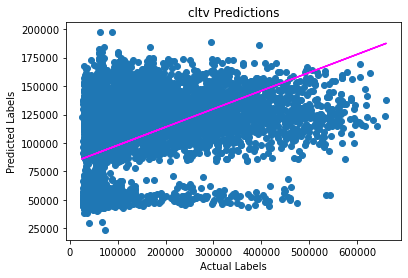

MSE: 7104773652.625448
RMSE: 84289.81938897158
R2: 0.15628353798058137


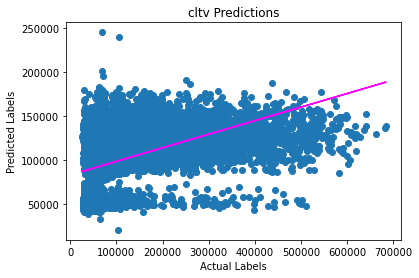

MSE: 6866098965.65348
RMSE: 82861.92711766654
R2: 0.16503781446319932


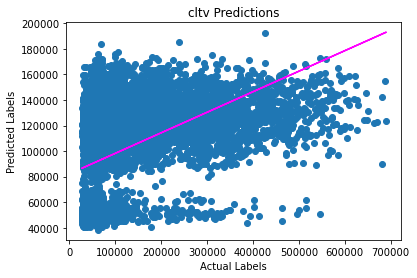

MSE: 7004646653.21137
RMSE: 83693.76711088688
R2: 0.15916756130179066


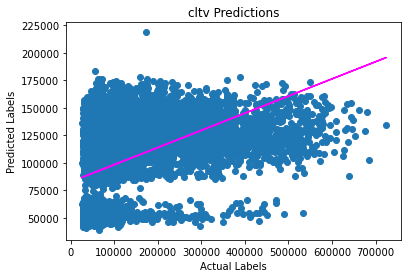

[I 2023-01-24 07:43:25,740] Trial 87 finished with value: 34486488252.61888 and parameters: {'n_estimators': 80, 'max_depth': 3, 'learning_rate': 0.10073404266487113}. Best is trial 83 with value: 34479189594.95958.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6726592215.477546
RMSE: 82015.80466884139
R2: 0.1593724490373235


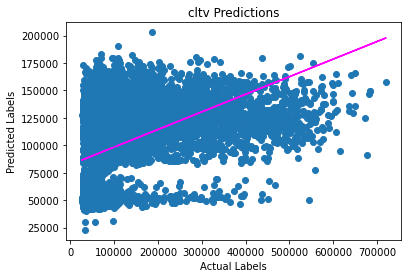

MSE: 6790366850.397673
RMSE: 82403.68226237025
R2: 0.15913769983265125


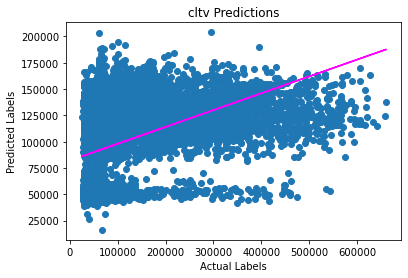

MSE: 7105950735.265197
RMSE: 84296.80145334813
R2: 0.15614375534303793


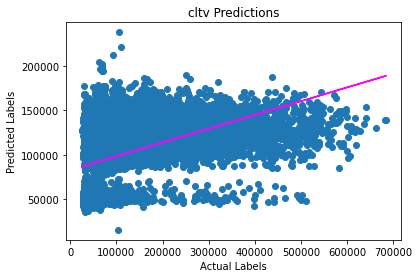

MSE: 6864817410.135934
RMSE: 82854.19367863002
R2: 0.16519365992962354


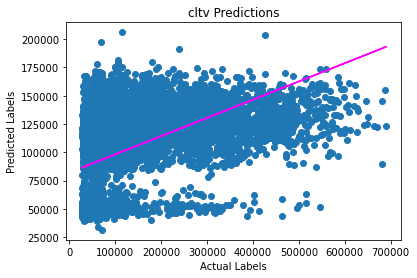

MSE: 7005864219.182411
RMSE: 83701.04072938646
R2: 0.1590214056118049


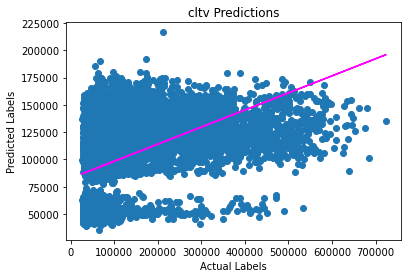

[I 2023-01-24 07:43:49,217] Trial 88 finished with value: 34493591430.458755 and parameters: {'n_estimators': 86, 'max_depth': 3, 'learning_rate': 0.10941453200215466}. Best is trial 83 with value: 34479189594.95958.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6727022173.918847
RMSE: 82018.4258195611
R2: 0.15931871679074927


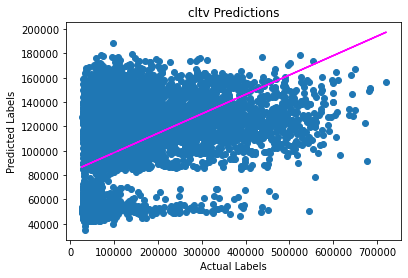

MSE: 6785356461.123439
RMSE: 82373.27516326784
R2: 0.15975814458073123


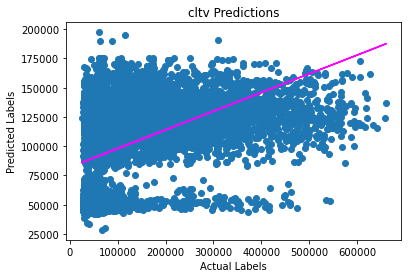

MSE: 7100885784.601366
RMSE: 84266.75373242621
R2: 0.1567452357649809


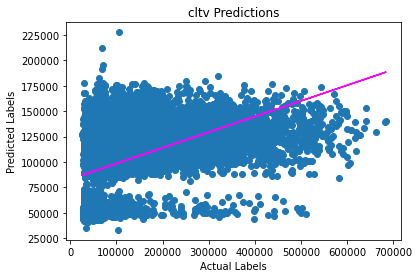

MSE: 6865727494.466547
RMSE: 82859.68558030223
R2: 0.1650829877698553


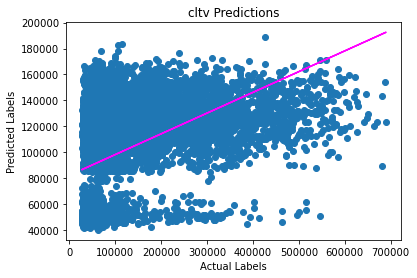

MSE: 7004309196.358429
RMSE: 83691.75106519417
R2: 0.15920806936488952


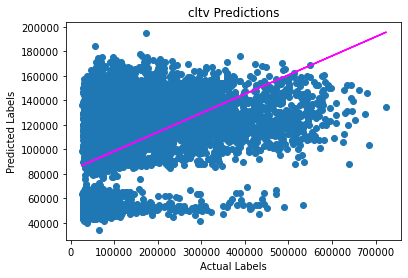

[I 2023-01-24 07:44:09,788] Trial 89 finished with value: 34483301110.46863 and parameters: {'n_estimators': 72, 'max_depth': 3, 'learning_rate': 0.10210992036009867}. Best is trial 83 with value: 34479189594.95958.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6727450887.34225
RMSE: 82021.03929689169
R2: 0.15926514013504667


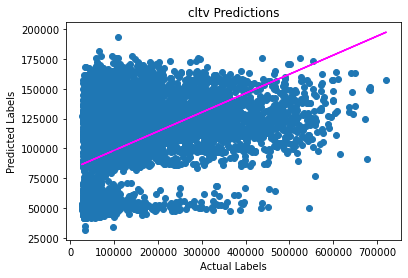

MSE: 6787989119.694421
RMSE: 82389.25366632726
R2: 0.1594321381380276


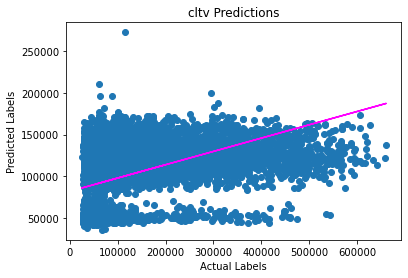

MSE: 7102075631.236447
RMSE: 84273.81343713151
R2: 0.1566039373588134


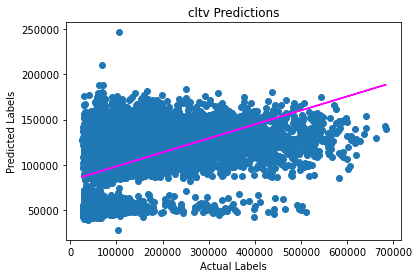

MSE: 6865689517.772439
RMSE: 82859.45641731207
R2: 0.16508760598227412


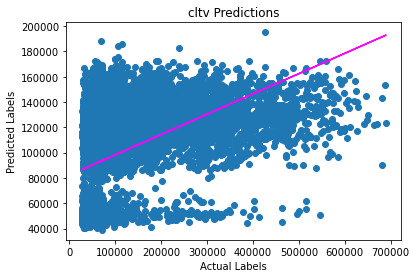

MSE: 7004221263.596851
RMSE: 83691.22572645744
R2: 0.15921862474648407


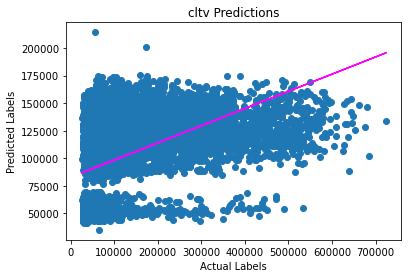

[I 2023-01-24 07:44:29,749] Trial 90 finished with value: 34487426419.64241 and parameters: {'n_estimators': 72, 'max_depth': 3, 'learning_rate': 0.10637605424110247}. Best is trial 83 with value: 34479189594.95958.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6726069820.162222
RMSE: 82012.61988354122
R2: 0.15943773319317667


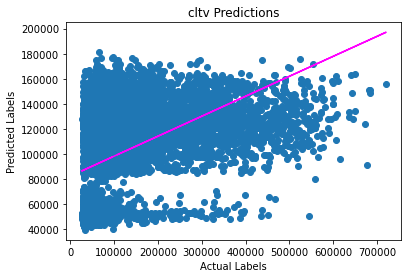

MSE: 6785167667.245087
RMSE: 82372.1291897028
R2: 0.15978152323733497


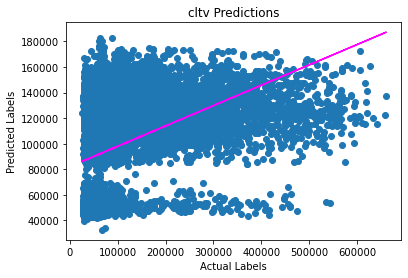

MSE: 7101053931.355422
RMSE: 84267.75143170383
R2: 0.15672526775595352


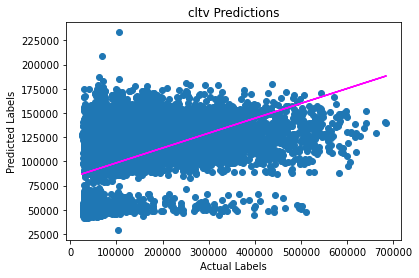

MSE: 6864673515.081066
RMSE: 82853.3253109437
R2: 0.16521115850197177


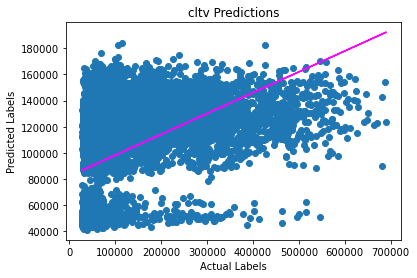

MSE: 7005029030.547791
RMSE: 83696.05146330256
R2: 0.15912166101813563


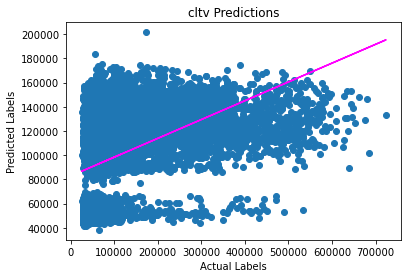

[I 2023-01-24 07:44:48,351] Trial 91 finished with value: 34481993964.39159 and parameters: {'n_estimators': 66, 'max_depth': 3, 'learning_rate': 0.10282603430985796}. Best is trial 83 with value: 34479189594.95958.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6725392884.9787245
RMSE: 82008.49276129104
R2: 0.15952233031862073


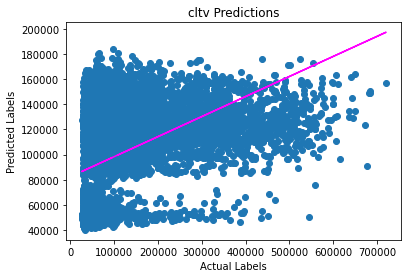

MSE: 6786049462.720284
RMSE: 82377.48152693358
R2: 0.15967232905270734


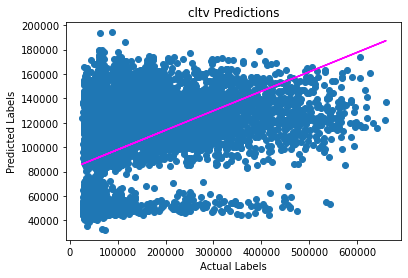

MSE: 7103900567.010827
RMSE: 84284.64016065339
R2: 0.15638721991920812


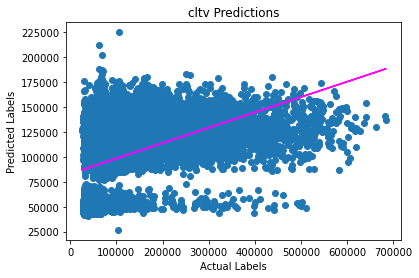

MSE: 6866729295.937409
RMSE: 82865.73052798973
R2: 0.16496116221071766


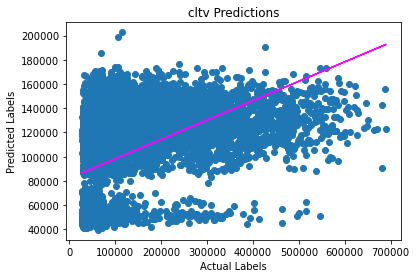

MSE: 7003820785.609255
RMSE: 83688.83309981837
R2: 0.1592666978184928


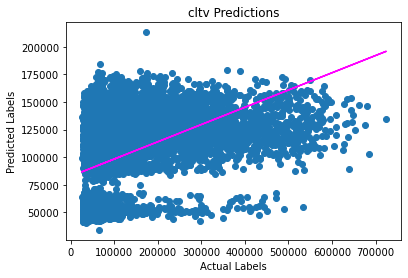

[I 2023-01-24 07:45:12,450] Trial 92 finished with value: 34485892996.2565 and parameters: {'n_estimators': 81, 'max_depth': 3, 'learning_rate': 0.09455306310673728}. Best is trial 83 with value: 34479189594.95958.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6727133102.150474
RMSE: 82019.10205647508
R2: 0.1593048540018812


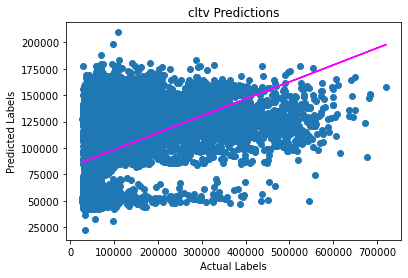

MSE: 6785664231.270961
RMSE: 82375.14328528334
R2: 0.15972003289694892


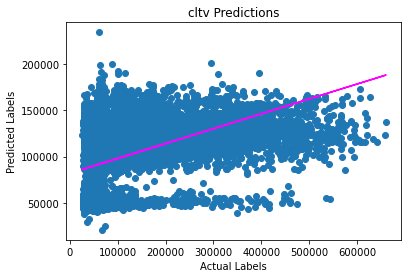

MSE: 7105958242.247025
RMSE: 84296.84598042221
R2: 0.15614286386296305


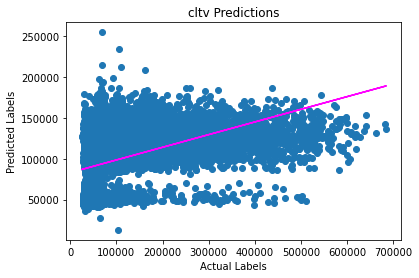

MSE: 6865212055.7731695
RMSE: 82856.57521146508
R2: 0.16514566845944123


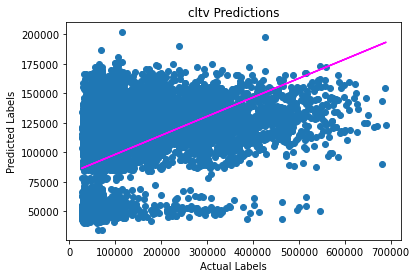

MSE: 7003130422.451154
RMSE: 83684.70841468681
R2: 0.1593495684851447


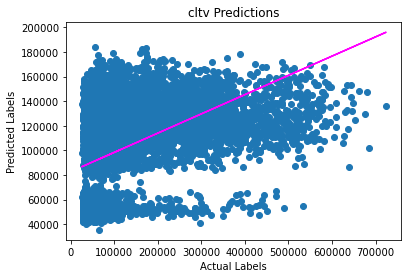

[I 2023-01-24 07:45:36,608] Trial 93 finished with value: 34487098053.892784 and parameters: {'n_estimators': 91, 'max_depth': 3, 'learning_rate': 0.10150556444644757}. Best is trial 83 with value: 34479189594.95958.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6728081388.646411
RMSE: 82024.88274082696
R2: 0.15918634588823977


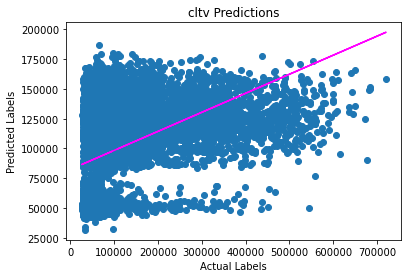

MSE: 6787593682.080382
RMSE: 82386.85381831486
R2: 0.15948110582843944


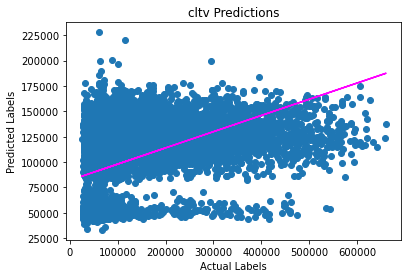

MSE: 7103806545.660093
RMSE: 84284.0823979243
R2: 0.1563983852800308


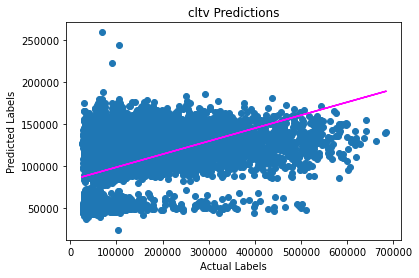

MSE: 6865656491.608084
RMSE: 82859.25712681767
R2: 0.16509162217815299


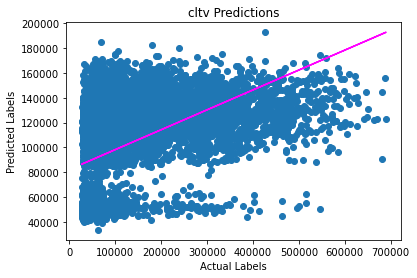

MSE: 7005194890.169117
RMSE: 83697.04230239631
R2: 0.15910175135576643


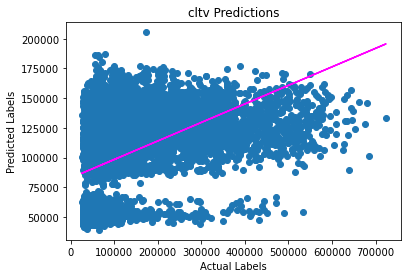

[I 2023-01-24 07:45:56,975] Trial 94 finished with value: 34490332998.16409 and parameters: {'n_estimators': 75, 'max_depth': 3, 'learning_rate': 0.10598020545614009}. Best is trial 83 with value: 34479189594.95958.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6728178966.878624
RMSE: 82025.47754739758
R2: 0.15917415145936042


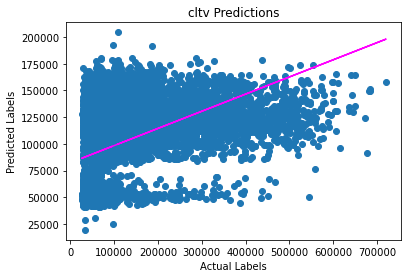

MSE: 6783421161.90914
RMSE: 82361.52719509965
R2: 0.15999779586683993


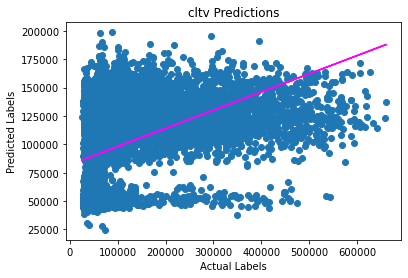

MSE: 7107245023.086052
RMSE: 84304.47807255587
R2: 0.1559900541845719


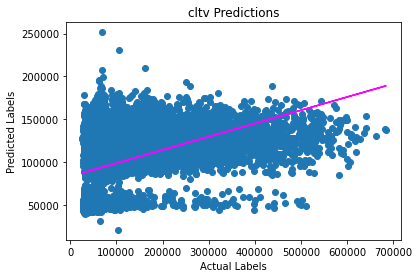

MSE: 6864988875.579278
RMSE: 82855.22841426049
R2: 0.16517280861914363


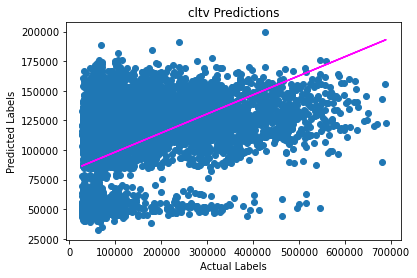

MSE: 7005236381.976514
RMSE: 83697.29017104744
R2: 0.1590967707108707


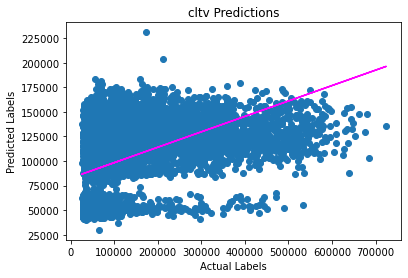

[I 2023-01-24 07:46:22,577] Trial 95 finished with value: 34489070409.42961 and parameters: {'n_estimators': 97, 'max_depth': 3, 'learning_rate': 0.09690784789959421}. Best is trial 83 with value: 34479189594.95958.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6726502169.971263
RMSE: 82015.25571484407
R2: 0.15938370209548391


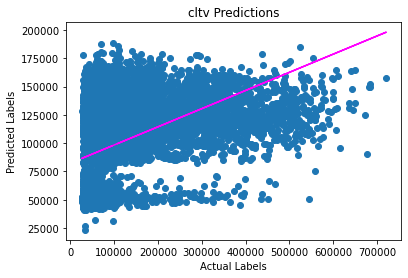

MSE: 6788835711.716602
RMSE: 82394.39126370558
R2: 0.15932730325491173


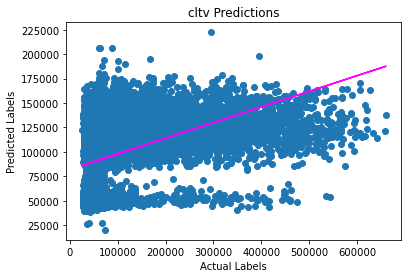

MSE: 7107626891.682565
RMSE: 84306.74286012101
R2: 0.15594470596702714


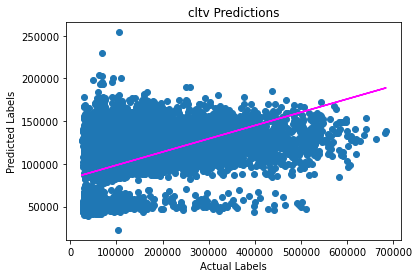

MSE: 6864124197.39182
RMSE: 82850.01024376412
R2: 0.16527795909728227


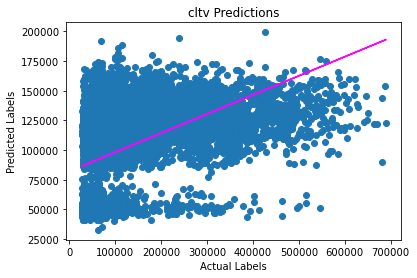

MSE: 7001746332.030231
RMSE: 83676.4383326049
R2: 0.1595157136430121


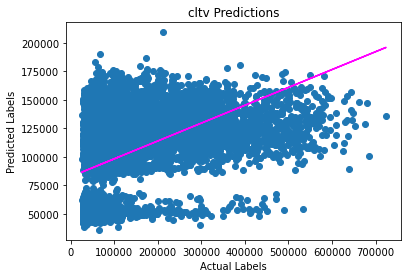

[I 2023-01-24 07:46:45,697] Trial 96 finished with value: 34488835302.79248 and parameters: {'n_estimators': 85, 'max_depth': 3, 'learning_rate': 0.10913382800696597}. Best is trial 83 with value: 34479189594.95958.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6729146105.120059
RMSE: 82031.37268825909
R2: 0.1590532874281695


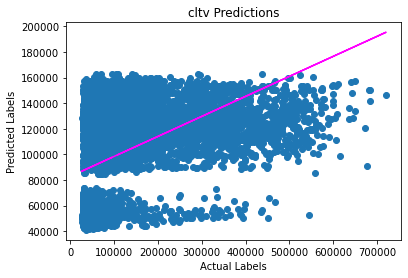

MSE: 6794652274.17646
RMSE: 82429.68078414752
R2: 0.1586070287547532


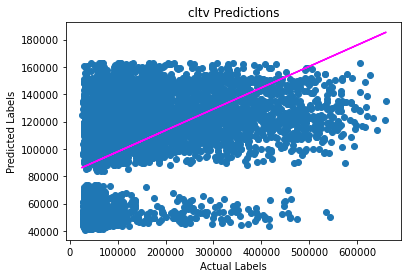

MSE: 7101988634.853748
RMSE: 84273.29728243548
R2: 0.1566142684803674


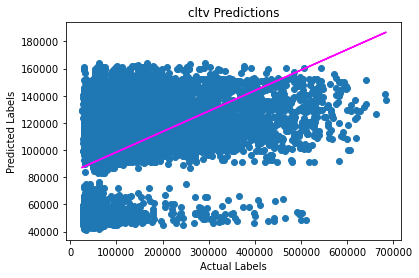

MSE: 6881894513.598067
RMSE: 82957.18482203978
R2: 0.16311697334227482


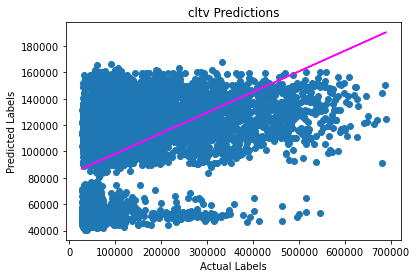

MSE: 7015790302.952423
RMSE: 83760.31460633624
R2: 0.15782988609108284


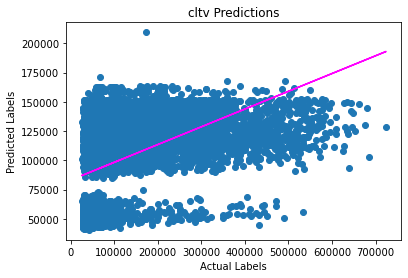

[I 2023-01-24 07:47:00,828] Trial 97 finished with value: 34523471830.70076 and parameters: {'n_estimators': 66, 'max_depth': 2, 'learning_rate': 0.10005265226132173}. Best is trial 83 with value: 34479189594.95958.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6727200248.75769
RMSE: 82019.51139063004
R2: 0.15929646263725372


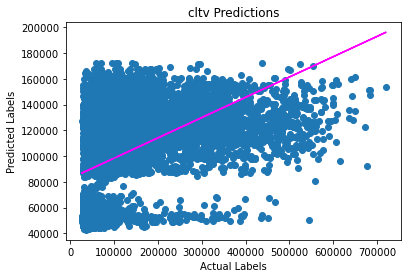

MSE: 6788396171.981726
RMSE: 82391.7239289343
R2: 0.15938173218351404


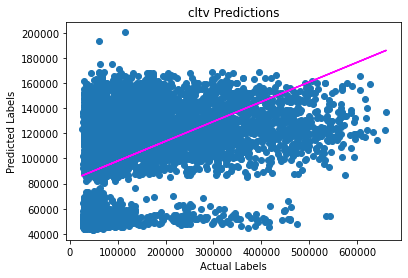

MSE: 7101751120.439231
RMSE: 84271.88807923572
R2: 0.1566424741391671


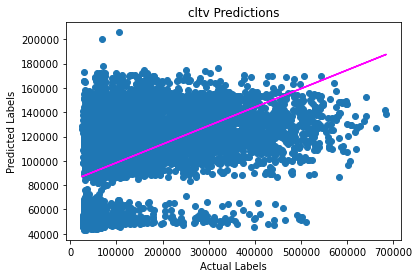

MSE: 6869352631.953819
RMSE: 82881.55785187571
R2: 0.16464214752936568


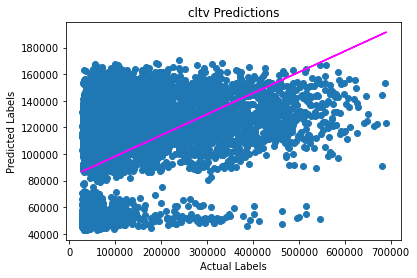

MSE: 7005858792.762881
RMSE: 83701.00831389596
R2: 0.1590220569950641


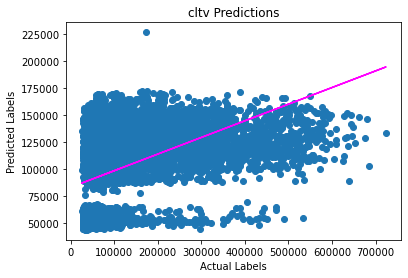

[I 2023-01-24 07:47:17,082] Trial 98 finished with value: 34492558965.89535 and parameters: {'n_estimators': 59, 'max_depth': 3, 'learning_rate': 0.09155334623382479}. Best is trial 83 with value: 34479189594.95958.
C:\Users\vkondala\AppData\Local\Temp\ipykernel_7264\4153838711.py:53: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)


MSE: 6729054744.189468
RMSE: 82030.81582057726
R2: 0.15906470487594637


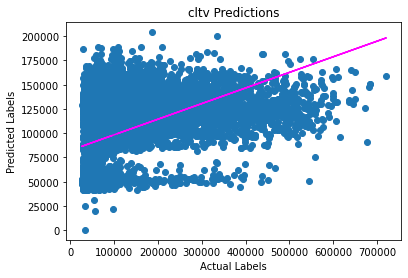

MSE: 6790425442.51327
RMSE: 82404.03778039805
R2: 0.15913044427456746


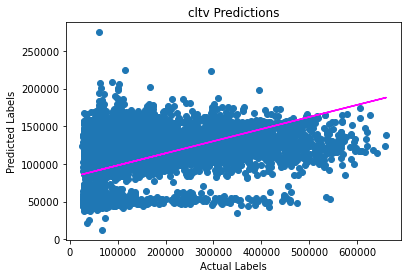

MSE: 7110056293.526253
RMSE: 84321.14974030094
R2: 0.15565620608953668


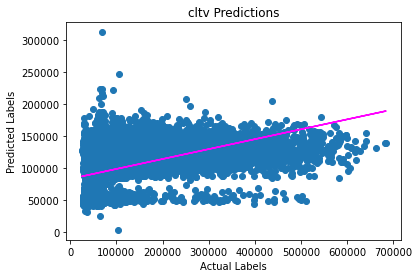

MSE: 6865538024.196604
RMSE: 82858.54225242321
R2: 0.16510602858407564


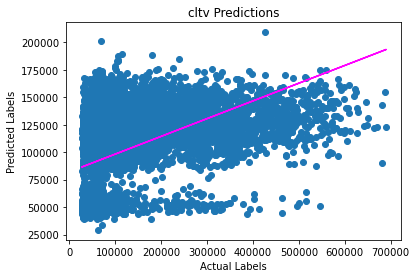

MSE: 7003319720.105122
RMSE: 83685.83942403352
R2: 0.1593268453392238


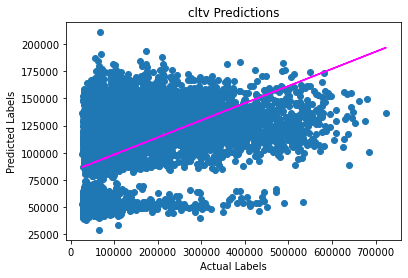

[I 2023-01-24 07:47:44,155] Trial 99 finished with value: 34498394224.530716 and parameters: {'n_estimators': 102, 'max_depth': 3, 'learning_rate': 0.10981927552234289}. Best is trial 83 with value: 34479189594.95958.


Best MSE: 34479189594.95958
Best Parameters: {'n_estimators': 81, 'max_depth': 3, 'learning_rate': 0.10259230238195848}


In [7]:
import pandas as pd
import optuna

# load the training dataset
data = pd.read_csv('train_BRCpofr.csv')

# Split the data into features and target
X = data.drop(['id','cltv'], axis=1)
y = data['cltv']


# Train the model
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor,AdaBoostRegressor
import xgboost as xg
import numpy as np

# Define preprocessing for numeric columns (scale them)
numeric_features = [5,6]
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())])

# Define preprocessing for categorical features (encode them)
categorical_features = [0,1,2,3,4,7,8,9]
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

# Create preprocessing and training pipeline
pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('regressor', GradientBoostingRegressor())])



from sklearn.model_selection import KFold
# Define the number of splits and the random seed
kf = KFold(n_splits=5, random_state=42, shuffle=True)

# Define the objective function
def objective(trial):
    n_estimators = trial.suggest_int('n_estimators', 50, 150)
    max_depth = trial.suggest_int('max_depth', 2, 6)
    learning_rate = trial.suggest_uniform('learning_rate', 0.01, 0.2)
    
    model = pipeline.set_params(regressor__n_estimators=n_estimators,
                                regressor__max_depth=max_depth,
                                regressor__learning_rate=learning_rate)

    
    score = 0
    for fold,(train_index, test_index) in enumerate(kf.split(X)):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        print(X_train.shape, X_test.shape)
        print (f"model_{fold}")
        model.fit(X_train, y_train)
      
        
        
            # Get predictions
        import matplotlib.pyplot as plt
        import seaborn as sns
        %matplotlib inline
        from sklearn.metrics import mean_squared_error, r2_score
        predictions = model.predict(X_test)

        # Display metrics
        mse = mean_squared_error(y_test, predictions)
        print("MSE:", mse)
        rmse = np.sqrt(mse)
        print("RMSE:", rmse)
        r2 = r2_score(y_test, predictions)
        print("R2:", r2)

        # Plot predicted vs actual
        plt.scatter(y_test, predictions)
        plt.xlabel('Actual Labels')
        plt.ylabel('Predicted Labels')
        plt.title('cltv Predictions')
        z = np.polyfit(y_test, predictions, 1)
        p = np.poly1d(z)
        plt.plot(y_test,p(y_test), color='magenta')
        plt.show()
        
        score += mean_squared_error(y_test, predictions)

    return score

study = optuna.create_study()
study.optimize(objective, n_trials=100)

best_params = study.best_params
best_value = study.best_value

print("Best MSE:", best_value)
print("Best Parameters:", best_params)


In [3]:
# pip install optuna

(71513, 10) (17879, 10)
model_0
Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  [5, 6]),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  [0, 1, 2, 3, 4, 7, 8, 9])])),
                ('regressor',
                 GradientBoostingRegressor(learning_rate=0.10259230238195848,
                                           n_estimators=81))])
MSE: 6726654052.356239
RMSE: 82016.18164945403
R2: 0.15936472123367051


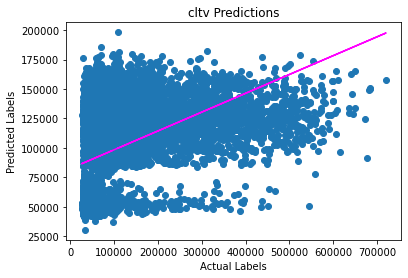

**************************************************



(71513, 10) (17879, 10)
model_1
Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  [5, 6]),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  [0, 1, 2, 3, 4, 7, 8, 9])])),
                ('regressor',
                 GradientBoostingRegressor(learning_rate=0.10259230238195848,
                                           n_estimators=81))])
MSE: 6782739344.838793
RMSE: 82357.38791898874
R2: 0.16008222639654424


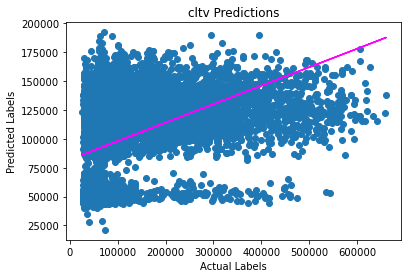

**************************************************



(71514, 10) (17878, 10)
model_2
Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  [5, 6]),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  [0, 1, 2, 3, 4, 7, 8, 9])])),
                ('regressor',
                 GradientBoostingRegressor(learning_rate=0.10259230238195848,
                                           n_estimators=81))])
MSE: 7103146547.099116
RMSE: 84280.16698547243
R2: 0.1564767623935085


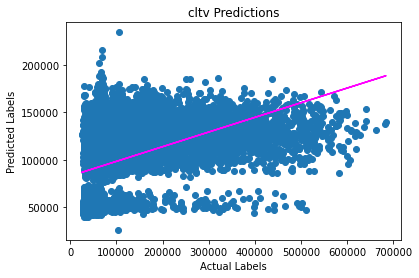

**************************************************



(71514, 10) (17878, 10)
model_3
Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  [5, 6]),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  [0, 1, 2, 3, 4, 7, 8, 9])])),
                ('regressor',
                 GradientBoostingRegressor(learning_rate=0.10259230238195848,
                                           n_estimators=81))])
MSE: 6862870035.63346
RMSE: 82842.44102894036
R2: 0.1654304733048425


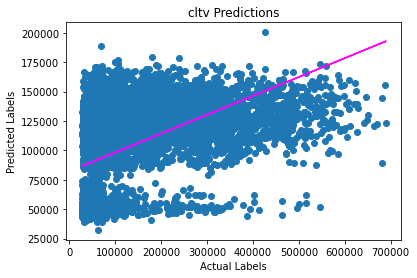

**************************************************



(71514, 10) (17878, 10)
model_4
Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  [5, 6]),
                                                 ('cat',
                                                  Pipeline(steps=[('onehot',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  [0, 1, 2, 3, 4, 7, 8, 9])])),
                ('regressor',
                 GradientBoostingRegressor(learning_rate=0.10259230238195848,
                                           n_estimators=81))])
MSE: 7004276421.209402
RMSE: 83691.55525624675
R2: 0.15921200366876664


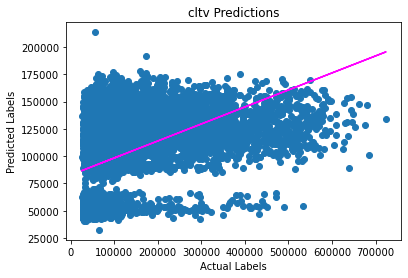

**************************************************





In [20]:
import pandas as pd

# load the training dataset
data = pd.read_csv('train_BRCpofr.csv')
data.head()


# Split the data into features and target
import numpy as np
X = data.drop(['id','cltv'], axis=1)
y = data['cltv']



# Train the model
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor,AdaBoostRegressor
import xgboost as xg
import numpy as np

# Define preprocessing for numeric columns (scale them)
numeric_features = [5,6]
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())])

# Define preprocessing for categorical features (encode them)
categorical_features = [0,1,2,3,4,7,8,9]
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

# Create preprocessing and training pipeline
pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                           ('regressor', GradientBoostingRegressor(n_estimators=81,max_depth=3,learning_rate=0.10259230238195848))])
# GradientBoostingRegressor(n_estimators=85,max_depth=3,learning_rate=0.075)
# Best MSE: 34479189594.95958
# Best Parameters: {'n_estimators': 81, 'max_depth': 3, 'learning_rate': 0.10259230238195848}



from sklearn.model_selection import KFold
# Define the number of splits and the random seed
kf = KFold(n_splits=5, random_state=42, shuffle=True)

for fold,(train_index, test_index) in enumerate(kf.split(X)):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    print(X_train.shape, X_test.shape)
    print (f"model_{fold}")
    locals()['mode_{}'.format(fold)] = pipeline.fit(X_train, (y_train))
    print(locals()['mode_{}'.format(fold)])
    
    import pickle

    # Save the trained model as a pickle string.
    saved_model = pickle.dumps(locals()['mode_{}'.format(fold)])
    
    # Get predictions
    import matplotlib.pyplot as plt
    import seaborn as sns
    %matplotlib inline
    from sklearn.metrics import mean_squared_error, r2_score
    predictions = locals()['mode_{}'.format(fold)].predict(X_test)
    
    # Display metrics
    mse = mean_squared_error(y_test, predictions)
    print("MSE:", mse)
    rmse = np.sqrt(mse)
    print("RMSE:", rmse)
    r2 = r2_score(y_test, predictions)
    print("R2:", r2)

    # Plot predicted vs actual
    plt.scatter(y_test, predictions)
    plt.xlabel('Actual Labels')
    plt.ylabel('Predicted Labels')
    plt.title('cltv Predictions')
    z = np.polyfit(y_test, predictions, 1)
    p = np.poly1d(z)
    plt.plot(y_test,p(y_test), color='magenta')
    plt.show()
    
    import pandas as pd
    # train = pd.read_csv('train.csv')
    test  = pd.read_csv("test_koRSKBP.csv")
    predictions = locals()['mode_{}'.format(fold)].predict(test.drop(['id'],axis=1))

    # predictions = model.predict(test)
    # predictions = scaler_y.inverse_transform(predictions)
    # #taking the mean of cltv from the training set
    # test['cltv']=train['cltv'].mean()
    test_id=test['id']
    df = pd.DataFrame({'id':np.array(test_id),'cltv':predictions}, columns = ['id','cltv'])
    #creating the sample submission file
    sample_submission = df[['id','cltv']]
    sample_submission.to_csv(f"sample_submission_GBR_model_new_{fold}.csv",index=False)
    
    print("*"*50)
    print("\n\n")
    
    

In [11]:
var1 = 5
var2 = 6
new_var_name = 'var2_{}'.format(var1)
globals()[new_var_name] = var2

In [12]:
var2_5

6

In [16]:
# global()['var2_app_{}'.format(var1)]=10
locals()['var{}'.format(var1)] = var1*2

In [17]:
var5

10

In [18]:
locals()['var{}'.format(var1)]

10